# Projet Data Science HMIN232 - 2020/2021
Ce projet a pour but de proposer des modèles de classification supervisée d'assertions faites
par des figures politiques selon leur valeur de véracité, ou autrement dit, de proposer une
approche de fact-checking automatique.

Groupe : 

## **Installation**

In [31]:
# Importation des différentes librairies, classes et fonctions utilespour le notebook

#Sickit learn met régulièrement à jour des versions et 
#indique des futurs warnings. 
#ces deux lignes permettent de ne pas les afficher.
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)


# librairies générales
import pandas as pd
import re
from tabulate import tabulate
import time
import numpy as np
import pickle
import string
import base64

# librairie affichage
import matplotlib.pyplot as plt
import seaborn as sns

# librairies scikit learn
import sklearn
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.base import TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import  log_loss


# librairies des classifiers utilisés
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
#from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
#from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

# librairies NLTK
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer 
from nltk.corpus import stopwords
from nltk import word_tokenize 

 
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')
stop_words = set(stopwords.words('english')) 

    

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\pc\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\pc\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\pc\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [32]:
# fonctions utilities (affichage, confusion, etc.)
from MyNLPUtilities import *


## les Données

Suite a une analyse des donnés communiqués dans le fichier csv ,nous avons décidé d'utiliser la platforme afin de télécharger les données contenant les valeur de véracités,tout en profitant du fait que ces dérniére sont plus propres que c'elles du fichier csv.



## 1 Importation des donnés


In [33]:

warnings.filterwarnings("ignore", category=FutureWarning)

df = pd.read_csv (r'Rendu/DATASETS/data_sets.csv')
row, col = df.shape
print(f" le data frame est composé de {row} lignes et {col} colonnes")
# suppression des lignes qui contiennes les attribus 
df = df[df['id']!= 'id']
row1, col1 = df.shape
print(f" le data frame est composé de {row1} lignes et {col1} colonnes")
df.head()

colors = ['lightskyblue', 'gold', 'yellowgreen','orangered','aqua','indigo']
df["truthRating"].value_counts().plot(kind='pie', 
                                  figsize=(6,6),
                                  title='Pie', 
                                  fontsize=11, 
                                  legend=True,
                                     colors=colors)
print(df["truthRating"].value_counts())

# dfn= df.copy()
# dfn['named_entities_article'].replace('', np.nan, inplace=True)
# dfn['named_entities_claim'].replace("", np.nan, inplace=True)
# dfn['keywords'].replace("", np.nan, inplace=True)
# dfn.dropna(subset=['named_entities_article'], inplace=True)
# dfn.dropna(subset=['named_entities_claim'], inplace=True)
# dfn.dropna(subset=['keywords'], inplace=True)
# row2, col2 = dfn.shape
# print(f" le data frame est composé de {row2} lignes et {col2} colonnes")


display(df)

 le data frame est composé de 24454 lignes et 14 colonnes
 le data frame est composé de 24452 lignes et 14 colonnes
1    10000
2    10000
3     4452
Name: truthRating, dtype: int64


,id,text,date,truthRating,ratingName,author,headline,named_entities_claim,named_entities_article,keywords,source,sourceURL,link,language
0,http://data.gesis.org/claimskg/claim_review/36...,'There will be no public funding for abortion ...,2010-03-21,3,TRUE,Bart Stupak,Stupak revises abortion stance on health care ...,"Abortion rights,Barack Obama,Bart Stupak,Ben N...",abortion,"Abortion,Health Care",politifact,http://www.politifact.com,http://www.politifact.com/truth-o-meter/statem...,English
1,http://data.gesis.org/claimskg/claim_review/e6...,Central Health 'is the only hospital district ...,2011-03-15,3,TRUE,Wayne Christian,State Rep. Wayne Christian says Central Health...,"Austin American-Statesman,Harris County Hospit...",NaN,Abortion,politifact,http://www.politifact.com,http://www.politifact.com/texas/statements/201...,English
2,http://data.gesis.org/claimskg/claim_review/e0...,Says most of Perry's chiefs of staff have been...,2010-08-14,3,TRUE,Bill White,Bill White says most of Gov. Rick Perry's chie...,"AT&T,Bill Clements,Bill White,Bracewell & Giul...",NaN,Ethics,politifact,http://www.politifact.com,http://www.politifact.com/texas/statements/201...,English
3,http://data.gesis.org/claimskg/claim_review/48...,Says 'as Co-Chair of the Joint Ways & Means Co...,2012-09-28,3,TRUE,Mary Nolan,Did Mary Nolan secure funding for Milwaukie br...,"Carolyn Tomei,Dave Hunt,Fetsch,Jeff Merkley,Ka...",Portland-Milwaukie Light Rail project,"State Budget,State Finances,Transportation",politifact,http://www.politifact.com,http://www.politifact.com/oregon/statements/20...,English
4,http://data.gesis.org/claimskg/claim_review/80...,Says Gary Farmer’s claim that he 'received an ...,2016-07-08,3,TRUE,Jim Waldman,Florida Senate candidate never actually receiv...,"Gary Farmer,Gwyndolen Clarke-Reed,Jim Waldman,...",Gary Farmer,Guns,politifact,http://www.politifact.com,http://www.politifact.com/florida/statements/2...,English
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24449,http://data.gesis.org/claimskg/claim_review/41...,'The city that I was mayor of was 50 percent L...,2018-06-07,2,MIXTURE,Lou Barletta,Hazleton wasn’t half-Latino when Lou Barletta ...,"Barletta,Bob Casey,Fox Business Network,Hazlet...",Latino,Immigration,politifact,http://www.politifact.com,http://www.politifact.com/pennsylvania/stateme...,English
24450,http://data.gesis.org/claimskg/claim_review/9e...,A set of images show a congenital anomaly that...,Unknown,2,MIXTURE,Unknown,Is This a Real Hand With Eight Fingers?,"American Society for Surgery of the Hand,Bilas...",NaN,"hands, Medical, medical anomalies, mirror hand",snopes,http://www.snopes.com,https://www.snopes.com/fact-check/real-hand-ei...,English
24451,http://data.gesis.org/claimskg/claim_review/1a...,'You see 34 people (are) murdered every single...,2012-12-23,2,MIXTURE,Cory Booker,Cory Booker says 34 Americans are killed by gu...,"ABC,Centers for Disease Control and Prevention...",NaN,"Crime,Guns",politifact,http://www.politifact.com,http://www.politifact.com/new-jersey/statement...,English
24452,http://data.gesis.org/claimskg/claim_review/28...,'White men have committed more mass shootings ...,2017-10-02,2,MIXTURE,Newsweek,Are white males responsible for more mass shoo...,"2015 San Bernardino shooting,Aurora, Colo,Foll...",NaN,Guns,politifact,http://www.politifact.com,http://www.politifact.com/punditfact/statement...,English


In [34]:
df.info()



#distribution des rating sur l'ensemble du csv.
df['ratingName'].value_counts().plot(kind='pie',
                                     figsize=(6,6),
                                     title='Pie',
                                     fontsize=11,
                                     legend=True, colors=colors)
plt.show()




#distribution des claims sur l'ensemble des sites
df['source'].value_counts().plot(kind='pie',
                                 figsize=(6,6),
                                 title='Pie',
                                 fontsize=11,
                                 legend=True, colors=colors)
plt.show()


#distribution des labels de véracité sur l'ensemble des sites
chart = sns.catplot('source', data = df, hue = 'truthRating', kind= 'count')
for ax in chart.axes.ravel():
    plt.setp(ax.get_xticklabels(), rotation = 45, horizontalalignment = "right")
    
plt.show()

#visualisation des colonnes avec des lignes vides.
sns.heatmap(df.isnull(), cbar=False)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24452 entries, 0 to 24453
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   id                      24452 non-null  object
 1   text                    24452 non-null  object
 2   date                    24452 non-null  object
 3   truthRating             24452 non-null  object
 4   ratingName              24452 non-null  object
 5   author                  24452 non-null  object
 6   headline                24452 non-null  object
 7   named_entities_claim    24421 non-null  object
 8   named_entities_article  15340 non-null  object
 9   keywords                23162 non-null  object
 10  source                  24452 non-null  object
 11  sourceURL               24452 non-null  object
 12  link                    24452 non-null  object
 13  language                24452 non-null  object
dtypes: object(14)
memory usage: 2.8+ MB


<AxesSubplot:>

On remarque que seule quelques colonne contiennes des valeurs null('named_entities_claim','named_entities_article','keywords').Afin d'exploiter un maximum de donnés on 
décide de ne supprimer les lignes contenant des valeurs null que lorsque la colonne est considérer lors de la selection de featurs .

## 2 Pré traitement des données 
explications des étapes de prés traitemens 

### 2.1 Creation d'une classe de prés traitements 



Fonction de préTraitement 

In [35]:
import re
import string

import nltk
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer 
from nltk.corpus import stopwords
from nltk import word_tokenize
import inflect
import unicodedata

nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')
stop_words = set(stopwords.words('english')) 

def MyCleanText(X, 
               lowercase=False, # mettre en minuscule
               removestopwords=False, # supprimer les stopwords
               removedigit=False, # supprimer les nombres 
               transformdigit=False,# transformer les nombres en lettrres 
               getstemmer=False, # conserver la racine des termes
               getlemmatisation=False,# lematisation des termes 
               remove_non_ascii=False,# suppriimer les caractéres_non_ascii
              ):
    
    sentence=str(X)

    # suppression des caractères spéciaux
    sentence = re.sub(r'[^\w\s]',' ', sentence)
    # suppression de tous les caractères uniques
    sentence = re.sub(r'\s+[a-zA-Z]\s+', ' ', sentence)
    # substitution des espaces multiples par un seul espace
    sentence = re.sub(r'\s+', ' ', sentence, flags=re.I)

    # decoupage en mots
    tokens = word_tokenize(sentence)
    if lowercase:
          tokens = [token.lower() for token in tokens]

    # suppression ponctuation
    table = str.maketrans('', '', string.punctuation)
    words = [token.translate(table) for token in tokens]

    # suppression des tokens non alphabetique ou numerique
    words = [word for word in words if word.isalnum()]
    
    # suppression des tokens numerique
    if removedigit:
        words = [word for word in words if not word.isdigit()]
    # transformert les nombres en lettres 
    if transformdigit:
        p = inflect.engine()
        new_words = []
        for word in words:
            if word.isdigit():
                new_word = p.number_to_words(word)
                new_words.append(new_word)
            else:
                new_words.append(word)
                
        words = new_words
        
        
        
    # suppression des stopwords
    if removestopwords:
        words = [word for word in words if not word in stop_words]

    # lemmatisation
    if getlemmatisation:
        lemmatizer=WordNetLemmatizer()
        words = [lemmatizer.lemmatize(word)for word in words]
        

    # racinisation
    if getstemmer:
        ps = PorterStemmer()
        words=[ps.stem(word) for word in words]
        
    sentence= ' '.join(words)
    
    # suppression des caractéres non ascii
    if remove_non_ascii:
        new_words = []
        for word in words:
            new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
            new_words.append(new_word)
        words = new_words 
    
    
    
    return sentence   

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\pc\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\pc\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\pc\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [36]:
from sklearn.base import BaseEstimator, TransformerMixin

class TextNormalizer(BaseEstimator, TransformerMixin):
    def __init__(self, 
                 removestopwords=False, # suppression des stopwords
                 lowercase=False,# passage en minuscule
                 removedigit=False, # supprimer les nombres 
                 transformdigit=False, # transforamation des chiffre en lettres
                 getstemmer=False,# racinisation des termes 
                 getlemmatisation=False, # lemmatisation des termes 
                 remove_non_ascii=False # supprimer les caractéres non ascii
                ):
        
        self.lowercase=lowercase
        self.getstemmer=getstemmer
        self.removestopwords=removestopwords
        self.getlemmatisation=getlemmatisation
        self.removedigit=removedigit
        self.transformdigit=transformdigit
        self.remove_non_ascii=remove_non_ascii

    def transform(self, X, **transform_params):
        # Nettoyage du texte
        X=X.copy() # pour conserver le fichier d'origine
        return [MyCleanText(text,lowercase=self.lowercase,
                            getstemmer=self.getstemmer,
                            removestopwords=self.removestopwords,
                            getlemmatisation=self.getlemmatisation,
                            removedigit=self.removedigit,
                            transformdigit=self.transformdigit,
                            remove_non_ascii=self.remove_non_ascii) for text in X]

    def fit(self, X, y=None, **fit_params):
        return self
    
    def fit_transform(self, X, y=None, **fit_params):
        return self.fit(X).transform(X)

    def get_params(self, deep=True):
        return {
            'lowercase':self.lowercase,
            'getstemmer':self.getstemmer,
            'removestopwords':self.removestopwords,
            'getlemmatisation':self.getlemmatisation,
            'removedigit':self.removedigit,
            'transformdigit':self.transformdigit,
            'remove_non_ascii':self.remove_non_ascii
        }    
    
    def set_params (self, **parameters):
        for parameter, value in parameters.items():
            setattr(self,parameter,value)
        return self    


### 2.2 Sépartion en diffenrents data frame selon les classes 

1    10000
3     4452
Name: truthRating, dtype: int64


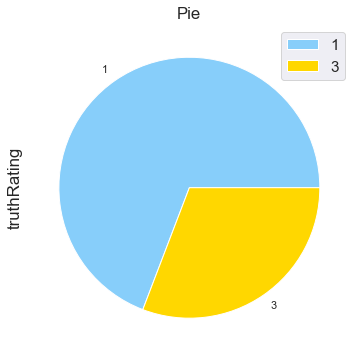

1    14452
0    10000
Name: truthRating, dtype: int64


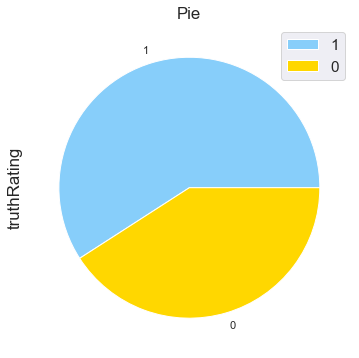

1    10000
2    10000
3     4452
Name: truthRating, dtype: int64


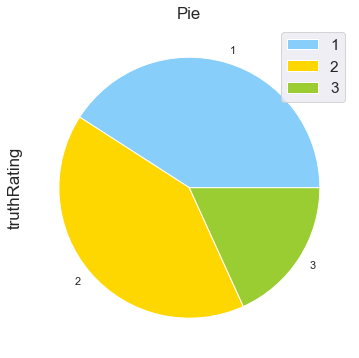

In [37]:
colors = ['lightskyblue', 'gold', 'yellowgreen']
# vrai / faux 
dfVF= df.copy()
dfVF = dfVF[dfVF["truthRating"] != '2']
print(dfVF["truthRating"].value_counts())

dfVF["truthRating"].value_counts().plot(kind='pie', 
                                  figsize=(6,6),
                                  title='Pie', 
                                  fontsize=11, 
                                  legend=True,
                                  colors=colors )

plt.show()

#vair,faux / mixture
dfVF_M= df.copy()
dfVF_M['truthRating'] =dfVF_M['truthRating'].apply(lambda x: '1' if x == '1' or x == '3' else '0')
print(dfVF_M["truthRating"].value_counts())


dfVF_M["truthRating"].value_counts().plot(kind='pie', 
                                  figsize=(6,6),
                                  title='Pie', 
                                  fontsize=11, 
                                  legend=True,
                                  colors=colors )

plt.show()

#vrai / faux / mixture
dfVFM=df.copy()
print(dfVFM["truthRating"].value_counts())


dfVFM["truthRating"].value_counts().plot(kind='pie', 
                                  figsize=(6,6),
                                  title='Pie', 
                                  fontsize=11, 
                                  legend=True,
                                  colors=colors)

plt.show()

### 2.3 Application des diferentes prés traitement

Nous avons 7 operation de prés traitement organiser de la maniére suivente : 1. lowercase=False, # mettre en minuscule 1. removestopwords=False, # supprimer les stopwords 1. removedigit=False, # supprimer les nombres 1. transformdigit=False,# transformer les nombres en lettrres 1. getstemmer=False, # conserver la racine des termes 1. getlemmatisation=False,# lematisation des termes 1. remove_non_ascii=False,# suppriimer les caractéres_non_ascii

l'application des operation de prés traitement dans une colonne de type 'text_XXX'

|Opération ||indice| |----------||------| |lowercase||l| |removestopwords||rsw| |removedigit||rd| |transformdigit||td| |getstemmer||st| |getlemmatisation||lem| |remove_non_ascii||na|

In [11]:
text_normalizer=TextNormalizer(lowercase=True)  
dfVF["text_l"]=text_normalizer.fit_transform(dfVF.text)

text_normalizer=TextNormalizer(lowercase=True,removestopwords=True)  
dfVF["text_l_rsw"]=text_normalizer.fit_transform(dfVF.text)

text_normalizer=TextNormalizer(removestopwords=True)  
dfVF["text_rsw"]=text_normalizer.fit_transform(dfVF.text)

text_normalizer=TextNormalizer(removedigit=True)  
dfVF["text_rd"]=text_normalizer.fit_transform(dfVF.text)

text_normalizer=TextNormalizer(transformdigit=True)  
dfVF["text_td"]=text_normalizer.fit_transform(dfVF.text)

text_normalizer=TextNormalizer(getstemmer=True)  
dfVF["text_st"]=text_normalizer.fit_transform(dfVF.text)

text_normalizer=TextNormalizer(getlemmatisation=True,lowercase=True)  
dfVF["text_lem"]=text_normalizer.fit_transform(dfVF.text)

text_normalizer=TextNormalizer(getlemmatisation=True,removestopwords=True,lowercase=True)  
dfVF["text_lem_rsw"]=text_normalizer.fit_transform(dfVF.text)

ext_normalizer=TextNormalizer(getlemmatisation=True,removestopwords=True,lowercase=True,transformdigit=True)  
dfVF["text_lem_rsw_td"]=text_normalizer.fit_transform(dfVF.text)

text_normalizer=TextNormalizer(remove_non_ascii=True)  
dfVF["text_na"]=text_normalizer.fit_transform(dfVF.text)

In [12]:
# print ("texte après application des pré-traitements")
print(dfVF["text_l"])

print(dfVF["text_lem"])

0        there will be no public funding for abortion i...
1        central health is the only hospital district i...
2        says most of perry chiefs of staff have been l...
3        says as co chair of the joint ways means commi...
4        says gary farmer claim that he received an fro...
                               ...                        
14448    kevin lovable yet geeky sidekick in tv the won...
14449    e mail reproduces george carlin list of new ru...
14450    obamacare medical codes confirm execution by b...
14451    wrestler john cena died in car accident in jul...
14452    missouri is one of 13 states this year have se...
Name: text_l, Length: 14452, dtype: object
0        there will be no public funding for abortion i...
1        central health is the only hospital district i...
2        say most of perry chief of staff have been lob...
3        say a co chair of the joint way mean committee...
4        say gary farmer claim that he received an from...
             

# 3 Tache 1 :  VRAIS / FAUX

## Test d'un calssifieur sur la colonne text sans prétraitement 

In [13]:

# selection des données
X=dfVF.text
y=dfVF.truthRating


# Création d'un jeu d'apprentissage et de test
trainsize=0.7 # 70% pour le jeu d'apprentissage, il reste 30% du jeu de données pour le test

testsize= 0.3
seed=30
X_train,X_test,y_train,y_test=train_test_split(X, 
                                               y, 
                                               train_size=trainsize, 
                                               random_state=seed,
                                               test_size=testsize)

# création du pipeline en ajoutant le classifier
pipeSVM = Pipeline([("cleaner", TextNormalizer()),
                 ("count_vectorizer", CountVectorizer(lowercase=False)),
                 ("SVM", SVC())])
pipeSVM.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [14]:
y_pred = pipeSVM.predict(X_test)

MyshowAllScores(y_test,y_pred)

Accuracy : 0.722
Classification Report
              precision    recall  f1-score   support

           1    0.73014   0.95729   0.82843      3044
           3    0.62319   0.16641   0.26268      1292

    accuracy                        0.72163      4336
   macro avg    0.67667   0.56185   0.54555      4336
weighted avg    0.69827   0.72163   0.65985      4336



In [15]:
pipeSVM = Pipeline([("cleaner", TextNormalizer()),
                 ("count_vectorizer", TfidfVectorizer(lowercase=False)),
                 ("SVM", SVC())])
pipeSVM.fit(X_train,y_train)

print("pipeline créé")
y_pred = pipeSVM.predict(X_test)

MyshowAllScores(y_test,y_pred)

pipeline créé
Accuracy : 0.725
Classification Report
              precision    recall  f1-score   support

           1    0.73767   0.94317   0.82785      3044
           3    0.61036   0.20975   0.31221      1292

    accuracy                        0.72463      4336
   macro avg    0.67401   0.57646   0.57003      4336
weighted avg    0.69973   0.72463   0.67421      4336



On remarque on légére ameloration au niveux de l'accuracy, néaumoins le résultas n'est pas trés satisfesant 
car on remarque grace a la matrice de confusion que on a un nombre important de faux négatifs.

### Test d'un calssifieur sur la colonne text avec quelques prétraitement 


In [16]:
# création du pipeline en ajoutant le classifier


pipe = Pipeline([("cleaner", TextNormalizer(lowercase=True ,removestopwords=True,removedigit=True)),
                 ("count_vectorizer", CountVectorizer(lowercase=False)),
                 ("SVM", SVC())])
pipe.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [17]:
y_pred = pipe.predict(X_test)

MyshowAllScores(y_test,y_pred)

Accuracy : 0.726
Classification Report
              precision    recall  f1-score   support

           1    0.73548   0.95269   0.83011      3044
           3    0.63359   0.19272   0.29555      1292

    accuracy                        0.72625      4336
   macro avg    0.68453   0.57271   0.56283      4336
weighted avg    0.70512   0.72625   0.67083      4336



In [18]:
# création du pipeline en ajoutant le classifier


pipeTFIDF = Pipeline([("cleaner", TextNormalizer(lowercase=True ,removestopwords=True,removedigit=True)),
                 ("count_vectorizer", TfidfVectorizer(lowercase=False)),
                 ("SVM", SVC())])
pipeTFIDF.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [19]:
y_pred = pipeTFIDF.predict(X_test)

MyshowAllScores(y_test,y_pred)

Accuracy : 0.726
Classification Report
              precision    recall  f1-score   support

           1    0.73607   0.95007   0.82949      3044
           3    0.62654   0.19737   0.30018      1292

    accuracy                        0.72578      4336
   macro avg    0.68130   0.57372   0.56483      4336
weighted avg    0.70343   0.72578   0.67177      4336



In [20]:
# pipeline de l'utilisation de CountVectorizer sur le texte presque sans traitement
CV_brut = Pipeline([("cleaner", TextNormalizer(removestopwords=True,lowercase=True,
                                               getstemmer=True,removedigit=True)), 
                    ("count_vectorizer", CountVectorizer(lowercase=False)),
                    ("SVM", SVC())])

# pipeline de l'utilisation de TfidfVectorizer sur le texte presque sans traitement
TFIDF_brut = Pipeline ([("cleaner", TextNormalizer(removestopwords=True,lowercase=True,
                                               getstemmer=True,removedigit=True)), 
                    ("count_vectorizer", TfidfVectorizer(lowercase=False)),
                    ("SVM", SVC())])

# Liste de tous les modèles à tester
all_models = [
    ("CV_brut", CV_brut),
    ("TFIDF_brut", TFIDF_brut)]

In [21]:



# Evaluation des différents pipelines
unsorted_scores = [(name, cross_val_score(model, X, y, cv=5).mean()) for name, model in all_models]
scores = sorted(unsorted_scores, key=lambda x: -x[1])


print (tabulate(scores, floatfmt=".3f", headers=("Pipeline", 'Score')))

Pipeline      Score
----------  -------
TFIDF_brut    0.717
CV_brut       0.715


le TFIDF nous donne un meilleur score.Pour cette raisons nous allons le garder comme approche de vectorisation
tous au long.

### Tester la crosse validation 

In [22]:


# selection des données
X=dfVF.text
y=dfVF.truthRating


seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)


scoring = 'accuracy'


score = cross_val_score(pipeTFIDF, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std())   

Les différentes accuracy pour les 10 évaluations sont [0.7275242  0.72683264 0.71972318 0.71764706 0.71626298 0.70449827
 0.71764706 0.73702422 0.72802768 0.70934256] 

Accuracy moyenne :  0.7204529856853652  standard deviation 0.009135172533610743


In [24]:


# selection des données
X=dfVF.text_lem
y=dfVF.truthRating


seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)


scoring = 'accuracy'


score = cross_val_score(pipeTFIDF, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std()) 

Les différentes accuracy pour les 10 évaluations sont [0.71300138 0.72614108 0.71972318 0.7100346  0.71764706 0.71487889
 0.70865052 0.72179931 0.72318339 0.71349481] 

Accuracy moyenne :  0.7168554226669922  standard deviation 0.005508696607238479


On constate une infime amélioration du stadard de derivation, mais avec une accuracy inférieure 

### Tester l'accuracy de plusieurs classifieur 

paramétrage par defaut des classifieurs 

In [25]:


# selection des données
X=dfVF.text
y=dfVF.truthRating

count_vect = CountVectorizer()
datatarget = dfVF['truthRating']

print(datatarget.shape)

X_train_counts = count_vect.fit_transform(dfVF.text)
print(X_train_counts.shape)

tf_transformer = TfidfTransformer(use_idf=True).fit(X_train_counts)
X_train_tf = tf_transformer.transform(X_train_counts)
print(X_train_tf.shape)

validation_size=0.3 #30% du jeu de données pour le test
testsize= 1-validation_size
seed=30

X_train,X_test,y_train,y_test=train_test_split(X_train_tf, 
                                               datatarget, 
                                               train_size=validation_size, 
                                               random_state=seed,
                                               test_size=testsize)

seed=7
models = [
            'ADB',
            'GBC',
            'RFC',
            'KNC',
            'SVC',
            'logisticRegression'
         ]
clfs = [
        AdaBoostClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        RandomForestClassifier(random_state=seed,n_jobs=-1),
        KNeighborsClassifier(n_jobs=-1),
        SVC(random_state=seed,probability=True),
        LogisticRegression(solver='lbfgs',max_iter = 20000)
        ]

params = {
            models[0]:{'learning_rate':[0.01], 'n_estimators':[150]},
    
            models[1]:{'learning_rate':[0.01],'n_estimators':[50,100], 'max_depth':[3],
                       'min_samples_split':[2,5],'min_samples_leaf': [2,5]},
    
            models[2]:{'n_estimators':[100], 
                       'min_samples_split':[2],
                      'min_samples_leaf': [5]},
    
            models[3]:{'n_neighbors':[2,5,10], 'weights':['distance'],'leaf_size': [2,5,10]},
    
            models[4]:{'C':[100], 'tol': [0.005],
                       'kernel':['sigmoid','linear']},
    
            models[5]:{'C':[2000], 'tol': [0.0001], 
                        'solver' : ['lbfgs', 'liblinear', 'saga']}
         }

y_test = 0
test_scores = []


for name, estimator in zip(models,clfs):
    print(name)
    clf = GridSearchCV(estimator, params[name], scoring='accuracy',
                       refit='True', n_jobs=-1, cv=5)
    clf.fit(X_train, y_train)

    print("best params: " + str(clf.best_params_))
    print("scores: " + str(clf.best_score_))
    estimates = clf.predict_proba(X_test)

(14452,)
(14452, 19147)
(14452, 19147)
ADB
best params: {'learning_rate': 0.01, 'n_estimators': 150}
scores: 0.6851211072664359
GBC
best params: {'learning_rate': 0.01, 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
scores: 0.6906574394463668
RFC
best params: {'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 100}
scores: 0.6901960784313725
KNC
best params: {'leaf_size': 2, 'n_neighbors': 10, 'weights': 'distance'}
scores: 0.6742791234140715
SVC
best params: {'C': 100, 'kernel': 'linear', 'tol': 0.005}
scores: 0.6500576701268743
logisticRegression
best params: {'C': 2000, 'solver': 'saga', 'tol': 0.0001}
scores: 0.6659746251441753


Deux algorithmes se distingue relativement __GradientBoostingClassifier__ et le __RandomForestClassifier__.

### Features et prtraitements 

In [26]:
def piplineClassification(df,colonnes,clf,target) :
    
    text_clf = Pipeline([
     ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer(use_idf=True)),
     ('clf', clf), ])
    
    colonnesTrain = colonnes
    datatarget = df[target]
    
    trainset = df[colonnesTrain]
    trainset = trainset.apply(
    lambda x: ','.join(x.dropna().astype(str)),
    axis=1
)

    validation_size=0.3 #30% du jeu de données pour le test

    testsize= 1-validation_size
    seed=30

    X_train,X_test,y_train,y_test=train_test_split(trainset, 
                                               datatarget, 
                                               train_size=validation_size, 
                                               random_state=seed,
                                               test_size=testsize)
    text_clf.fit(X_train, y_train)
    print("prediction avec les features: ")
    print(colonnesTrain)
    result = text_clf.predict(X_test)
    print("\x1b[31m\"accuracy" ,accuracy_score(result, y_test),"\"\x1b[0m"'\n')
 

    conf = confusion_matrix(y_test, result)
    print ('\n matrice de confusion \n',conf)
    print ('\n',classification_report(y_test, result))
    return 

### GradientBoostingClassifier

Nous alons observer léffet  des diferents prétraitment sur le résultas de la classification .

In [27]:
clf1 = GradientBoostingClassifier(learning_rate= 0.01, max_depth=3, min_samples_leaf= 2,
                                 min_samples_split= 2,n_estimators=100)
print("prétraitement : aucun")
colonnesTrain =['text']
piplineClassification(dfVF,colonnesTrain,clf1,'truthRating') 

print("prétraitement :passage en minuscule")
colonnesTrain =['text_l']
piplineClassification(dfVF,colonnesTrain,clf1,'truthRating')

print("prétraitement :passage en minuscule et suppression des stopwords ")
colonnesTrain =['text_l_rsw']
piplineClassification(dfVF,colonnesTrain,clf1,'truthRating')

print("prétraitement ")
colonnesTrain =['text_rsw']
piplineClassification(dfVF,colonnesTrain,clf1,'truthRating')

print("prétraitement :transforamation des chiffre en lettres")
colonnesTrain =['text_td']
piplineClassification(dfVF,colonnesTrain,clf1,'truthRating')

print("prétraitement :racinisation des termes")
colonnesTrain =['text_st']
piplineClassification(dfVF,colonnesTrain,clf1,'truthRating')

print("prétraitement :lemmatisation des termes ")
colonnesTrain =['text_lem']
piplineClassification(dfVF,colonnesTrain,clf1,'truthRating')

print("prétraitement :lemmatisation des termes et suppression des stopwords")
colonnesTrain =['text_lem_rsw']
piplineClassification(dfVF,colonnesTrain,clf1,'truthRating')

prétraitement : aucun
prediction avec les features: 
['text']
"accuracy 0.7000098843530691 "


 matrice de confusion 
 [[6974   63]
 [2972  108]]

               precision    recall  f1-score   support

           1       0.70      0.99      0.82      7037
           3       0.63      0.04      0.07      3080

    accuracy                           0.70     10117
   macro avg       0.67      0.51      0.44     10117
weighted avg       0.68      0.70      0.59     10117

prétraitement :passage en minuscule
prediction avec les features: 
['text_l']
"accuracy 0.6999110408223782 "


 matrice de confusion 
 [[6974   63]
 [2973  107]]

               precision    recall  f1-score   support

           1       0.70      0.99      0.82      7037
           3       0.63      0.03      0.07      3080

    accuracy                           0.70     10117
   macro avg       0.67      0.51      0.44     10117
weighted avg       0.68      0.70      0.59     10117

prétraitement :passage en minuscul

- On observe une légére augmentation de l'accuracy lors de la supression des stop words, la transformation des chiffres en lettre,la lematisation.
- Lorsque on ne garde que les racines des termes ,on remarque au niveaux de la matrice de confusion que on a beaucoup moin de faux positifs et de faux négatife ce qui c'est positivement répércuté sur le rappel mais na pas forcement amélioré l'acuracy.  
Nous allons combiner quelques prétraitment avec differentes features. 

#### Classification avec plusieurs features

In [28]:
print("prétraitement :suppression des stopwords + author")
colonnesTrain =['text_lem_rsw','author']
piplineClassification(dfVF,colonnesTrain,clf1,'truthRating')

print("prétraitement :lemmatisation des termes + author+ headline")
colonnesTrain =['text_lem','author','headline']
piplineClassification(dfVF,colonnesTrain,clf1,'truthRating')

print("prétraitement :lemmatisation et suppression des stopwords + author + headline")
colonnesTrain =['text_lem_rsw','author','headline']
piplineClassification(dfVF,colonnesTrain,clf1,'truthRating')

print("prétraitement :lemmatisation  + author + headline + source")
colonnesTrain =['text_lem','author','headline','source']
piplineClassification(dfVF,colonnesTrain,clf1,'truthRating')

print("prétraitement :suppression des stopwords et lemmatisation des termes + author + headline + source")
colonnesTrain =['text_lem_rsw','author','headline','source']
piplineClassification(dfVF,colonnesTrain,clf1,'truthRating')

prétraitement :suppression des stopwords + author
prediction avec les features: 
['text_lem_rsw', 'author']
"accuracy 0.6958584560640506 "


 matrice de confusion 
 [[7037    0]
 [3077    3]]

               precision    recall  f1-score   support

           1       0.70      1.00      0.82      7037
           3       1.00      0.00      0.00      3080

    accuracy                           0.70     10117
   macro avg       0.85      0.50      0.41     10117
weighted avg       0.79      0.70      0.57     10117

prétraitement :lemmatisation des termes + author+ headline
prediction avec les features: 
['text_lem', 'author', 'headline']
"accuracy 0.7018879114361966 "


 matrice de confusion 
 [[6994   43]
 [2973  107]]

               precision    recall  f1-score   support

           1       0.70      0.99      0.82      7037
           3       0.71      0.03      0.07      3080

    accuracy                           0.70     10117
   macro avg       0.71      0.51      0.44     10

- La combinaisons de features et de prétraitement qui nous donne a mellieur accuracy est  
    - Prétraitments : Lematisation 
    - Featurs : 'text_lem', 'author', 'headline', 'source'

Afin de tester les features restentes une autre opération de prétraitement est nécessaire .Celle ci conciste a supprimer toutes les linges ayant une valeure null dans cette features avant de fournire la data frame au pipline

In [29]:
dfVFNoNull= dfVF.copy()
dfVFNoNull['named_entities_article'].replace('', np.nan, inplace=True)
dfVFNoNull['named_entities_claim'].replace("", np.nan, inplace=True)
dfVFNoNull['keywords'].replace("", np.nan, inplace=True)
dfVFNoNull.dropna(subset=['named_entities_article'], inplace=True)
dfVFNoNull.dropna(subset=['named_entities_claim'], inplace=True)
dfVFNoNull.dropna(subset=['keywords'], inplace=True)
row2, col2 = dfVFNoNull.shape
print(f" le data frame est composé de {row2} lignes et {col2} colonnes")

 le data frame est composé de 8859 lignes et 24 colonnes


On constate que le fait de supprimer toutes les lignes contenent la valeur null pour les trois colonne précédente réduis concidérablement la taille de nos donnés.Pour remédier a ce la nous évitrons d'inclure les trois features au meme temps

In [30]:
# dataframe netoyer des null de la colonne named_entities_article
dfVFNoNull1= dfVF.copy()
dfVFNoNull1['named_entities_article'].replace('', np.nan, inplace=True)
dfVFNoNull1.dropna(subset=['named_entities_article'], inplace=True)
row2, col2 = dfVFNoNull1.shape
print(f" le data  frame named_entities_article != NULL est composé de {row2} lignes et {col2} colonnes")

# dataframe netoyer des null de la colonne named_entities_claim
dfVFNoNull2= dfVF.copy()
dfVFNoNull2['named_entities_claim'].replace('', np.nan, inplace=True)
dfVFNoNull2.dropna(subset=['named_entities_claim'], inplace=True)
row2, col2 = dfVFNoNull2.shape
print(f" le data frame named_entities_claim != NULL est composé de {row2} lignes et {col2} colonnes")


# dataframe netoyer des null de la colonne keywords
dfVFNoNull3= dfVF.copy()
dfVFNoNull3['keywords'].replace('', np.nan, inplace=True)
dfVFNoNull3.dropna(subset=['keywords'], inplace=True)
row2, col2 = dfVFNoNull3.shape
print(f" le data frame keywords != NULL est composé de {row2} lignes et {col2} colonnes")

 le data  frame named_entities_article != NULL est composé de 9587 lignes et 24 colonnes
 le data frame named_entities_claim != NULL est composé de 14425 lignes et 24 colonnes
 le data frame keywords != NULL est composé de 13479 lignes et 24 colonnes


In [31]:
print("prétraitement :lemmatisation  + author+named_entities_article")
colonnesTrain =['text_lem','author','named_entities_article']
piplineClassification(dfVFNoNull1,colonnesTrain,clf1,'truthRating')

print("prétraitement :lemmatisation des termes et suppression des stopwords + author+named_entities_article")
colonnesTrain =['text_lem_rsw','author','named_entities_article']
piplineClassification(dfVFNoNull1,colonnesTrain,clf1,'truthRating')

print("prétraitement :lemmatisation  + author+keywords")
colonnesTrain =['text_lem','author','keywords']
piplineClassification(dfVFNoNull3,colonnesTrain,clf1,'truthRating')

print("prétraitement :lemmatisation des termes et suppression des stopwords + author+keywords")
colonnesTrain =['text_lem_rsw','author','keywords']
piplineClassification(dfVFNoNull3,colonnesTrain,clf1,'truthRating')


prétraitement :lemmatisation  + author+named_entities_article
prediction avec les features: 
['text_lem', 'author', 'named_entities_article']
"accuracy 0.7271643570257785 "


 matrice de confusion 
 [[4867    2]
 [1829   13]]

               precision    recall  f1-score   support

           1       0.73      1.00      0.84      4869
           3       0.87      0.01      0.01      1842

    accuracy                           0.73      6711
   macro avg       0.80      0.50      0.43      6711
weighted avg       0.77      0.73      0.61      6711

prétraitement :lemmatisation des termes et suppression des stopwords + author+named_entities_article
prediction avec les features: 
['text_lem_rsw', 'author', 'named_entities_article']
"accuracy 0.7258232752197884 "


 matrice de confusion 
 [[4865    4]
 [1836    6]]

               precision    recall  f1-score   support

           1       0.73      1.00      0.84      4869
           3       0.60      0.00      0.01      1842

    accura

- La combinaisons de features et de prétraitement qui nous donne a mellieur accuracy est  
    - Prétraitments : Lematisation 
    - Featurs : 'text_lem', 'author', 'named_entities_article'

- Certainne combinaison on été supprimer car les résultas été trés mauvais (prétraitement :lemmatisation  + author+named_entities_claim,'text_lem_rsw','author','named_entities_claim').Absense totale de vrais négatifs


In [32]:
print("prétraitement :lemmatisation  + author + named_entities_claim + author + headline + source")
colonnesTrain =['text_lem','named_entities_claim','author', 'headline', 'source']
piplineClassification(dfVFNoNull2,colonnesTrain,clf1,'truthRating')

prétraitement :lemmatisation  + author + named_entities_claim + author + headline + source
prediction avec les features: 
['text_lem', 'named_entities_claim', 'author', 'headline', 'source']
"accuracy 0.6955832838185779 "


 matrice de confusion 
 [[7023    1]
 [3073    1]]

               precision    recall  f1-score   support

           1       0.70      1.00      0.82      7024
           3       0.50      0.00      0.00      3074

    accuracy                           0.70     10098
   macro avg       0.60      0.50      0.41     10098
weighted avg       0.64      0.70      0.57     10098



la combinaisons  des deux scénariots nous done une accuracy moins élvé mais une matrice de confusion
plus intéressente. 

#### Crosse validation 

In [33]:
# création du pipeline en ajoutant le classifier
pipeGBC = Pipeline([("cleaner", TextNormalizer()),
                 ("count_vectorizer", TfidfVectorizer(lowercase=False)),
                 ("GBC", GradientBoostingClassifier(learning_rate= 0.01, max_depth=3, min_samples_leaf= 2,
                                 min_samples_split= 2,n_estimators=100))])
pipeGBC.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [34]:
# selection des données

features = np.array(['text_lem','named_entities_claim','author', 'headline', 'source'])
X=dfVF[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
y=dfVF.truthRating

seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)


scoring = 'accuracy'


score = cross_val_score(pipeGBC, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std()) 


Les différentes accuracy pour les 10 évaluations sont [0.697787   0.70746888 0.68304498 0.68719723 0.68927336 0.68027682
 0.69065744 0.70519031 0.69688581 0.6816609 ] 

Accuracy moyenne :  0.6919442729495996  standard deviation 0.009096296045308492


### RandomForestClassifier

Nous alons observer léffet  des diferents prétraitment sur le résultas de la classification .Les résulats 
sont trés similaires a ceux obtenus pour le premier classifieur.Par soucie de concision ls ont été supprimé

On observe des résultas similaire a s'eux que on a obtenus avec GradientBoostingClassifier

#### Classification avec plusieurs features

In [35]:
clf2 = RandomForestClassifier(min_samples_leaf=5, min_samples_split= 2, n_estimators= 100)
print("prétraitement :suppression des stopwords + author")
colonnesTrain =['text_lem_rsw','author']
piplineClassification(dfVF,colonnesTrain,clf2,'truthRating')

print("prétraitement :lemmatisation des termes + author+ headline")
colonnesTrain =['text_lem','author','headline']
piplineClassification(dfVF,colonnesTrain,clf2,'truthRating')

print("prétraitement :lemmatisation et suppression des stopwords + author + headline")
colonnesTrain =['text_lem_rsw','author','headline']
piplineClassification(dfVF,colonnesTrain,clf2,'truthRating')

print("prétraitement :lemmatisation  + author + headline + source")
colonnesTrain =['text_lem','author','headline','source']
piplineClassification(dfVF,colonnesTrain,clf2,'truthRating')

print("prétraitement :suppression des stopwords et lemmatisation des termes + author + headline + source")
colonnesTrain =['text_lem_rsw','author','headline','source']
piplineClassification(dfVF,colonnesTrain,clf2,'truthRating')

prétraitement :suppression des stopwords + author
prediction avec les features: 
['text_lem_rsw', 'author']
"accuracy 0.7088069585845607 "


 matrice de confusion 
 [[6872  165]
 [2781  299]]

               precision    recall  f1-score   support

           1       0.71      0.98      0.82      7037
           3       0.64      0.10      0.17      3080

    accuracy                           0.71     10117
   macro avg       0.68      0.54      0.50     10117
weighted avg       0.69      0.71      0.62     10117

prétraitement :lemmatisation des termes + author+ headline
prediction avec les features: 
['text_lem', 'author', 'headline']
"accuracy 0.7173075022239794 "


 matrice de confusion 
 [[6949   88]
 [2772  308]]

               precision    recall  f1-score   support

           1       0.71      0.99      0.83      7037
           3       0.78      0.10      0.18      3080

    accuracy                           0.72     10117
   macro avg       0.75      0.54      0.50     10

- La combinaisons de features et de prétraitement qui nous donne a mellieur accuracy est  
    - Prétraitments : Lematisation, Supression de stop words 
    - Featurs : 'text_lem_rsw', 'author', 'headline'

In [36]:
print("prétraitement :lemmatisation  + author+named_entities_article")
colonnesTrain =['text_lem','author','named_entities_article']
piplineClassification(dfVFNoNull1,colonnesTrain,clf2,'truthRating')

print("prétraitement :lemmatisation des termes et suppression des stopwords + author+named_entities_article")
colonnesTrain =['text_lem_rsw','author','named_entities_article']
piplineClassification(dfVFNoNull1,colonnesTrain,clf2,'truthRating')

print("prétraitement :lemmatisation  + author+named_entities_claim")
colonnesTrain =['text_lem','author','named_entities_claim']
piplineClassification(dfVFNoNull2,colonnesTrain,clf2,'truthRating')

print("prétraitement :lemmatisation des termes et suppression des stopwords + author+named_entities_claim")
colonnesTrain =['text_lem_rsw','author','named_entities_claim']
piplineClassification(dfVFNoNull2,colonnesTrain,clf2,'truthRating')

print("prétraitement :lemmatisation  + author+keywords")
colonnesTrain =['text_lem','author','keywords']
piplineClassification(dfVFNoNull3,colonnesTrain,clf2,'truthRating')

print("prétraitement :lemmatisation des termes et suppression des stopwords + author+keywords")
colonnesTrain =['text_lem_rsw','author','keywords']
piplineClassification(dfVFNoNull3,colonnesTrain,clf2,'truthRating')

prétraitement :lemmatisation  + author+named_entities_article
prediction avec les features: 
['text_lem', 'author', 'named_entities_article']
"accuracy 0.7288034570108777 "


 matrice de confusion 
 [[4847   22]
 [1798   44]]

               precision    recall  f1-score   support

           1       0.73      1.00      0.84      4869
           3       0.67      0.02      0.05      1842

    accuracy                           0.73      6711
   macro avg       0.70      0.51      0.44      6711
weighted avg       0.71      0.73      0.62      6711

prétraitement :lemmatisation des termes et suppression des stopwords + author+named_entities_article
prediction avec les features: 
['text_lem_rsw', 'author', 'named_entities_article']
"accuracy 0.7298465206377589 "


 matrice de confusion 
 [[4816   53]
 [1760   82]]

               precision    recall  f1-score   support

           1       0.73      0.99      0.84      4869
           3       0.61      0.04      0.08      1842

    accura

- La combinaisons de features et de prétraitement qui nous donne a mellieur accuracy est  
    - Prétraitments : Lematisation, Supression de stop words 
    - Featurs : 'text_lem_rsw', 'author', 'named_entities_article'
    
- On constate de maniére générale que le modéle ne s'améliore pas de maniére considérable.Les diferences entres les résultas sont relativement faible malgré le fais davoir varier le classifieur, les prés traitements, ainsi que les features.  
- On peux alors suposé que ceci est du a la nature des donnés plus précisément au fais que ils soit concidérablement désiquilibrer.
- En observant de nouveaux les graphes de la section __2.2__.On constate de maniére évidente un désiquilibre de nos donnés.Ce dérnier avec les mémes ratios de nos résultas cad une asertion vrais pour 2.30 assertion fausse.
Au finle on constate que nos modéles sont loins d'étre bon malgré certains scores.

In [37]:
print("prétraitement :lemmatisation des termes et suppression des stopwords + author + headline+named_entities_claim")
colonnesTrain =['text_lem_rsw','author','named_entities_claim','headline']
piplineClassification(dfVFNoNull2,colonnesTrain,clf2,'truthRating')

prétraitement :lemmatisation des termes et suppression des stopwords + author + headline+named_entities_claim
prediction avec les features: 
['text_lem_rsw', 'author', 'named_entities_claim', 'headline']
"accuracy 0.7148940384234502 "


 matrice de confusion 
 [[6878  146]
 [2733  341]]

               precision    recall  f1-score   support

           1       0.72      0.98      0.83      7024
           3       0.70      0.11      0.19      3074

    accuracy                           0.71     10098
   macro avg       0.71      0.55      0.51     10098
weighted avg       0.71      0.71      0.63     10098



On remarque une legére dimunition de l'accuracy mais la F1-score a relativement augmenté surt tous en ce qui concerne les assertions vrai (3)

#### Crosse validation 

In [38]:
features = np.array(['text_lem','named_entities_claim','author', 'headline', 'source'])
X=dfVF[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
y=dfVF.truthRating

# création du pipeline en ajoutant le classifier
pipeRFC = Pipeline([("cleaner", TextNormalizer()),
                 ("count_vectorizer", TfidfVectorizer(lowercase=False)),
                 ("RFC", RandomForestClassifier(random_state=seed,n_jobs=-1,
                        criterion = 'gini', min_samples_leaf= 5, min_samples_split = 2, n_estimators = 100))])
pipeRFC.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [39]:
# selection des données

features = np.array(['text_lem','named_entities_claim','author', 'headline', 'source'])
X=dfVF[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
y=dfVF.truthRating

seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)


scoring = 'accuracy'


score = cross_val_score(pipeRFC, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std()) 


Les différentes accuracy pour les 10 évaluations sont [0.72683264 0.73029046 0.7100346  0.7100346  0.71626298 0.70519031
 0.71072664 0.73148789 0.72802768 0.70380623] 

Accuracy moyenne :  0.7172694032457991  standard deviation 0.010269255520720402


### SVC

#### Classification avec plusieurs features

In [40]:
clf3 = SVC(C= 100, kernel= 'linear', tol=0.005 )
print("prétraitement :suppression des stopwords + author")
colonnesTrain =['text_lem_rsw','author']
piplineClassification(dfVF,colonnesTrain,clf3,'truthRating')

print("prétraitement :lemmatisation des termes + author+ headline")
colonnesTrain =['text_lem','author','headline']
piplineClassification(dfVF,colonnesTrain,clf3,'truthRating')

print("prétraitement :lemmatisation et suppression des stopwords + author + headline")
colonnesTrain =['text_lem_rsw','author','headline']
piplineClassification(dfVF,colonnesTrain,clf3,'truthRating')

print("prétraitement :lemmatisation  + author + headline + source")
colonnesTrain =['text_lem','author','headline','source']
piplineClassification(dfVF,colonnesTrain,clf3,'truthRating')

print("prétraitement :suppression des stopwords et lemmatisation des termes + author + headline + source")
colonnesTrain =['text_lem_rsw','author','headline','source']
piplineClassification(dfVF,colonnesTrain,clf3,'truthRating')

prétraitement :suppression des stopwords + author
prediction avec les features: 
['text_lem_rsw', 'author']
"accuracy 0.6480181872096471 "


 matrice de confusion 
 [[5173 1864]
 [1697 1383]]

               precision    recall  f1-score   support

           1       0.75      0.74      0.74      7037
           3       0.43      0.45      0.44      3080

    accuracy                           0.65     10117
   macro avg       0.59      0.59      0.59     10117
weighted avg       0.65      0.65      0.65     10117

prétraitement :lemmatisation des termes + author+ headline
prediction avec les features: 
['text_lem', 'author', 'headline']
"accuracy 0.6773747158248493 "


 matrice de confusion 
 [[5429 1608]
 [1656 1424]]

               precision    recall  f1-score   support

           1       0.77      0.77      0.77      7037
           3       0.47      0.46      0.47      3080

    accuracy                           0.68     10117
   macro avg       0.62      0.62      0.62     10

In [41]:
print("prétraitement :lemmatisation  + author+named_entities_article")
colonnesTrain =['text_lem','author','named_entities_article']
piplineClassification(dfVFNoNull1,colonnesTrain,clf3,'truthRating')

print("prétraitement :lemmatisation des termes et suppression des stopwords + author+named_entities_article")
colonnesTrain =['text_lem_rsw','author','named_entities_article']
piplineClassification(dfVFNoNull1,colonnesTrain,clf3,'truthRating')

print("prétraitement :lemmatisation  + author+named_entities_claim")
colonnesTrain =['text_lem','author','named_entities_claim']
piplineClassification(dfVFNoNull2,colonnesTrain,clf3,'truthRating')

print("prétraitement :lemmatisation des termes et suppression des stopwords + author+named_entities_claim")
colonnesTrain =['text_lem_rsw','author','named_entities_claim']
piplineClassification(dfVFNoNull2,colonnesTrain,clf3,'truthRating')

print("prétraitement :lemmatisation  + author+keywords")
colonnesTrain =['text_lem','author','keywords']
piplineClassification(dfVFNoNull3,colonnesTrain,clf3,'truthRating')

print("prétraitement :lemmatisation des termes et suppression des stopwords + author+keywords")
colonnesTrain =['text_lem_rsw','author','keywords']
piplineClassification(dfVFNoNull3,colonnesTrain,clf3,'truthRating')

prétraitement :lemmatisation  + author+named_entities_article
prediction avec les features: 
['text_lem', 'author', 'named_entities_article']
"accuracy 0.6708389211741916 "


 matrice de confusion 
 [[3799 1070]
 [1139  703]]

               precision    recall  f1-score   support

           1       0.77      0.78      0.77      4869
           3       0.40      0.38      0.39      1842

    accuracy                           0.67      6711
   macro avg       0.58      0.58      0.58      6711
weighted avg       0.67      0.67      0.67      6711

prétraitement :lemmatisation des termes et suppression des stopwords + author+named_entities_article
prediction avec les features: 
['text_lem_rsw', 'author', 'named_entities_article']
"accuracy 0.6708389211741916 "


 matrice de confusion 
 [[3816 1053]
 [1156  686]]

               precision    recall  f1-score   support

           1       0.77      0.78      0.78      4869
           3       0.39      0.37      0.38      1842

    accura

In [42]:
print("prétraitement :lemmatisation des termes et suppression des stopwords + author + headline+named_entities_claim")
colonnesTrain =['text_lem_rsw','author','named_entities_claim','headline']
piplineClassification(dfVFNoNull2,colonnesTrain,clf3,'truthRating')

prétraitement :lemmatisation des termes et suppression des stopwords + author + headline+named_entities_claim
prediction avec les features: 
['text_lem_rsw', 'author', 'named_entities_claim', 'headline']
"accuracy 0.6926123984947514 "


 matrice de confusion 
 [[5561 1463]
 [1641 1433]]

               precision    recall  f1-score   support

           1       0.77      0.79      0.78      7024
           3       0.49      0.47      0.48      3074

    accuracy                           0.69     10098
   macro avg       0.63      0.63      0.63     10098
weighted avg       0.69      0.69      0.69     10098



### comparaisons des résultas des classifieurs 

### Equilibre des donnés 

Pour palier au problém du désiquilibrage des donnés nous allons adopter deux approche differentes.  
1. Downsampling (sous-échantillonnage) signifie que l'on s'entraîne sur un sous-ensemble disproportionné d'exemples de la classe majoritaire.Le sous-échantillonnage ajoutera une importance considérable à notre classe minoritaire, mais nous allons généralement augmenter notre rappel, mais diminuer notre précision. Ainsi, des valeurs telles que 0,8 pour le rappel et 0,15 pour la précision ne sont pas rares lorsque l'on sous-échantillonne la classe majoritaire. Pensez ici à notre compromis spécifique lorsque nous sous-échantillonnons. Nous allons certainement augmenter la capacité de notre modèle à prédire correctement cette classe minoritaire. Mais cela se fait au prix de la perte d'un grand nombre de données précieuses qui peuvent nous aider à prédire cette classe majoritaire.[1]

1. upsampling (le suréchantillonnage) atténue en partie ce poids excessif de la classe minoritaire. Le rappel reste généralement supérieur à la précision, mais l'écart est un peu moins important. Des valeurs comme 0,7 en rappel et 0,4 en précision ne sont pas rares.Nous diminuons légèrement le rappel, mais que nous augmentons la précision. Souvent, lorsque nous choisissons la classe minoritaire comme classe positive ici, ces valeurs sont souvent considérées comme bonnes pour un ensemble de données non équilibré.[1]

### DownSimpling

In [38]:
# Class count
count_class_false, count_class_true = dfVF.ratingName.value_counts()

# Divide by class
dfF = dfVF[dfVF['ratingName'] == "FALSE"]
dfV = dfVF[dfVF['ratingName'] == "TRUE"]

dfFUnder = dfF.sample(count_class_true)
dfVFUnder = pd.concat([dfFUnder, dfV], axis=0)

print('Random under-sampling:')
print(dfVFUnder.ratingName.value_counts())

#df_test_under.ratingName.value_counts().plot(kind='bar', title='Count (target)');
colors = ['lightskyblue', 'gold', 'yellowgreen']

dfVFUnder["ratingName"].value_counts().plot(kind='pie', 
                                  title = "True VS False down-sampling",
                                  figsize=(6,6),colors=colors, 
                                  legend=True)

plt.show()

Random under-sampling:
FALSE    4452
TRUE     4452
Name: ratingName, dtype: int64


#### Crosse Validation avec des donnés plus équilibrés 

#### GradientBoostingClassifier

In [44]:
print("prétraitement :lemmatisation  + author + named_entities_claim  + headline + source")

dfVFUNN= dfVFUnder.copy()
dfVFUNN['named_entities_claim'].replace('', np.nan, inplace=True)
dfVFUNN.dropna(subset=['named_entities_claim'], inplace=True)

colonnesTrain =['text_lem','author','named_entities_claim', 'headline', 'source']
piplineClassification(dfVFUNN,colonnesTrain,clf1,'truthRating')

prétraitement :lemmatisation  + author + named_entities_claim  + headline + source
prediction avec les features: 
['text_lem', 'author', 'named_entities_claim', 'headline', 'source']
"accuracy 0.5990035358405658 "


 matrice de confusion 
 [[1064 2048]
 [ 447 2663]]

               precision    recall  f1-score   support

           1       0.70      0.34      0.46      3112
           3       0.57      0.86      0.68      3110

    accuracy                           0.60      6222
   macro avg       0.63      0.60      0.57      6222
weighted avg       0.63      0.60      0.57      6222



In [45]:
features = np.array(['text_lem','author','named_entities_claim', 'headline', 'source'])
X=dfVFUnder[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
y=dfVFUnder.truthRating

# création du pipeline en ajoutant le classifier
pipeGBCE = Pipeline([("cleaner", TextNormalizer()),
                 ("count_vectorizer", TfidfVectorizer(lowercase=False)),
                 ("GBC", GradientBoostingClassifier(learning_rate= 0.01, max_depth=3, min_samples_leaf= 2,
                                 min_samples_split= 2,n_estimators=100))])
pipeGBCE.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [46]:
# selection des données

seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)


scoring = 'accuracy'


score = cross_val_score(pipeGBCE, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std()) 


Les différentes accuracy pour les 10 évaluations sont [0.59259259 0.58024691 0.6026936  0.5993266  0.61123596 0.58764045
 0.60674157 0.61348315 0.58314607 0.59325843] 

Accuracy moyenne :  0.597036532617057  standard deviation 0.010957621748025118


#### RandomForestClassifier

In [47]:
print("prétraitement :lemmatisation des termes et suppression des stopwords + author + headline+named_entities_claim")
colonnesTrain =['text_lem_rsw','author','named_entities_claim','headline']
piplineClassification(dfVFUNN,colonnesTrain,clf2,'truthRating')

prétraitement :lemmatisation des termes et suppression des stopwords + author + headline+named_entities_claim
prediction avec les features: 
['text_lem_rsw', 'author', 'named_entities_claim', 'headline']
"accuracy 0.6628093860495018 "


 matrice de confusion 
 [[1985 1127]
 [ 971 2139]]

               precision    recall  f1-score   support

           1       0.67      0.64      0.65      3112
           3       0.65      0.69      0.67      3110

    accuracy                           0.66      6222
   macro avg       0.66      0.66      0.66      6222
weighted avg       0.66      0.66      0.66      6222



In [48]:
features = np.array(['text_lem','named_entities_claim','author', 'headline', 'source'])
X=dfVFUnder[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
y=dfVFUnder.truthRating

# création du pipeline en ajoutant le classifier
pipeRFCE = Pipeline([("cleaner", TextNormalizer()),
                 ("count_vectorizer", TfidfVectorizer(lowercase=False)),
                 ("RFC", RandomForestClassifier(random_state=seed,n_jobs=-1,
                        criterion = 'gini', min_samples_leaf= 5, min_samples_split = 2, n_estimators = 100))])
pipeRFCE.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [49]:
# selection des données

seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)


scoring = 'accuracy'


score = cross_val_score(pipeRFCE, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std()) 


Les différentes accuracy pour les 10 évaluations sont [0.67789001 0.68350168 0.71717172 0.69135802 0.67640449 0.69213483
 0.70561798 0.71235955 0.69550562 0.70224719] 

Accuracy moyenne :  0.695419109950945  standard deviation 0.013224713164180332


In [50]:
features = np.array(['text_lem','named_entities_claim','author', 'headline', 'source'])
X=dfVFUnder[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
y=dfVFUnder.truthRating

# création du pipeline en ajoutant le classifier
pipeSVCE = Pipeline([("cleaner", TextNormalizer()),
                 ("count_vectorizer", TfidfVectorizer(lowercase=False)),
                 ("SVC", SVC(C= 100, kernel='linear', tol= 0.005))])
pipeSVCE.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [51]:
# selection des données

seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)


scoring = 'accuracy'


score = cross_val_score(pipeSVCE, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std()) 


Les différentes accuracy pour les 10 évaluations sont [0.67901235 0.6969697  0.66666667 0.69248036 0.66516854 0.67078652
 0.68426966 0.71348315 0.67865169 0.66966292] 

Accuracy moyenne :  0.6817151540372514  standard deviation 0.014649062842305976


### UpSimpling 

In [52]:
dfVOver = dfV.sample(count_class_false, replace=True)
dfVFOver = pd.concat([dfF, dfVOver], axis=0)

print('Random over-sampling:')
print(dfVFOver.ratingName.value_counts())

#df_test_over.ratingName.value_counts().plot(kind='bar', title='Count (target)');
colors = ['lightskyblue', 'gold']

dfVFOver["ratingName"].value_counts().plot(kind='pie', 
                                  title = "True VS False over-sampling",
                                  figsize=(6,6),colors=colors, 
                                  legend=True)

plt.show()



Random over-sampling:
FALSE    10000
TRUE     10000
Name: ratingName, dtype: int64


### Crosse Validation avec des donnés plus équilibrés 

In [53]:


# selection des données
X=dfVFOver.text_l
y=dfVFOver.truthRating


seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)


scoring = 'accuracy'

score = cross_val_score(pipe, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std())  

Les différentes accuracy pour les 10 évaluations sont [0.873  0.873  0.8685 0.869  0.884  0.8795 0.868  0.8665 0.862  0.8695] 

Accuracy moyenne :  0.8713000000000001  standard deviation 0.006091797764207203


#### GradientBoostingClassifier

In [54]:
print("prétraitement :lemmatisation  + author + named_entities_claim  + headline + source")
# suppression des linges nulle pour cette colonne  
dfVFONN= dfVFOver.copy()
dfVFONN['named_entities_claim'].replace('', np.nan, inplace=True)
dfVFONN.dropna(subset=['named_entities_claim'], inplace=True)

colonnesTrain =['text_lem','author','named_entities_claim', 'headline', 'source']
piplineClassification(dfVFONN,colonnesTrain,clf1,'truthRating')

prétraitement :lemmatisation  + author + named_entities_claim  + headline + source
prediction avec les features: 
['text_lem', 'author', 'named_entities_claim', 'headline', 'source']
"accuracy 0.6157973814123202 "


 matrice de confusion 
 [[2520 4461]
 [ 909 6087]]

               precision    recall  f1-score   support

           1       0.73      0.36      0.48      6981
           3       0.58      0.87      0.69      6996

    accuracy                           0.62     13977
   macro avg       0.66      0.62      0.59     13977
weighted avg       0.66      0.62      0.59     13977



In [64]:
features = np.array(['text_lem','author','named_entities_claim', 'headline', 'source'])
X=dfVFONN[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
y=dfVFONN.truthRating

# création du pipeline en ajoutant le classifier
pipeGBCE = Pipeline([("cleaner", TextNormalizer()),
                 ("count_vectorizer", TfidfVectorizer(lowercase=False)),
                 ("GBC", GradientBoostingClassifier(learning_rate= 0.01, max_depth=3, min_samples_leaf= 2,
                                 min_samples_split= 2,n_estimators=100))])
pipeGBCE.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [65]:
# selection des données

seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)


scoring = 'accuracy'


score = cross_val_score(pipeGBCE, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std()) 

Les différentes accuracy pour les 10 évaluations sont [0.63395093 0.62643966 0.60691037 0.59739609 0.60190285 0.59739609
 0.6004006  0.60470942 0.59468938 0.6257515 ] 

Accuracy moyenne :  0.6089546895493541  standard deviation 0.013522103080348563


#### RandomForestClassifier

In [56]:
print("prétraitement :lemmatisation des termes et suppression des stopwords + author + headline+named_entities_claim")
colonnesTrain =['text_lem_rsw','author','named_entities_claim','headline']
piplineClassification(dfVFONN,colonnesTrain,clf2,'truthRating')

prétraitement :lemmatisation des termes et suppression des stopwords + author + headline+named_entities_claim
prediction avec les features: 
['text_lem_rsw', 'author', 'named_entities_claim', 'headline']
"accuracy 0.7362810331258496 "


 matrice de confusion 
 [[4907 2074]
 [1612 5384]]

               precision    recall  f1-score   support

           1       0.75      0.70      0.73      6981
           3       0.72      0.77      0.74      6996

    accuracy                           0.74     13977
   macro avg       0.74      0.74      0.74     13977
weighted avg       0.74      0.74      0.74     13977



In [57]:
features = np.array(['text_lem','author','named_entities_claim', 'headline', 'source'])
X=dfVFONN[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
y=dfVFONN.truthRating

# création du pipeline en ajoutant le classifier
pipeRFCE = Pipeline([("cleaner", TextNormalizer()),
                 ("count_vectorizer", TfidfVectorizer(lowercase=False)),
                 ("RFC", RandomForestClassifier(random_state=seed,n_jobs=-1,
                        criterion = 'gini', min_samples_leaf= 5, min_samples_split = 2, n_estimators = 100))])
pipeRFCE.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [58]:
# selection des données

seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)


scoring = 'accuracy'


score = cross_val_score(pipeRFCE, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std()) 


Les différentes accuracy pour les 10 évaluations sont [0.82774161 0.81271908 0.79218828 0.78317476 0.81972959 0.8207311
 0.80721082 0.7990982  0.8246493  0.81863727] 

Accuracy moyenne :  0.8105880012403375  standard deviation 0.014075532620578066


#### SVC

In [59]:
# création du pipeline en ajoutant le classifier

X=dfVFONN.text_lem
y=dfVFONN.truthRating
pipeSVC = Pipeline([("cleaner", TextNormalizer()),
                 ("count_vectorizer", TfidfVectorizer(lowercase=False)),
                 ("SVM", SVC())])
pipeSVC.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [60]:
# selection des données

seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)


scoring = 'accuracy'


score = cross_val_score(pipeSVC, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std()) 


Les différentes accuracy pour les 10 évaluations sont [0.90886329 0.88182273 0.88382574 0.87931898 0.88883325 0.88432649
 0.89734602 0.89478958 0.88627255 0.88276553] 

Accuracy moyenne :  0.8888164160067757  standard deviation 0.008588213651694748


In [61]:
# création du pipeline en ajoutant le classifier

features = np.array(['text_lem','author','named_entities_claim', 'headline'])
X=dfVFONN[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
y=dfVFONN.truthRating


pipeSVC = Pipeline([("cleaner", TextNormalizer()),
                 ("count_vectorizer", TfidfVectorizer(lowercase=False)),
                 ("SVM", SVC())])
pipeSVC.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [62]:
# selection des données

seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)


scoring = 'accuracy'


score = cross_val_score(pipeSVC, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std()) 


Les différentes accuracy pour les 10 évaluations sont [0.92288433 0.90836254 0.91437156 0.90335503 0.90736104 0.9098648
 0.91537306 0.91933868 0.90230461 0.91082164] 

Accuracy moyenne :  0.9114037288397526  standard deviation 0.006286540175286044


# Tache 2 : VRAIS, FAUX / MIXTURE

##  classification sans prétraitement


Nous avons crée une fonction qui permet d'effectuer une classification multi features et multi classifieurs qui permet de retourner le meilleur score ainsi que les meilleurs paramétres

In [10]:

def classification_sans_pretraitement(features,dfVF_M):
        
        # selection des données
        X=dfVF_M[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1
)

        count_vect = CountVectorizer()
        datatarget = dfVF_M['truthRating']

        print(datatarget.shape)

        X_train_counts = count_vect.fit_transform(X)
        print(X_train_counts.shape)

        tf_transformer = TfidfTransformer(use_idf=True).fit(X_train_counts)
        X_train_tf = tf_transformer.transform(X_train_counts)
        print(X_train_tf.shape)

        validation_size=0.3 #30% du jeu de données pour le test
        testsize= 1-validation_size
        seed=30

        X_train,X_test,y_train,y_test=train_test_split(X_train_tf, 
                                                datatarget, 
                                                train_size=validation_size, 
                                                random_state=seed,
                                                test_size=testsize)
        seed=1
        models = [
                'ADB',
                'GBC',
                'RFC',
                'logisticRegression',
                'SVM'
                ]
        clfs = [
                AdaBoostClassifier(random_state=seed),
                GradientBoostingClassifier(random_state=seed),
                RandomForestClassifier(random_state=seed,n_jobs=-1),
                LogisticRegression(solver='newton-cg', multi_class='multinomial'),
                SVC()
                ]

        params = {
                models[0]:{'learning_rate':[ 0.3], 'n_estimators':[200]},
                models[1]:{'learning_rate':[0.3],'n_estimators':[100,200], 'max_depth':[3],
                         'min_samples_split':[2],'min_samples_leaf': [2]},
                models[2]:{'n_estimators':[200], 'criterion':['gini'],'min_samples_split':[2],
                        'min_samples_leaf': [2]},
                models[3]: {'C':[1000,2000], 'tol': [0.0001,0.001]},
                models[4]: {'C': [1, 10],
                       'gamma' : [1],
                       'kernel': ['linear']}
                }

        bestScore=0
        Algo = []
        for name, estimator in zip(models,clfs):
                print(name)
                clf = GridSearchCV(estimator, params[name], scoring='accuracy',
                                refit='True', n_jobs=-1, cv=5)
                clf.fit(X_train, y_train)

                print("best params: " + str(clf.best_params_))
                print("best scores: " + str(clf.best_score_))
                if clf.best_score_ > bestScore:
                    bestScore = clf.best_score_
                    Algo=[]
                    Algo.append(features)
                    Algo.append(name)
                    Algo.append(bestScore)
                    Algo.append(clf.best_params_)
                y_pred = clf.best_estimator_.predict(X_test)
                MyshowAllScores(y_test,y_pred)
        
        return Algo

En utilisent text claims comme jeu de donnée
(24452,)
(24452, 22754)
(24452, 22754)
ADB
best params: {'learning_rate': 0.3, 'n_estimators': 200}
best scores: 0.6391274710293116
Accuracy : 0.646
Classification Report
              precision    recall  f1-score   support

           0    0.61027   0.37461   0.46424      7010
           1    0.65787   0.83408   0.73557     10107

    accuracy                        0.64591     17117
   macro avg    0.63407   0.60434   0.59991     17117
weighted avg    0.63838   0.64591   0.62445     17117



GBC
best params: {'learning_rate': 0.3, 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
best scores: 0.6451261077027948
Accuracy : 0.646
Classification Report
              precision    recall  f1-score   support

           0    0.60017   0.40856   0.48617      7010
           1    0.66416   0.81122   0.73036     10107

    accuracy                        0.64632     17117
   macro avg    0.63216   0.60989   0.60826     17117
weighted avg    0.63795   0.64632   0.63035     17117



RFC
best params: {'criterion': 'gini', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
best scores: 0.6599863667348329
Accuracy : 0.654
Classification Report
              precision    recall  f1-score   support

           0    0.60500   0.44836   0.51503      7010
           1    0.67564   0.79697   0.73131     10107

    accuracy                        0.65420     17117
   macro avg    0.64032   0.62267   0.62317     17117
weighted avg    0.64671   0.65420   0.64274     17117



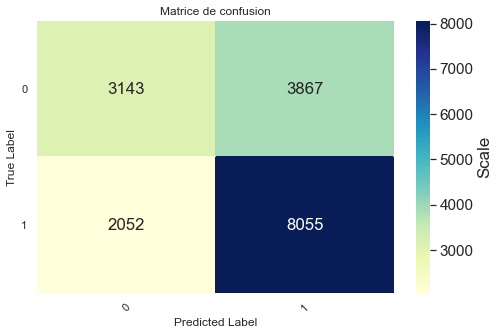

logisticRegression
best params: {'C': 1000, 'tol': 0.0001}
best scores: 0.623858214042263
Accuracy : 0.613
Classification Report
              precision    recall  f1-score   support

           0    0.52839   0.50713   0.51754      7010
           1    0.66744   0.68606   0.67662     10107

    accuracy                        0.61278     17117
   macro avg    0.59791   0.59660   0.59708     17117
weighted avg    0.61049   0.61278   0.61147     17117



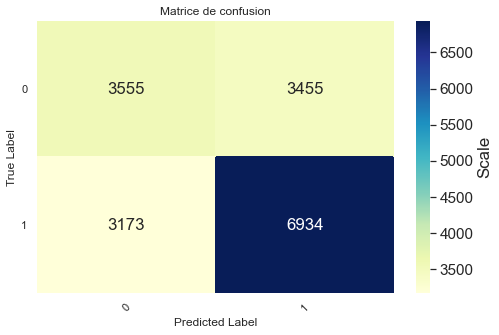

SVM
best params: {'C': 1, 'gamma': 1, 'kernel': 'linear'}
best scores: 0.6702113156100886
Accuracy : 0.664
Classification Report
              precision    recall  f1-score   support

           0    0.60270   0.52867   0.56326      7010
           1    0.69876   0.75829   0.72731     10107

    accuracy                        0.66425     17117
   macro avg    0.65073   0.64348   0.64529     17117
weighted avg    0.65942   0.66425   0.66013     17117



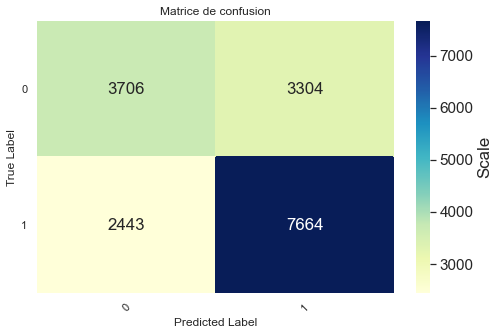

En utilisent source et text claims comme jeu de donnée
(24452,)
(24452, 22758)
(24452, 22758)
ADB
best params: {'learning_rate': 0.3, 'n_estimators': 200}
best scores: 0.6631220177232447
Accuracy : 0.664
Classification Report
              precision    recall  f1-score   support

           0    0.57189   0.71270   0.63457      7010
           1    0.75969   0.62996   0.68877     10107

    accuracy                        0.66384     17117
   macro avg    0.66579   0.67133   0.66167     17117
weighted avg    0.68278   0.66384   0.66658     17117



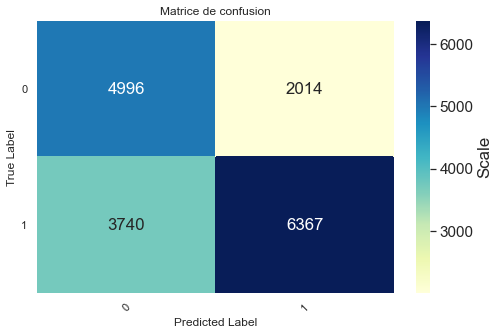

GBC
best params: {'learning_rate': 0.3, 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
best scores: 0.6587593728698024
Accuracy : 0.656
Classification Report
              precision    recall  f1-score   support

           0    0.57593   0.60542   0.59031      7010
           1    0.71625   0.69081   0.70330     10107

    accuracy                        0.65584     17117
   macro avg    0.64609   0.64811   0.64680     17117
weighted avg    0.65878   0.65584   0.65702     17117



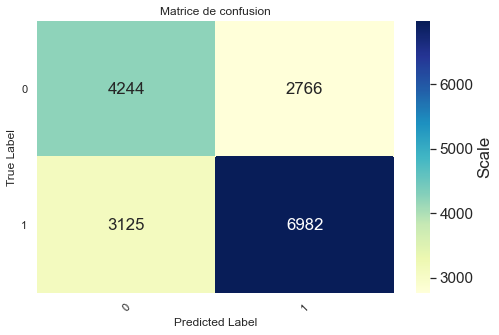

RFC
best params: {'criterion': 'gini', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
best scores: 0.6841172460804362
Accuracy : 0.677
Classification Report
              precision    recall  f1-score   support

           0    0.60745   0.59800   0.60269      7010
           1    0.72416   0.73197   0.72804     10107

    accuracy                        0.67710     17117
   macro avg    0.66580   0.66499   0.66537     17117
weighted avg    0.67636   0.67710   0.67671     17117



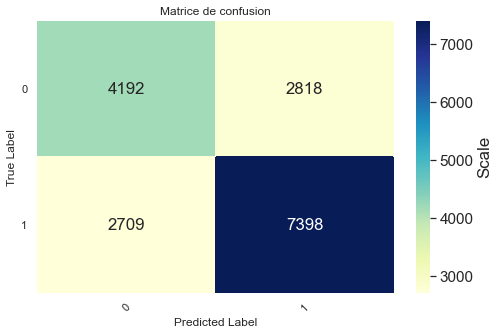

logisticRegression
best params: {'C': 1000, 'tol': 0.0001}
best scores: 0.6362644853442398
Accuracy : 0.624
Classification Report
              precision    recall  f1-score   support

           0    0.54221   0.51854   0.53012      7010
           1    0.67589   0.69635   0.68596     10107

    accuracy                        0.62353     17117
   macro avg    0.60905   0.60745   0.60804     17117
weighted avg    0.62114   0.62353   0.62214     17117



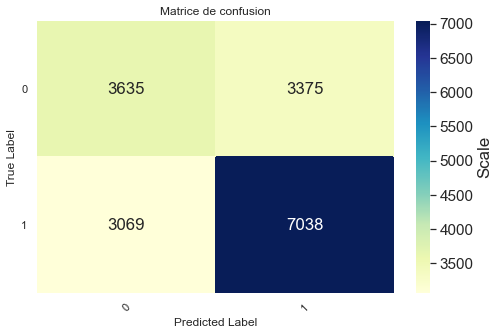

SVM
best params: {'C': 1, 'gamma': 1, 'kernel': 'linear'}
best scores: 0.6861622358554873
Accuracy : 0.666
Classification Report
              precision    recall  f1-score   support

           0    0.59315   0.59044   0.59179      7010
           1    0.71684   0.71911   0.71797     10107

    accuracy                        0.66641     17117
   macro avg    0.65499   0.65477   0.65488     17117
weighted avg    0.66618   0.66641   0.66630     17117



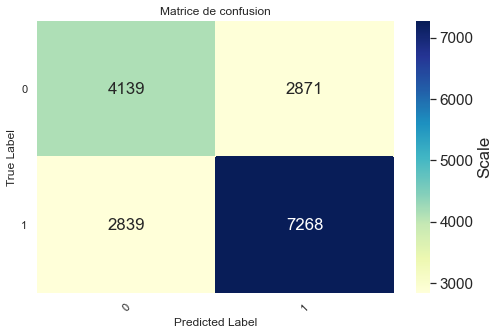

En utilisent text claims et author comme jeu de donnée
(24452,)
(24452, 24491)
(24452, 24491)
ADB
best params: {'learning_rate': 0.3, 'n_estimators': 200}
best scores: 0.6808452624403545
Accuracy : 0.685
Classification Report
              precision    recall  f1-score   support

           0    0.59352   0.73466   0.65659      7010
           1    0.77962   0.65103   0.70955     10107

    accuracy                        0.68528     17117
   macro avg    0.68657   0.69285   0.68307     17117
weighted avg    0.70341   0.68528   0.68786     17117



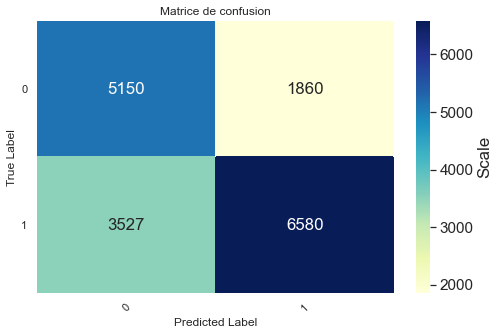

GBC
best params: {'learning_rate': 0.3, 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
best scores: 0.6819359236537151
Accuracy : 0.685
Classification Report
              precision    recall  f1-score   support

           0    0.59513   0.71840   0.65098      7010
           1    0.77192   0.66103   0.71218     10107

    accuracy                        0.68452     17117
   macro avg    0.68353   0.68971   0.68158     17117
weighted avg    0.69952   0.68452   0.68712     17117



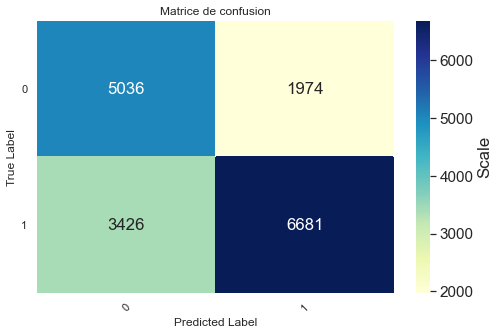

RFC
best params: {'criterion': 'gini', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
best scores: 0.6846625766871165
Accuracy : 0.679
Classification Report
              precision    recall  f1-score   support

           0    0.62188   0.55064   0.58410      7010
           1    0.71127   0.76778   0.73845     10107

    accuracy                        0.67886     17117
   macro avg    0.66658   0.65921   0.66127     17117
weighted avg    0.67466   0.67886   0.67524     17117



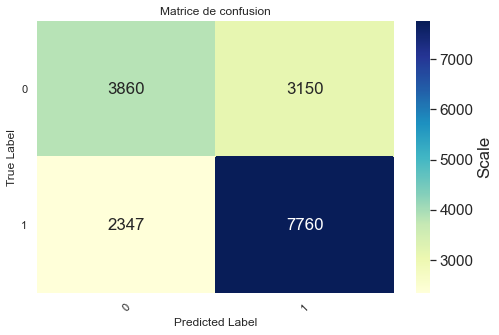

logisticRegression
best params: {'C': 1000, 'tol': 0.001}
best scores: 0.6417177914110429
Accuracy : 0.635
Classification Report
              precision    recall  f1-score   support

           0    0.55767   0.52967   0.54331      7010
           1    0.68477   0.70862   0.69649     10107

    accuracy                        0.63533     17117
   macro avg    0.62122   0.61914   0.61990     17117
weighted avg    0.63272   0.63533   0.63376     17117



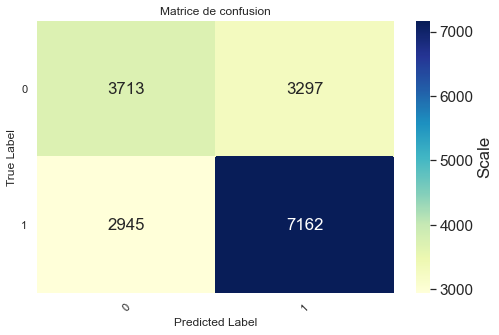

SVM
best params: {'C': 1, 'gamma': 1, 'kernel': 'linear'}
best scores: 0.687252897068848
Accuracy : 0.682
Classification Report
              precision    recall  f1-score   support

           0    0.61298   0.60756   0.61026      7010
           1    0.72947   0.73395   0.73170     10107

    accuracy                        0.68219     17117
   macro avg    0.67123   0.67075   0.67098     17117
weighted avg    0.68177   0.68219   0.68197     17117



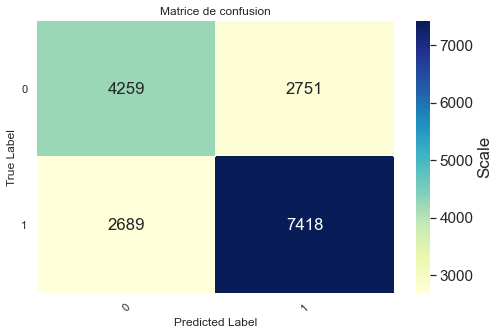

En utilisent text claims, headline et author comme jeu de donnée
(24452,)
(24452, 26782)
(24452, 26782)
ADB
best params: {'learning_rate': 0.3, 'n_estimators': 200}
best scores: 0.7015678254942059
Accuracy : 0.701
Classification Report
              precision    recall  f1-score   support

           0    0.61829   0.70613   0.65930      7010
           1    0.77390   0.69764   0.73379     10107

    accuracy                        0.70112     17117
   macro avg    0.69609   0.70188   0.69654     17117
weighted avg    0.71017   0.70112   0.70328     17117



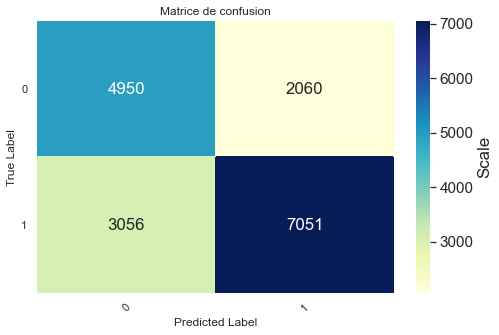

GBC
best params: {'learning_rate': 0.3, 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
best scores: 0.6958418541240626
Accuracy : 0.693
Classification Report
              precision    recall  f1-score   support

           0    0.61204   0.68459   0.64629      7010
           1    0.76164   0.69902   0.72899     10107

    accuracy                        0.69311     17117
   macro avg    0.68684   0.69181   0.68764     17117
weighted avg    0.70038   0.69311   0.69512     17117



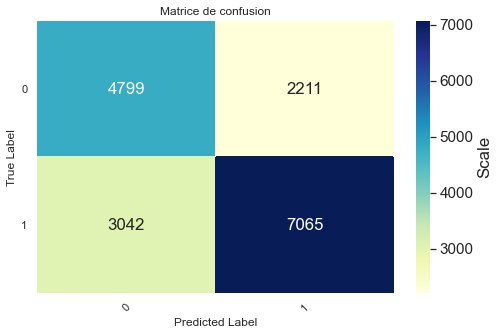

RFC
best params: {'criterion': 'gini', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
best scores: 0.6991138377641446
Accuracy : 0.695
Classification Report
              precision    recall  f1-score   support

           0    0.63804   0.58816   0.61208      7010
           1    0.72905   0.76858   0.74829     10107

    accuracy                        0.69469     17117
   macro avg    0.68354   0.67837   0.68019     17117
weighted avg    0.69178   0.69469   0.69251     17117



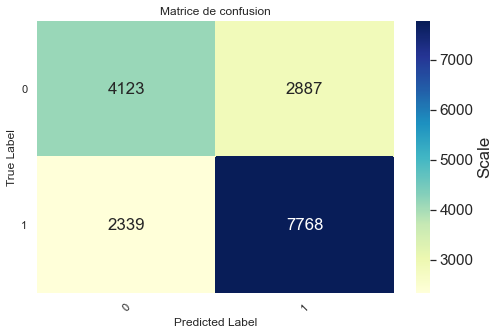

logisticRegression
best params: {'C': 1000, 'tol': 0.0001}
best scores: 0.6413087934560326
Accuracy : 0.651
Classification Report
              precision    recall  f1-score   support

           0    0.57947   0.53780   0.55786      7010
           1    0.69466   0.72930   0.71156     10107

    accuracy                        0.65087     17117
   macro avg    0.63706   0.63355   0.63471     17117
weighted avg    0.64748   0.65087   0.64861     17117



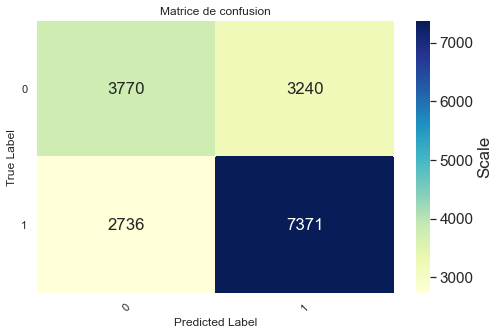

SVM
best params: {'C': 1, 'gamma': 1, 'kernel': 'linear'}
best scores: 0.6914792092706203
Accuracy : 0.694
Classification Report
              precision    recall  f1-score   support

           0    0.63388   0.59572   0.61421      7010
           1    0.73084   0.76135   0.74578     10107

    accuracy                        0.69352     17117
   macro avg    0.68236   0.67854   0.68000     17117
weighted avg    0.69113   0.69352   0.69190     17117



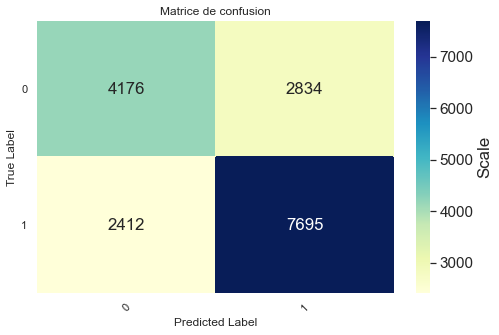

En utilisent text claims, headline, author et named_entities_article comme jeu de donnée
(15340,)
(15340, 22495)
(15340, 22495)
ADB
best params: {'learning_rate': 0.3, 'n_estimators': 200}
best scores: 0.7049140820469245
Accuracy : 0.712
Classification Report
              precision    recall  f1-score   support

           0    0.60728   0.65855   0.63188      4027
           1    0.78418   0.74445   0.76380      6711

    accuracy                        0.71224     10738
   macro avg    0.69573   0.70150   0.69784     10738
weighted avg    0.71784   0.71224   0.71433     10738



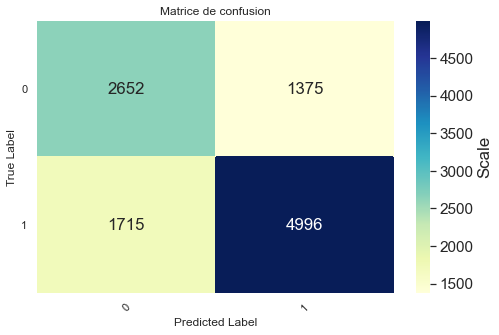

GBC
best params: {'learning_rate': 0.3, 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
best scores: 0.6962174857196809
Accuracy : 0.711
Classification Report
              precision    recall  f1-score   support

           0    0.61215   0.62553   0.61877      4027
           1    0.77231   0.76218   0.76721      6711

    accuracy                        0.71093     10738
   macro avg    0.69223   0.69385   0.69299     10738
weighted avg    0.71225   0.71093   0.71154     10738



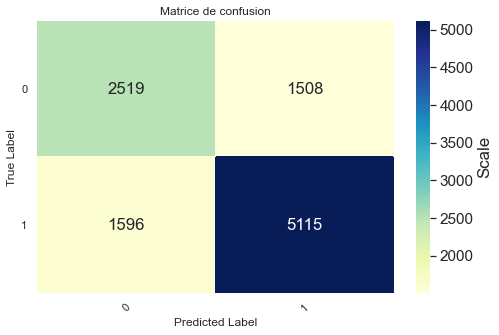

RFC
best params: {'criterion': 'gini', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
best scores: 0.7079559080394655
Accuracy : 0.707
Classification Report
              precision    recall  f1-score   support

           0    0.64596   0.48299   0.55271      4027
           1    0.73056   0.84116   0.78196      6711

    accuracy                        0.70684     10738
   macro avg    0.68826   0.66207   0.66734     10738
weighted avg    0.69883   0.70684   0.69599     10738



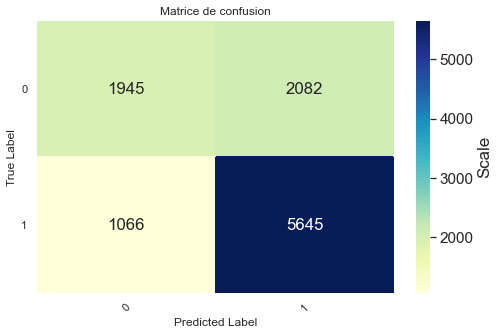

logisticRegression
best params: {'C': 1000, 'tol': 0.0001}
best scores: 0.6833989519898032
Accuracy : 0.672
Classification Report
              precision    recall  f1-score   support

           0    0.56890   0.51974   0.54321      4027
           1    0.72602   0.76367   0.74437      6711

    accuracy                        0.67219     10738
   macro avg    0.64746   0.64171   0.64379     10738
weighted avg    0.66710   0.67219   0.66893     10738



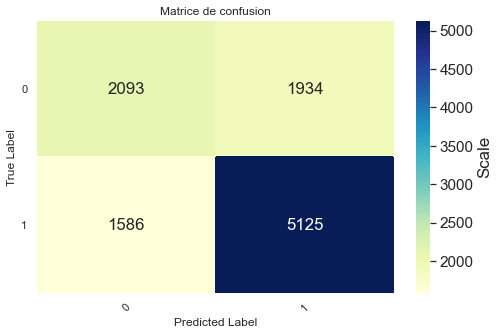

SVM
best params: {'C': 1, 'gamma': 1, 'kernel': 'linear'}
best scores: 0.7066496719067177
Accuracy : 0.701
Classification Report
              precision    recall  f1-score   support

           0    0.61712   0.53514   0.57321      4027
           1    0.74165   0.80077   0.77008      6711

    accuracy                        0.70115     10738
   macro avg    0.67939   0.66796   0.67165     10738
weighted avg    0.69495   0.70115   0.69625     10738



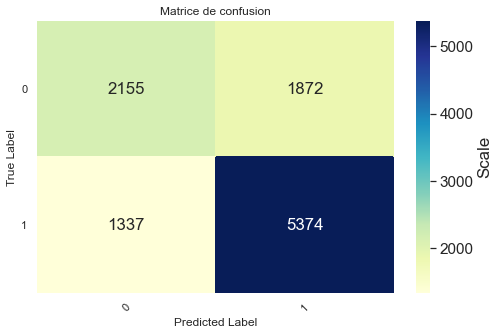

En utilisent text claims, headline, author,keywords et named_entities_article comme jeu de donnée
(14401,)
(14401, 22771)
(14401, 22771)
ADB
best params: {'learning_rate': 0.3, 'n_estimators': 200}
best scores: 0.7034722222222222
Accuracy : 0.699
Classification Report
              precision    recall  f1-score   support

           0    0.59600   0.67474   0.63293      3883
           1    0.77784   0.71346   0.74426      6198

    accuracy                        0.69854     10081
   macro avg    0.68692   0.69410   0.68859     10081
weighted avg    0.70780   0.69854   0.70137     10081



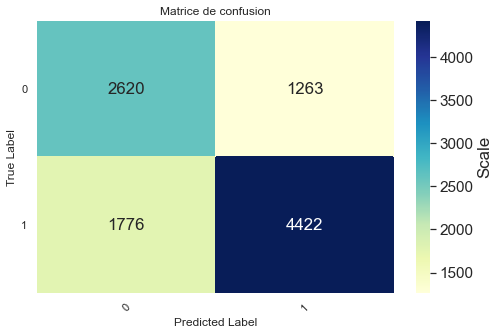

GBC
best params: {'learning_rate': 0.3, 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
best scores: 0.701388888888889
Accuracy : 0.699
Classification Report
              precision    recall  f1-score   support

           0    0.60590   0.62400   0.61482      3883
           1    0.75995   0.74572   0.75277      6198

    accuracy                        0.69884     10081
   macro avg    0.68292   0.68486   0.68379     10081
weighted avg    0.70061   0.69884   0.69963     10081



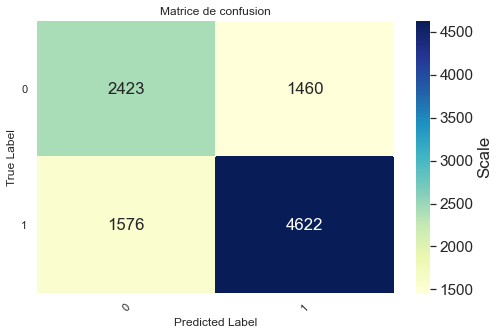

RFC
best params: {'criterion': 'gini', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
best scores: 0.7122685185185185
Accuracy : 0.709
Classification Report
              precision    recall  f1-score   support

           0    0.63613   0.57044   0.60149      3883
           1    0.74723   0.79558   0.77065      6198

    accuracy                        0.70886     10081
   macro avg    0.69168   0.68301   0.68607     10081
weighted avg    0.70444   0.70886   0.70549     10081



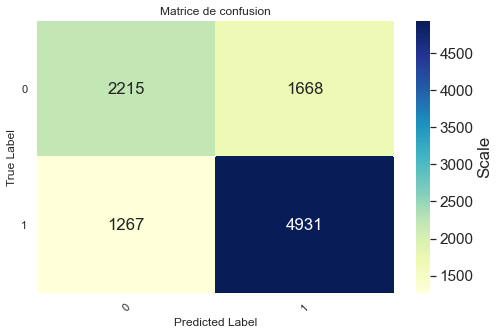

logisticRegression
best params: {'C': 1000, 'tol': 0.0001}
best scores: 0.6837962962962962
Accuracy : 0.677
Classification Report
              precision    recall  f1-score   support

           0    0.58787   0.53927   0.56253      3883
           1    0.72557   0.76315   0.74389      6198

    accuracy                        0.67692     10081
   macro avg    0.65672   0.65121   0.65321     10081
weighted avg    0.67253   0.67692   0.67403     10081



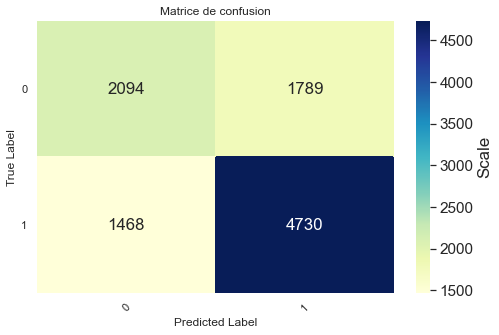

SVM
best params: {'C': 1, 'gamma': 1, 'kernel': 'linear'}
best scores: 0.7085648148148149
Accuracy : 0.701
Classification Report
              precision    recall  f1-score   support

           0    0.62464   0.56013   0.59063      3883
           1    0.74117   0.78913   0.76440      6198

    accuracy                        0.70092     10081
   macro avg    0.68291   0.67463   0.67751     10081
weighted avg    0.69629   0.70092   0.69747     10081



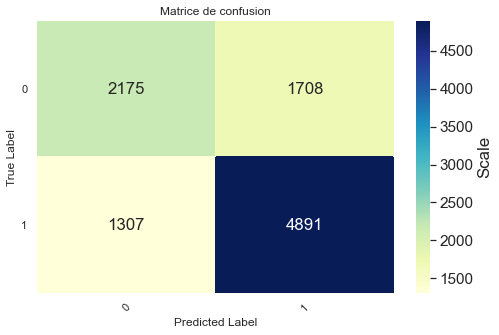

En utilisent text claims,source, headline, author,keywords et named_entities_article comme jeu de donnée
(14401,)
(14401, 22773)
(14401, 22773)
ADB
best params: {'learning_rate': 0.3, 'n_estimators': 200}
best scores: 0.701388888888889
Accuracy : 0.702
Classification Report
              precision    recall  f1-score   support

           0    0.59995   0.68169   0.63822      3883
           1    0.78197   0.71523   0.74711      6198

    accuracy                        0.70231     10081
   macro avg    0.69096   0.69846   0.69266     10081
weighted avg    0.71186   0.70231   0.70517     10081



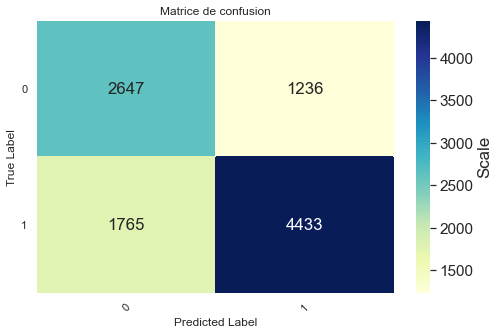

GBC
best params: {'learning_rate': 0.3, 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
best scores: 0.701851851851852
Accuracy : 0.699
Classification Report
              precision    recall  f1-score   support

           0    0.61421   0.58795   0.60079      3883
           1    0.74859   0.76864   0.75848      6198

    accuracy                        0.69904     10081
   macro avg    0.68140   0.67829   0.67963     10081
weighted avg    0.69682   0.69904   0.69774     10081



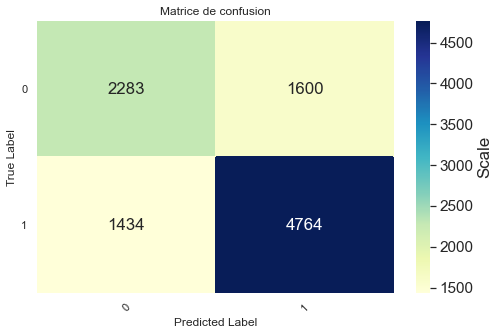

RFC
best params: {'criterion': 'gini', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
best scores: 0.7210648148148149
Accuracy : 0.715
Classification Report
              precision    recall  f1-score   support

           0    0.62606   0.64718   0.63644      3883
           1    0.77419   0.75783   0.76592      6198

    accuracy                        0.71521     10081
   macro avg    0.70012   0.70250   0.70118     10081
weighted avg    0.71713   0.71521   0.71605     10081



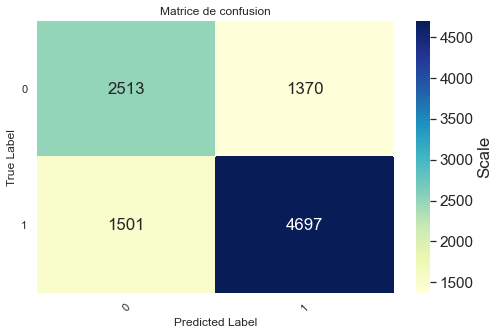

logisticRegression
best params: {'C': 1000, 'tol': 0.001}
best scores: 0.6854166666666667
Accuracy : 0.677
Classification Report
              precision    recall  f1-score   support

           0    0.58784   0.54030   0.56307      3883
           1    0.72589   0.76267   0.74382      6198

    accuracy                        0.67702     10081
   macro avg    0.65687   0.65148   0.65345     10081
weighted avg    0.67272   0.67702   0.67420     10081



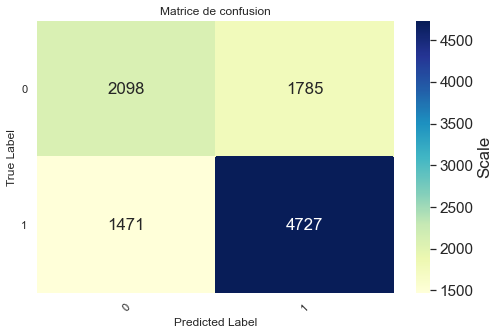

SVM
best params: {'C': 1, 'gamma': 1, 'kernel': 'linear'}
best scores: 0.7085648148148148
Accuracy : 0.702
Classification Report
              precision    recall  f1-score   support

           0    0.62301   0.57584   0.59850      3883
           1    0.74630   0.78170   0.76359      6198

    accuracy                        0.70241     10081
   macro avg    0.68466   0.67877   0.68105     10081
weighted avg    0.69881   0.70241   0.70000     10081



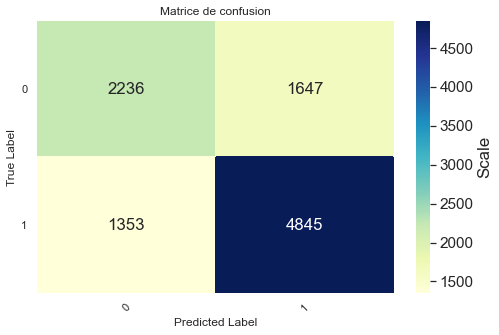

En utilisent text claims, headline, author,keywords,named_entities_claim et named_entities_article comme jeu de donnée
(14396,)
(14396, 40890)
(14396, 40890)
ADB
best params: {'learning_rate': 0.3, 'n_estimators': 200}
best scores: 0.6936089116346936
Accuracy : 0.705
Classification Report
              precision    recall  f1-score   support

           0    0.61537   0.62503   0.62016      3883
           1    0.76263   0.75513   0.75886      6195

    accuracy                        0.70500     10078
   macro avg    0.68900   0.69008   0.68951     10078
weighted avg    0.70589   0.70500   0.70542     10078



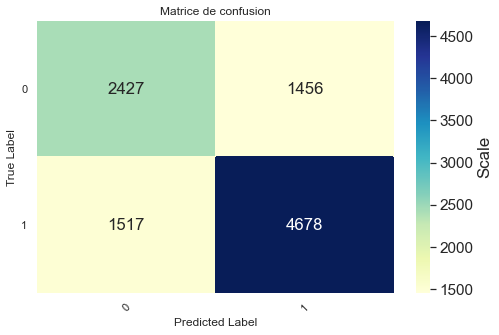

GBC
best params: {'learning_rate': 0.3, 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
best scores: 0.7012494098965709
Accuracy : 0.703
Classification Report
              precision    recall  f1-score   support

           0    0.62493   0.57584   0.59938      3883
           1    0.74662   0.78337   0.76455      6195

    accuracy                        0.70341     10078
   macro avg    0.68577   0.67961   0.68197     10078
weighted avg    0.69973   0.70341   0.70091     10078



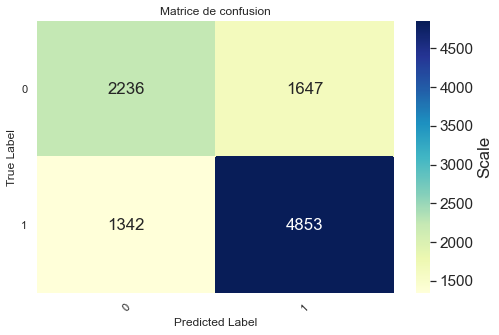

RFC
best params: {'criterion': 'gini', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
best scores: 0.7040290652761684
Accuracy : 0.709
Classification Report
              precision    recall  f1-score   support

           0    0.65318   0.52382   0.58139      3883
           1    0.73449   0.82567   0.77741      6195

    accuracy                        0.70937     10078
   macro avg    0.69384   0.67474   0.67940     10078
weighted avg    0.70316   0.70937   0.70189     10078



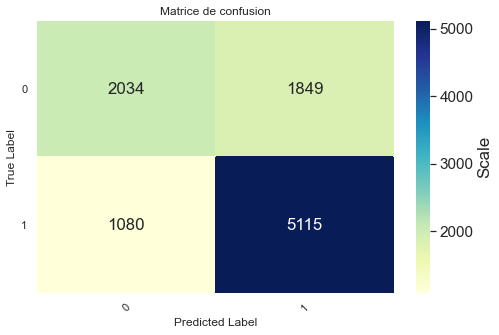

logisticRegression
best params: {'C': 1000, 'tol': 0.0001}
best scores: 0.6854984764602378
Accuracy : 0.689
Classification Report
              precision    recall  f1-score   support

           0    0.60816   0.54159   0.57295      3883
           1    0.73112   0.78128   0.75536      6195

    accuracy                        0.68893     10078
   macro avg    0.66964   0.66143   0.66416     10078
weighted avg    0.68374   0.68893   0.68508     10078



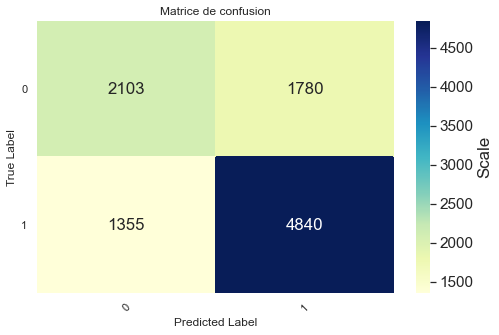

SVM
best params: {'C': 1, 'gamma': 1, 'kernel': 'linear'}
best scores: 0.7012502145830651
Accuracy : 0.707
Classification Report
              precision    recall  f1-score   support

           0    0.63391   0.56812   0.59921      3883
           1    0.74583   0.79435   0.76933      6195

    accuracy                        0.70718     10078
   macro avg    0.68987   0.68123   0.68427     10078
weighted avg    0.70271   0.70718   0.70378     10078



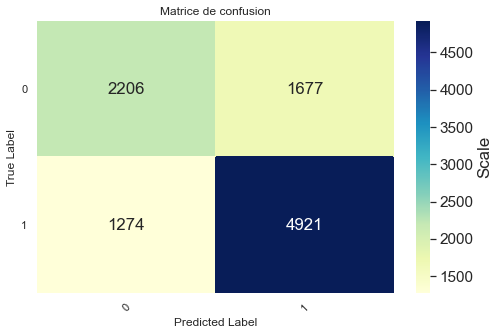

In [14]:

bestScoredAlgo_sansPretraitement = []
print("En utilisent text claims comme jeu de donnée")
features = np.array(["text"])
score = classification_sans_pretraitement(features,dfVF_M)
bestScoredAlgo_sansPretraitement.append(score)
print("En utilisent source et text claims comme jeu de donnée")
features = np.array(["text","source"])
score = classification_sans_pretraitement(features,dfVF_M)
bestScoredAlgo_sansPretraitement.append(score)
print("En utilisent text claims et author comme jeu de donnée")
features = np.array(["text","author"])
score = classification_sans_pretraitement(features,dfVF_M)
bestScoredAlgo_sansPretraitement.append(score)
print("En utilisent text claims, headline et author comme jeu de donnée")
features = np.array(["text","headline","author"])
score = classification_sans_pretraitement(features,dfVF_M)
bestScoredAlgo_sansPretraitement.append(score)
print("En utilisent text claims, headline, author et named_entities_article comme jeu de donnée")
dfn=dfVF_M.copy()
features = np.array(["text","headline","author","named_entities_article"])
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)
score=classification_sans_pretraitement(features,dfn)
bestScoredAlgo_sansPretraitement.append(score)
print("En utilisent text claims, headline, author,keywords et named_entities_article comme jeu de donnée")
features = np.array(["text","headline","author","named_entities_article","keywords"])
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
score=classification_sans_pretraitement(features,dfn)
bestScoredAlgo_sansPretraitement.append(score)
print("En utilisent text claims,source, headline, author,keywords et named_entities_article comme jeu de donnée")
features = np.array(["text","source","headline","author","named_entities_article","keywords"])
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
score=classification_sans_pretraitement(features,dfn)
bestScoredAlgo_sansPretraitement.append(score)
print("En utilisent text claims, headline, author,keywords,named_entities_claim et named_entities_article comme jeu de donnée")
dfn['named_entities_claim'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['named_entities_claim'], inplace=True)
features = np.array(["text","headline","author","named_entities_article","keywords","named_entities_claim"])
score=classification_sans_pretraitement(features,dfn)
bestScoredAlgo_sansPretraitement.append(score)

In [15]:

bestScoredAlgo_sansPretraitement.sort(key=lambda x: x[2],reverse=True)
print("Le meilleur score est: "+str(bestScoredAlgo_sansPretraitement[0][2]))
print("-------------------------")
print("tri du meilleur score et meilleur algorithme de chaque features :")
for i in range(len(bestScoredAlgo_sansPretraitement)):
    print("Features :"+str(bestScoredAlgo_sansPretraitement[i][0]))
    print("Meilleur Score :"+str(bestScoredAlgo_sansPretraitement[i][2]))
    print("Générer par l'Algorithm :"+str(bestScoredAlgo_sansPretraitement[i][1]))
    print("En utilisent les meilleurs Parametres :"+str(bestScoredAlgo_sansPretraitement[i][3]))
    print("-------------------------")


Le meilleur score est: 0.7210648148148149
-------------------------
tri du meilleur score et meilleur algorithme de chaque features :
Features :['text' 'source' 'headline' 'author' 'named_entities_article' 'keywords']
Meilleur Score :0.7210648148148149
Générer par l'Algorithm :RFC
En utilisent les meilleurs Parametres :{'criterion': 'gini', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
-------------------------
Features :['text' 'headline' 'author' 'named_entities_article' 'keywords']
Meilleur Score :0.7122685185185185
Générer par l'Algorithm :RFC
En utilisent les meilleurs Parametres :{'criterion': 'gini', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
-------------------------
Features :['text' 'headline' 'author' 'named_entities_article']
Meilleur Score :0.7079559080394655
Générer par l'Algorithm :RFC
En utilisent les meilleurs Parametres :{'criterion': 'gini', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
------------


#####  Les meilleurs feature sont 'text' 'source' 'headline' 'author' 'named_entities_article' 'keywords' qui ont générer un score maximum en utilisent l'algorithme RandomForestClassifier (RFC)

##  classification avec prétraitement

In [18]:


def classification_avec_pretraitement(features,cleaner_,dfVF_M):
        
        # selection des données
        X=dfVF_M[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
        y= dfVF_M['truthRating']
        validation_size=0.3 #30% du jeu de données pour le test
        testsize= 1-validation_size
        seed=30

        X_train,X_test,y_train,y_test=train_test_split(X,
                                                y, 
                                                train_size=validation_size, 
                                                random_state=seed,
                                                test_size=testsize)
        pipe = Pipeline([("cleaner", cleaner_),
                 ("tfidf_vectorizer", TfidfVectorizer(lowercase=False)),
                 ("clf", AdaBoostClassifier())]) #default Calssifier
        seed=7
        models = [
              
                'ADB',
                'GBC',
                'RFC',
                'logisticRegression',
                'SVM'
                ]
        clfs = [
                AdaBoostClassifier(random_state=seed),
                GradientBoostingClassifier(random_state=seed),
                RandomForestClassifier(random_state=seed,n_jobs=-1),
                LogisticRegression(solver='newton-cg', multi_class='multinomial'),
                SVC()
                ]

        params = {
                models[0]:{'clf__learning_rate':[ 0.3], 'clf__n_estimators':[200]},
                models[1]:{'clf__learning_rate':[0.3],'clf__n_estimators':[100,200], 'clf__max_depth':[3],
                         'clf__min_samples_split':[2],'clf__min_samples_leaf': [2]},
                models[2]:{'clf__n_estimators':[200], 'clf__criterion':['gini'],'clf__min_samples_split':[2],
                        'clf__min_samples_leaf': [2]},
                models[3]: {'clf__C':[1000,2000], 'clf__tol': [0.0001,0.001]},
                models[4]: {'clf__C': [1, 10],
                       'clf__gamma' : [1],
                       'clf__kernel': ['linear']}
                }

        bestScore=0
        Algo = []
        for name, estimator in zip(models,clfs):
                print("Alogrithm: "+name)
                pipe.set_params(clf= estimator)
                clf = GridSearchCV(pipe, params[name], scoring='accuracy',
                                refit='True', n_jobs=-1, cv=5)
                clf.fit(X_train, y_train)

                print("best params: " + str(clf.best_params_))
                print("best scores: " + str(clf.best_score_))
                if clf.best_score_ > bestScore:
                    bestScore = clf.best_score_
                    Algo=[]
                    Algo.append(features)
                    Algo.append(cleaner_)
                    Algo.append(name)
                    Algo.append(bestScore)
                    Algo.append(clf.best_params_)
                y_pred = clf.best_estimator_.predict(X_test)
                MyshowAllScores(y_test,y_pred)
        
        return Algo

### Application du prétraitement par défaut

En utilisent text claims comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.6422631220177233
Accuracy : 0.645
Classification Report
              precision    recall  f1-score   support

           0    0.60718   0.37660   0.46487      7010
           1    0.65776   0.83101   0.73431     10107

    accuracy                        0.64491     17117
   macro avg    0.63247   0.60381   0.59959     17117
weighted avg    0.63705   0.64491   0.62396     17117



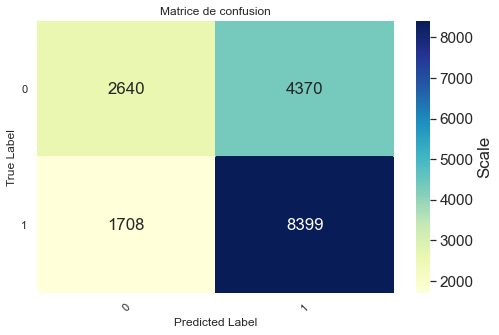

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6414451261077028
Accuracy : 0.641
Classification Report
              precision    recall  f1-score   support

           0    0.58161   0.43766   0.49947      7010
           1    0.66712   0.78164   0.71985     10107

    accuracy                        0.64077     17117
   macro avg    0.62436   0.60965   0.60966     17117
weighted avg    0.63210   0.64077   0.62960     17117



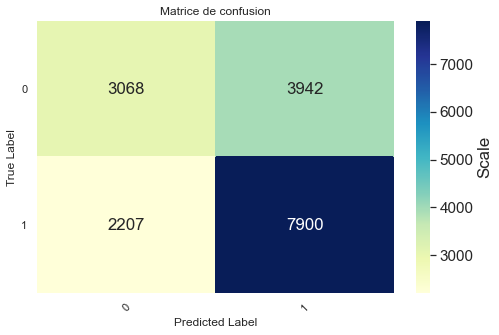

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6578050443081118
Accuracy : 0.660
Classification Report
              precision    recall  f1-score   support

           0    0.60061   0.50499   0.54867      7010
           1    0.69081   0.76709   0.72696     10107

    accuracy                        0.65975     17117
   macro avg    0.64571   0.63604   0.63781     17117
weighted avg    0.65387   0.65975   0.65394     17117



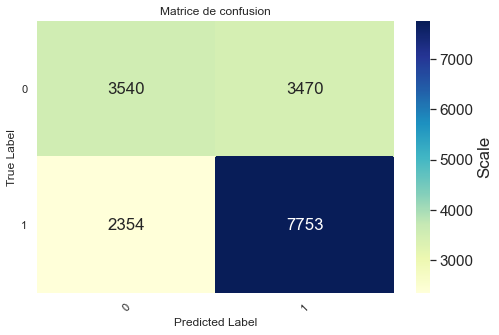

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.621676891615542
Accuracy : 0.612
Classification Report
              precision    recall  f1-score   support

           0    0.52629   0.52111   0.52369      7010
           1    0.67011   0.67468   0.67239     10107

    accuracy                        0.61179     17117
   macro avg    0.59820   0.59790   0.59804     17117
weighted avg    0.61121   0.61179   0.61149     17117



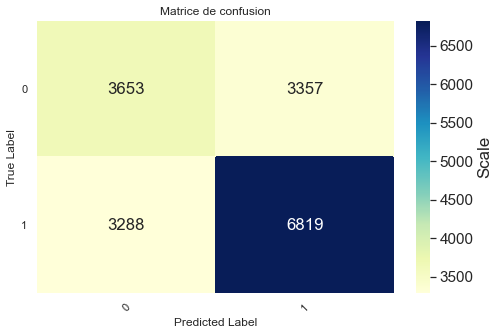

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6621676891615542
Accuracy : 0.661
Classification Report
              precision    recall  f1-score   support

           0    0.59401   0.54579   0.56888      7010
           1    0.70176   0.74127   0.72097     10107

    accuracy                        0.66121     17117
   macro avg    0.64788   0.64353   0.64493     17117
weighted avg    0.65763   0.66121   0.65869     17117



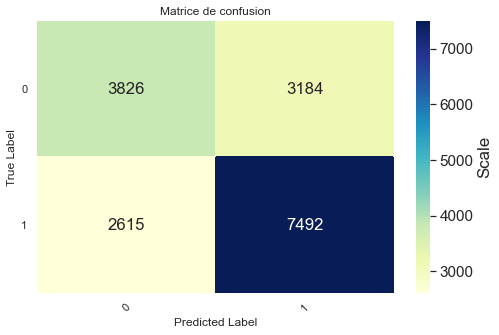

En utilisent source et text claims comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.6681663258350375
Accuracy : 0.658
Classification Report
              precision    recall  f1-score   support

           0    0.56716   0.69572   0.62490      7010
           1    0.74959   0.63174   0.68564     10107

    accuracy                        0.65794     17117
   macro avg    0.65837   0.66373   0.65527     17117
weighted avg    0.67488   0.65794   0.66076     17117



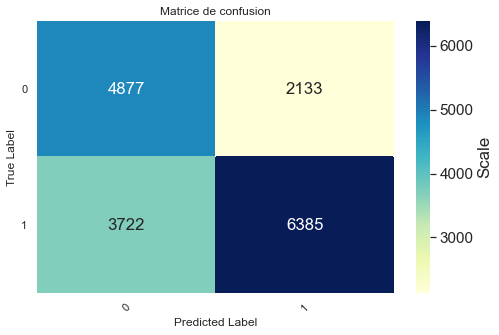

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6648943421949557
Accuracy : 0.656
Classification Report
              precision    recall  f1-score   support

           0    0.57748   0.60071   0.58887      7010
           1    0.71511   0.69516   0.70500     10107

    accuracy                        0.65648     17117
   macro avg    0.64630   0.64794   0.64693     17117
weighted avg    0.65875   0.65648   0.65744     17117



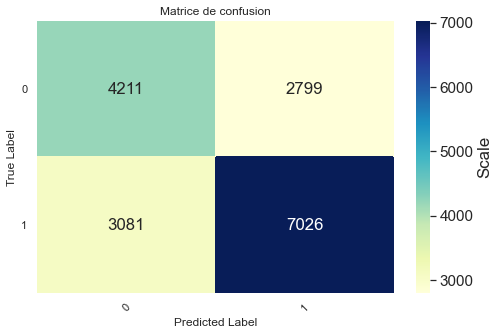

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6843899113837765
Accuracy : 0.678
Classification Report
              precision    recall  f1-score   support

           0    0.60304   0.62282   0.61277      7010
           1    0.73231   0.71564   0.72388     10107

    accuracy                        0.67763     17117
   macro avg    0.66767   0.66923   0.66833     17117
weighted avg    0.67937   0.67763   0.67838     17117



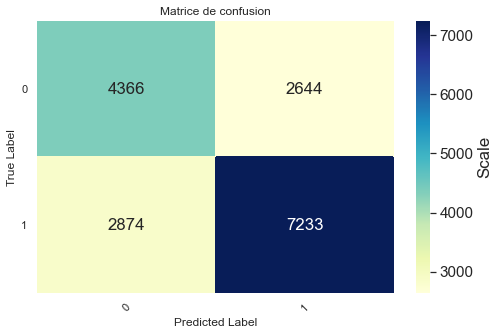

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.6338104976141785
Accuracy : 0.622
Classification Report
              precision    recall  f1-score   support

           0    0.53922   0.53352   0.53635      7010
           1    0.67881   0.68378   0.68129     10107

    accuracy                        0.62225     17117
   macro avg    0.60901   0.60865   0.60882     17117
weighted avg    0.62164   0.62225   0.62193     17117



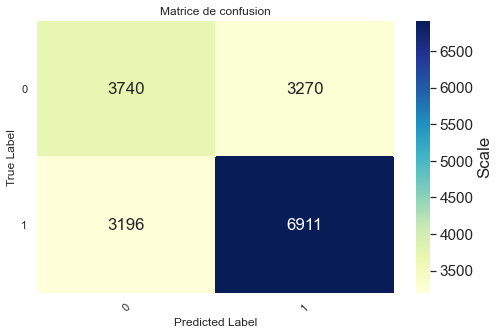

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.679890933878664
Accuracy : 0.668
Classification Report
              precision    recall  f1-score   support

           0    0.59225   0.60628   0.59918      7010
           1    0.72236   0.71050   0.71638     10107

    accuracy                        0.66782     17117
   macro avg    0.65731   0.65839   0.65778     17117
weighted avg    0.66908   0.66782   0.66838     17117



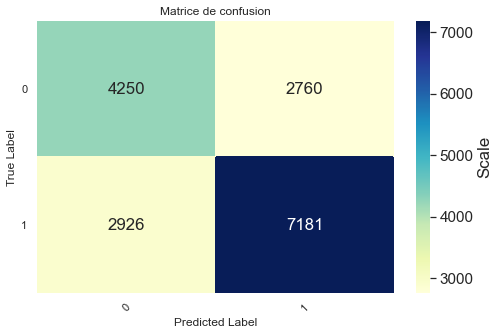

En utilisent text claims et author comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.6805725971370145
Accuracy : 0.682
Classification Report
              precision    recall  f1-score   support

           0    0.59165   0.71926   0.64924      7010
           1    0.77103   0.65568   0.70869     10107

    accuracy                        0.68172     17117
   macro avg    0.68134   0.68747   0.67897     17117
weighted avg    0.69757   0.68172   0.68435     17117



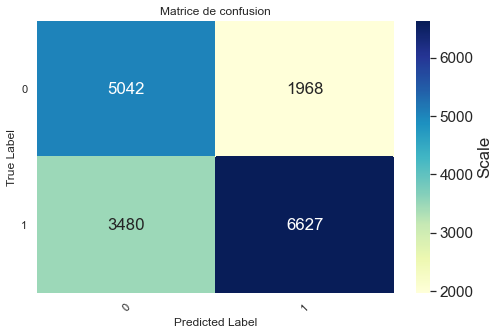

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.6811179277436946
Accuracy : 0.676
Classification Report
              precision    recall  f1-score   support

           0    0.58678   0.70899   0.64212      7010
           1    0.76408   0.65371   0.70460     10107

    accuracy                        0.67635     17117
   macro avg    0.67543   0.68135   0.67336     17117
weighted avg    0.69147   0.67635   0.67901     17117



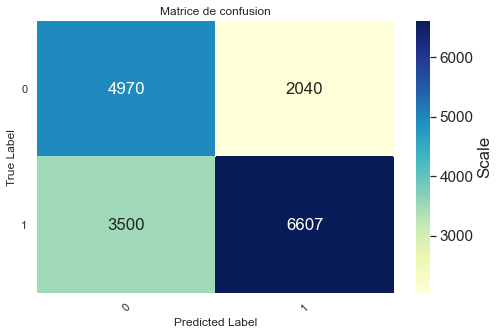

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6922972051806408
Accuracy : 0.688
Classification Report
              precision    recall  f1-score   support

           0    0.61956   0.61541   0.61748      7010
           1    0.73449   0.73790   0.73619     10107

    accuracy                        0.68774     17117
   macro avg    0.67702   0.67666   0.67683     17117
weighted avg    0.68742   0.68774   0.68757     17117



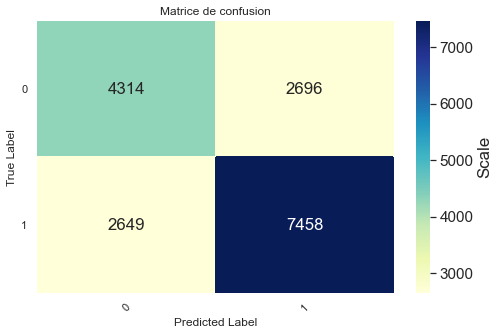

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.6415814587593729
Accuracy : 0.638
Classification Report
              precision    recall  f1-score   support

           0    0.56089   0.53680   0.54858      7010
           1    0.68803   0.70852   0.69812     10107

    accuracy                        0.63820     17117
   macro avg    0.62446   0.62266   0.62335     17117
weighted avg    0.63596   0.63820   0.63688     17117



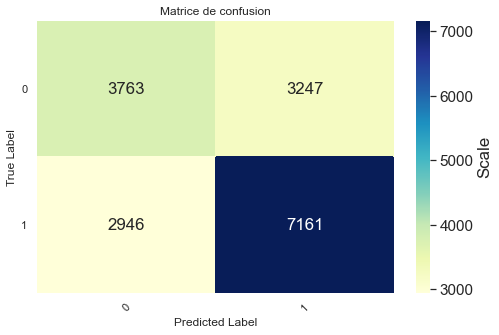

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6895705521472393
Accuracy : 0.684
Classification Report
              precision    recall  f1-score   support

           0    0.61355   0.61626   0.61490      7010
           1    0.73303   0.73078   0.73190     10107

    accuracy                        0.68388     17117
   macro avg    0.67329   0.67352   0.67340     17117
weighted avg    0.68410   0.68388   0.68399     17117



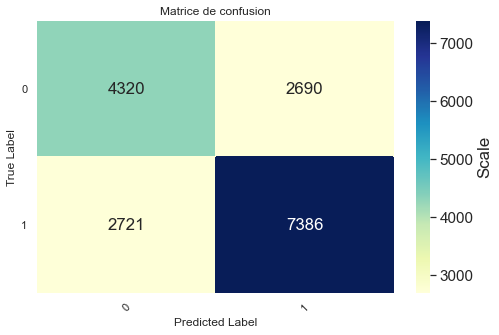

En utilisent text claims, headline et author comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.7022494887525561
Accuracy : 0.701
Classification Report
              precision    recall  f1-score   support

           0    0.61730   0.71056   0.66065      7010
           1    0.77575   0.69447   0.73286     10107

    accuracy                        0.70106     17117
   macro avg    0.69653   0.70251   0.69676     17117
weighted avg    0.71086   0.70106   0.70329     17117



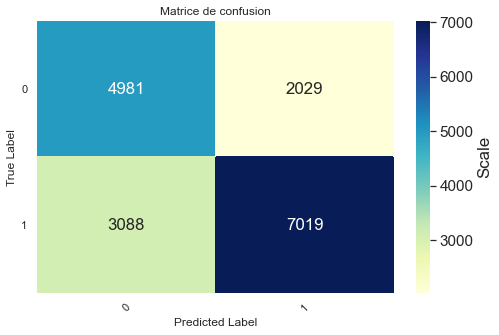

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.6931152010906612
Accuracy : 0.697
Classification Report
              precision    recall  f1-score   support

           0    0.61331   0.70071   0.65410      7010
           1    0.76965   0.69358   0.72964     10107

    accuracy                        0.69650     17117
   macro avg    0.69148   0.69715   0.69187     17117
weighted avg    0.70563   0.69650   0.69870     17117



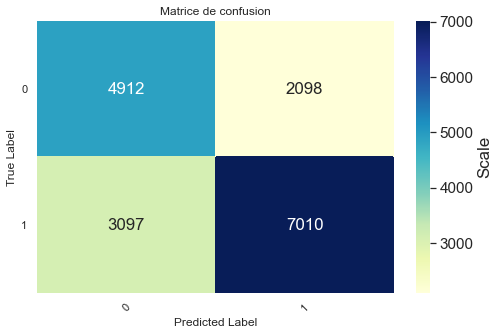

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6992501704158146
Accuracy : 0.696
Classification Report
              precision    recall  f1-score   support

           0    0.62905   0.62896   0.62900      7010
           1    0.74268   0.74275   0.74272     10107

    accuracy                        0.69615     17117
   macro avg    0.68586   0.68586   0.68586     17117
weighted avg    0.69614   0.69615   0.69615     17117



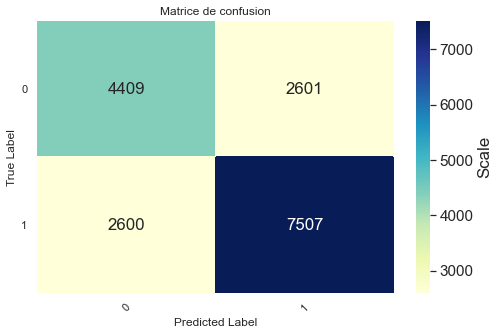

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.6545330606680301
Accuracy : 0.657
Classification Report
              precision    recall  f1-score   support

           0    0.58674   0.54807   0.56675      7010
           1    0.70026   0.73226   0.71590     10107

    accuracy                        0.65683     17117
   macro avg    0.64350   0.64017   0.64133     17117
weighted avg    0.65377   0.65683   0.65482     17117



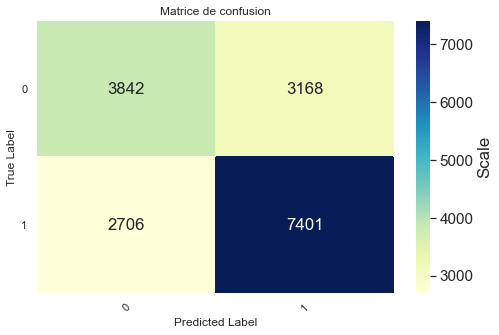

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6961145194274028
Accuracy : 0.696
Classification Report
              precision    recall  f1-score   support

           0    0.63279   0.61384   0.62317      7010
           1    0.73762   0.75294   0.74520     10107

    accuracy                        0.69597     17117
   macro avg    0.68521   0.68339   0.68419     17117
weighted avg    0.69469   0.69597   0.69523     17117



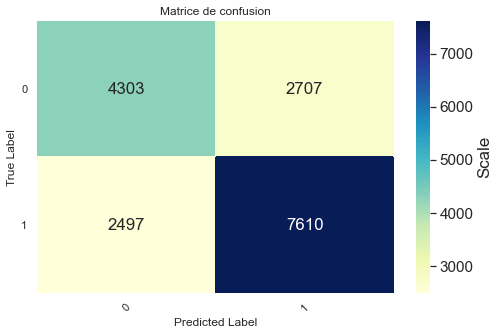

En utilisent text claims, headline, author et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.7118663550960675
Accuracy : 0.713
Classification Report
              precision    recall  f1-score   support

           0    0.60912   0.65359   0.63057      4027
           1    0.78261   0.74832   0.76508      6711

    accuracy                        0.71280     10738
   macro avg    0.69586   0.70096   0.69783     10738
weighted avg    0.71755   0.71280   0.71464     10738



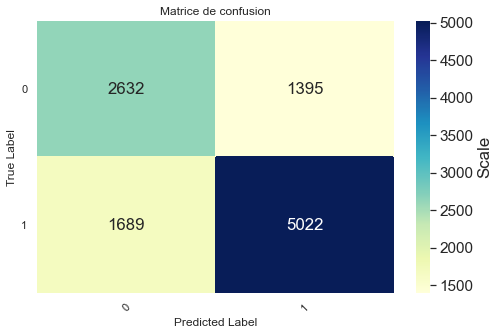

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.7144729264032479
Accuracy : 0.704
Classification Report
              precision    recall  f1-score   support

           0    0.60746   0.59871   0.60305      4027
           1    0.76126   0.76784   0.76454      6711

    accuracy                        0.70441     10738
   macro avg    0.68436   0.68328   0.68380     10738
weighted avg    0.70358   0.70441   0.70398     10738



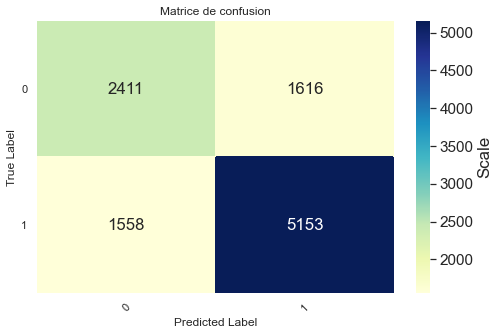

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.713385261766511
Accuracy : 0.707
Classification Report
              precision    recall  f1-score   support

           0    0.63327   0.51800   0.56987      4027
           1    0.73925   0.82000   0.77753      6711

    accuracy                        0.70674     10738
   macro avg    0.68626   0.66900   0.67370     10738
weighted avg    0.69951   0.70674   0.69965     10738



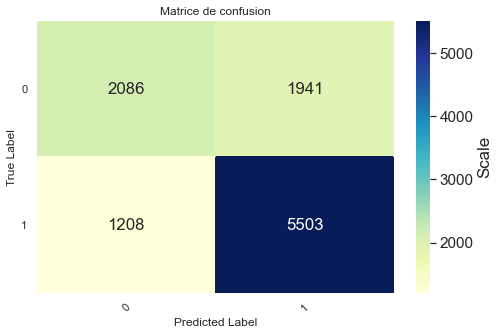

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.6810109521786338
Accuracy : 0.679
Classification Report
              precision    recall  f1-score   support

           0    0.57646   0.54110   0.55822      4027
           1    0.73441   0.76144   0.74768      6711

    accuracy                        0.67880     10738
   macro avg    0.65543   0.65127   0.65295     10738
weighted avg    0.67517   0.67880   0.67663     10738



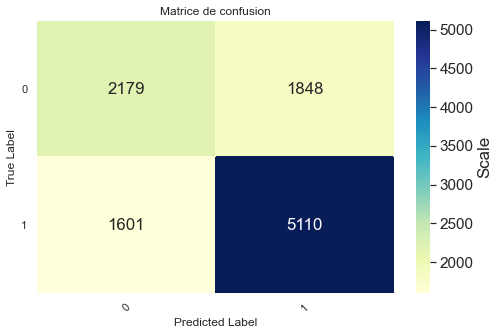

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.7088226407968654
Accuracy : 0.704
Classification Report
              precision    recall  f1-score   support

           0    0.61484   0.56171   0.58708      4027
           1    0.74996   0.78885   0.76892      6711

    accuracy                        0.70367     10738
   macro avg    0.68240   0.67528   0.67800     10738
weighted avg    0.69929   0.70367   0.70072     10738



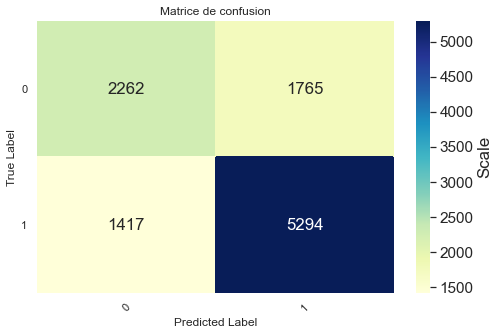

En utilisent text claims, headline, author,keywords et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.705324074074074
Accuracy : 0.708
Classification Report
              precision    recall  f1-score   support

           0    0.60918   0.67680   0.64121      3883
           1    0.78238   0.72798   0.75420      6198

    accuracy                        0.70826     10081
   macro avg    0.69578   0.70239   0.69770     10081
weighted avg    0.71567   0.70826   0.71068     10081



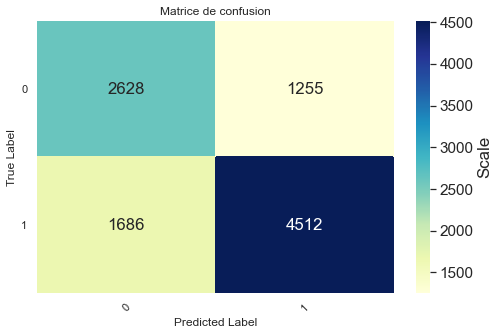

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.7034722222222223
Accuracy : 0.700
Classification Report
              precision    recall  f1-score   support

           0    0.61338   0.59979   0.60651      3883
           1    0.75271   0.76315   0.75789      6198

    accuracy                        0.70023     10081
   macro avg    0.68304   0.68147   0.68220     10081
weighted avg    0.69904   0.70023   0.69958     10081



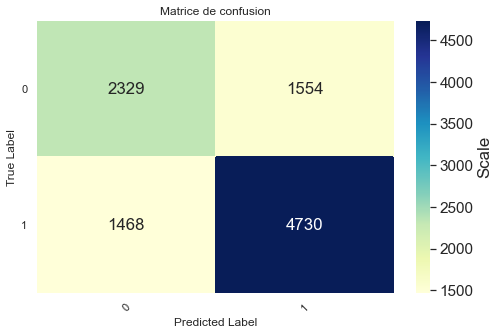

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7240740740740741
Accuracy : 0.713
Classification Report
              precision    recall  f1-score   support

           0    0.62944   0.62117   0.62528      3883
           1    0.76460   0.77089   0.76774      6198

    accuracy                        0.71322     10081
   macro avg    0.69702   0.69603   0.69651     10081
weighted avg    0.71254   0.71322   0.71286     10081



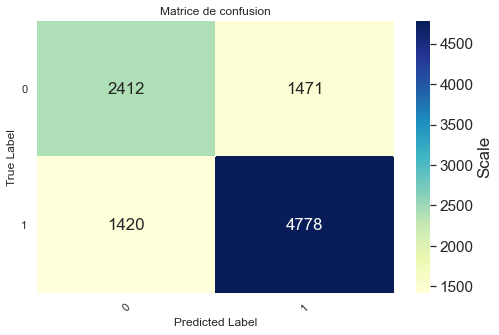

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.6858796296296297
Accuracy : 0.675
Classification Report
              precision    recall  f1-score   support

           0    0.58227   0.55318   0.56735      3883
           1    0.72857   0.75137   0.73979      6198

    accuracy                        0.67503     10081
   macro avg    0.65542   0.65228   0.65357     10081
weighted avg    0.67222   0.67503   0.67337     10081



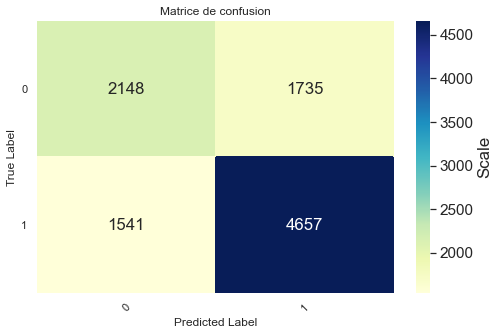

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.7111111111111111
Accuracy : 0.702
Classification Report
              precision    recall  f1-score   support

           0    0.61797   0.59155   0.60447      3883
           1    0.75079   0.77089   0.76071      6198

    accuracy                        0.70182     10081
   macro avg    0.68438   0.68122   0.68259     10081
weighted avg    0.69963   0.70182   0.70053     10081



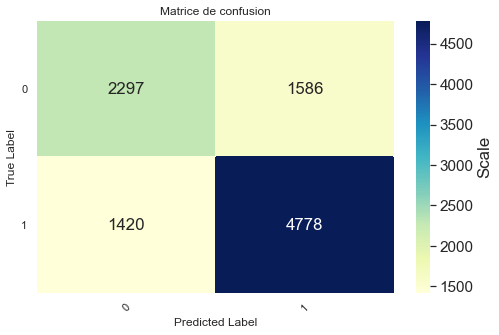

En utilisent text claims, source, headline, author, keywords et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.7037037037037036
Accuracy : 0.706
Classification Report
              precision    recall  f1-score   support

           0    0.60801   0.66830   0.63673      3883
           1    0.77843   0.73007   0.75348      6198

    accuracy                        0.70628     10081
   macro avg    0.69322   0.69919   0.69510     10081
weighted avg    0.71279   0.70628   0.70851     10081



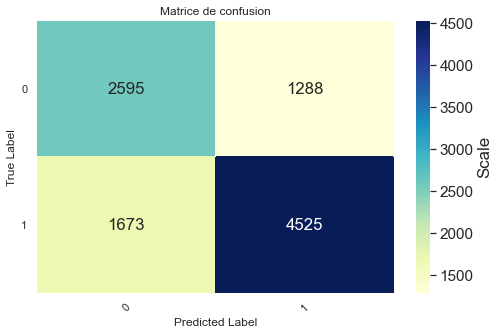

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.7041666666666667
Accuracy : 0.701
Classification Report
              precision    recall  f1-score   support

           0    0.60359   0.64976   0.62582      3883
           1    0.76953   0.73266   0.75064      6198

    accuracy                        0.70072     10081
   macro avg    0.68656   0.69121   0.68823     10081
weighted avg    0.70561   0.70072   0.70256     10081



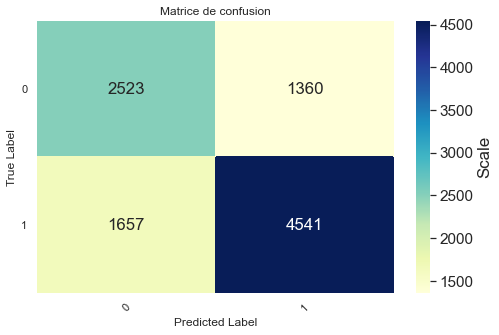

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7256944444444444
Accuracy : 0.720
Classification Report
              precision    recall  f1-score   support

           0    0.62589   0.67602   0.64999      3883
           1    0.78631   0.74685   0.76607      6198

    accuracy                        0.71957     10081
   macro avg    0.70610   0.71144   0.70803     10081
weighted avg    0.72452   0.71957   0.72136     10081



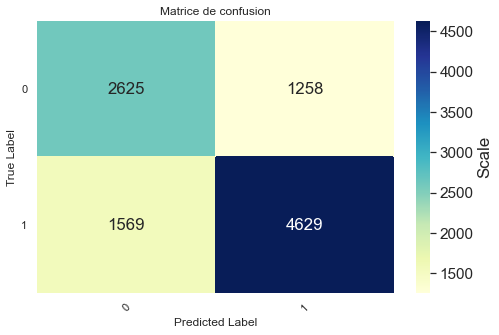

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.6849537037037037
Accuracy : 0.677
Classification Report
              precision    recall  f1-score   support

           0    0.58367   0.55962   0.57139      3883
           1    0.73105   0.74992   0.74036      6198

    accuracy                        0.67662     10081
   macro avg    0.65736   0.65477   0.65588     10081
weighted avg    0.67428   0.67662   0.67528     10081



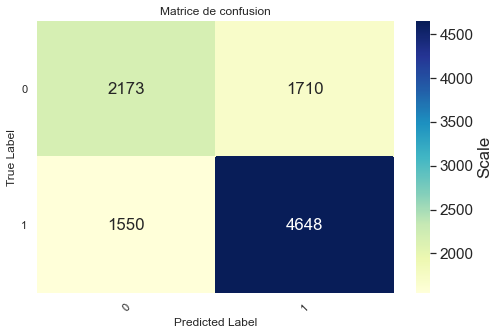

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.712037037037037
Accuracy : 0.703
Classification Report
              precision    recall  f1-score   support

           0    0.61671   0.60623   0.61143      3883
           1    0.75591   0.76396   0.75991      6198

    accuracy                        0.70320     10081
   macro avg    0.68631   0.68509   0.68567     10081
weighted avg    0.70229   0.70320   0.70272     10081



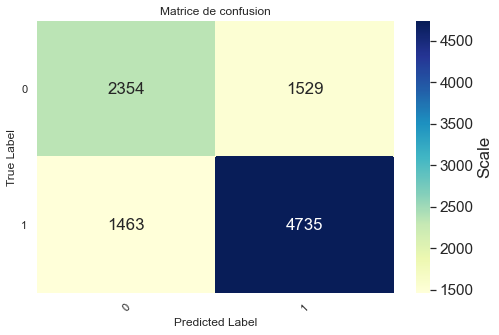

En utilisent text claims, headline, author,keywords,named_entities_claim et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.6987074052615767
Accuracy : 0.706
Classification Report
              precision    recall  f1-score   support

           0    0.61428   0.63817   0.62599      3883
           1    0.76754   0.74883   0.75807      6195

    accuracy                        0.70619     10078
   macro avg    0.69091   0.69350   0.69203     10078
weighted avg    0.70849   0.70619   0.70718     10078



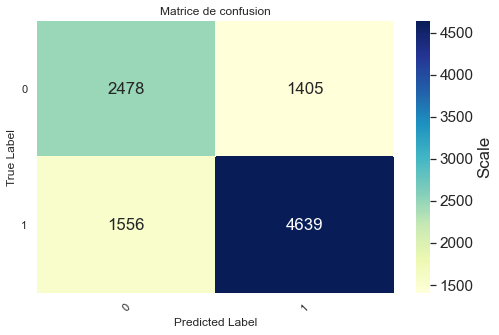

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.7024105725076177
Accuracy : 0.702
Classification Report
              precision    recall  f1-score   support

           0    0.62135   0.58022   0.60008      3883
           1    0.74737   0.77837   0.76255      6195

    accuracy                        0.70202     10078
   macro avg    0.68436   0.67930   0.68132     10078
weighted avg    0.69881   0.70202   0.69995     10078



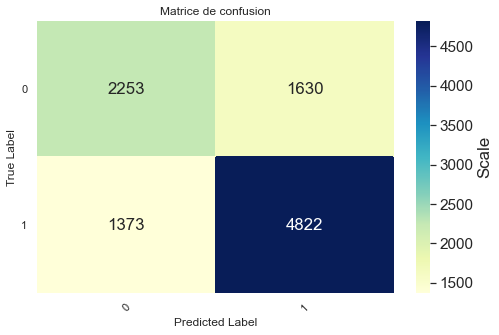

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7061115939230076
Accuracy : 0.714
Classification Report
              precision    recall  f1-score   support

           0    0.64245   0.57842   0.60875      3883
           1    0.75129   0.79822   0.77405      6195

    accuracy                        0.71353     10078
   macro avg    0.69687   0.68832   0.69140     10078
weighted avg    0.70935   0.71353   0.71036     10078



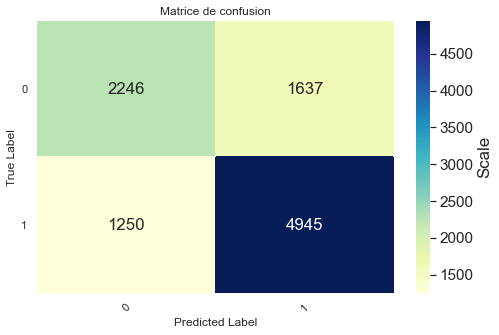

Alogrithm: logisticRegression
best params: {'clf__C': 2000, 'clf__tol': 0.001}
best scores: 0.6892072765117377
Accuracy : 0.687
Classification Report
              precision    recall  f1-score   support

           0    0.60229   0.55421   0.57725      3883
           1    0.73390   0.77062   0.75181      6195

    accuracy                        0.68724     10078
   macro avg    0.66810   0.66242   0.66453     10078
weighted avg    0.68319   0.68724   0.68455     10078



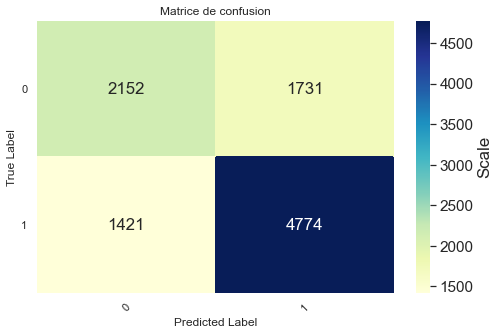

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.7075055791596927
Accuracy : 0.705
Classification Report
              precision    recall  f1-score   support

           0    0.62670   0.58280   0.60395      3883
           1    0.74950   0.78241   0.76560      6195

    accuracy                        0.70550     10078
   macro avg    0.68810   0.68260   0.68477     10078
weighted avg    0.70218   0.70550   0.70332     10078



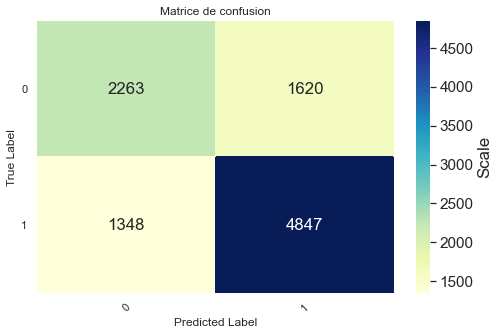

In [18]:

text_normalizer = TextNormalizer()
bestScoredAlgo = []
print("En utilisent text claims comme jeu de donnée")
features = np.array(["text"])
score = classification_avec_pretraitement(features,text_normalizer,dfVF_M)
bestScoredAlgo.append(score)
print("En utilisent source et text claims comme jeu de donnée")
features = np.array(["source","text"])
score = classification_avec_pretraitement(features,text_normalizer,dfVF_M)
bestScoredAlgo.append(score)
print("En utilisent text claims et author comme jeu de donnée")
features = np.array(["text","author"])
score = classification_avec_pretraitement(features,text_normalizer,dfVF_M)
bestScoredAlgo.append(score)
print("En utilisent text claims, headline et author comme jeu de donnée")
features = np.array(["text","headline","author"])
score = classification_avec_pretraitement(features,text_normalizer,dfVF_M)
bestScoredAlgo.append(score)
print("En utilisent text claims, headline, author et named_entities_article comme jeu de donnée")
dfn=dfVF_M.copy()
features = np.array(["text","headline","author","named_entities_article"])
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)
score=classification_avec_pretraitement(features,text_normalizer,dfn)
bestScoredAlgo.append(score)
print("En utilisent text claims, headline, author,keywords et named_entities_article comme jeu de donnée")
features = np.array(["text","headline","author","named_entities_article","keywords"])
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
score=classification_avec_pretraitement(features,text_normalizer,dfn)
bestScoredAlgo.append(score)
print("En utilisent text claims, source, headline, author, keywords et named_entities_article comme jeu de donnée")
features = np.array(["text","source","headline","author","named_entities_article","keywords"])
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
score=classification_avec_pretraitement(features,text_normalizer,dfn)
bestScoredAlgo.append(score)
print("En utilisent text claims, headline, author,keywords,named_entities_claim et named_entities_article comme jeu de donnée")
dfn['named_entities_claim'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['named_entities_claim'], inplace=True)
features = np.array(["text","headline","author","named_entities_article","keywords","named_entities_claim"])
score=classification_avec_pretraitement(features,text_normalizer,dfn)
bestScoredAlgo.append(score)

In [19]:
bestScoredAlgo.sort(key=lambda x: x[3],reverse=True)
print("Le Meilleur score est: "+str(bestScoredAlgo[0][3]))
print("-------------------------")
print("tri du meilleur score et meilleur algorithme de chaque features")
for i in range(len(bestScoredAlgo)):
    print("Features :"+str(bestScoredAlgo[i][0]))
    print("Meilleur Score :"+str(bestScoredAlgo[i][3]))
    print("Générer par l'Algorithm :"+str(bestScoredAlgo[i][2]))
    print("En utilisent le meilleur Parametre :"+str(bestScoredAlgo[i][4]))
    print("-------------------------")


Le Meilleur score est: 0.7256944444444444
-------------------------
tri du meilleur score et meilleur algorithme de chaque features
Features :['text' 'source' 'headline' 'author' 'named_entities_article' 'keywords']
Meilleur Score :0.7256944444444444
Générer par l'Algorithm :RFC
En utilisent le meilleur Parametre :{'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
-------------------------
Features :['text' 'headline' 'author' 'named_entities_article' 'keywords']
Meilleur Score :0.7240740740740741
Générer par l'Algorithm :RFC
En utilisent le meilleur Parametre :{'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
-------------------------
Features :['text' 'headline' 'author' 'named_entities_article']
Meilleur Score :0.7144729264032479
Générer par l'Algorithm :GBC
En utilisent le meilleur Parametre :{'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf':

##### Nous remarquons que le meilleur Algorithme est : AdaBoostClassifier (ADB), et les meilleurs features sont 'text' 'headline' 'author' 'named_entities_article' 'keywords', c'est le meme algorithme et les memes features qu'on a trouver avant avoir effectuer le prétraitement, nous remarquons aussi que le score a augmenter 


### Application du prétraitement brut aux meilleurs algorithmes

#### Les meilleurs scores sont générer par les algorithmes SVM (SVC), GradientBoostingClassifier (GBC) et RandomForestClassifier (RFC).

In [8]:
def Classify(features,cleaner,clf,parameters,df):
    # selection des données
    X=df[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
    y=df.truthRating


    # Création d'un jeu d'apprentissage et de test
    trainsize=0.7 # 70% pour le jeu d'apprentissage, il reste 30% du jeu de données pour le test

    testsize= 0.3
    seed=30
    X_train,X_test,y_train,y_test=train_test_split(X, 
                                                   y, 
                                                   train_size=trainsize, 
                                                   random_state=seed,
                                                   test_size=testsize)

    # création du pipeline en ajoutant le classifier
    pipe = Pipeline([("cleaner", cleaner),
                     ("count_vectorizer", TfidfVectorizer()),
                     ("clf", clf)])
    score='accuracy'
    grid_search = GridSearchCV(pipe, parameters, n_jobs=-1, scoring=score)
    start_time = time.time()
    grid_search.fit(X_train, y_train)
    print("Meilleur résultat : "+ str(grid_search.best_score_))
    # autres mesures et matrice de confusion
    y_pred = grid_search.predict(X_test)
    MyshowAllScores(y_test,y_pred)


#### Utilisation de l'algorithme RandomForestClassifier RFC 

En utilisent 'text','source','headline','author','named_entities_article','keywords' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.721031746031746
Accuracy : 0.714
Classification Report
              precision    recall  f1-score   support

           0    0.62364   0.67792   0.64965      1689
           1    0.78109   0.73746   0.75865      2632

    accuracy                        0.71419      4321
   macro avg    0.70236   0.70769   0.70415      4321
weighted avg    0.71954   0.71419   0.71604      4321



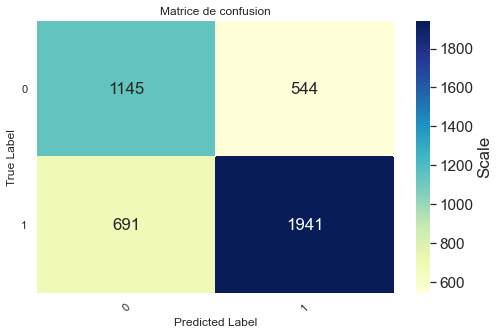

En utilisent 'text','headline','author','named_entities_article','keywords' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7256944444444445
Accuracy : 0.718
Classification Report
              precision    recall  f1-score   support

           0    0.63705   0.64950   0.64321      1689
           1    0.77222   0.76254   0.76735      2632

    accuracy                        0.71835      4321
   macro avg    0.70464   0.70602   0.70528      4321
weighted avg    0.71938   0.71835   0.71883      4321



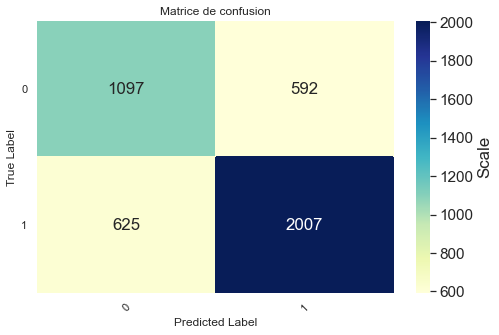

En utilisent 'text','headline','author','named_entities_article' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7163357298174492
Accuracy : 0.717
Classification Report
              precision    recall  f1-score   support

           0    0.63496   0.57309   0.60244      1724
           1    0.75837   0.80264   0.77988      2878

    accuracy                        0.71664      4602
   macro avg    0.69667   0.68786   0.69116      4602
weighted avg    0.71214   0.71664   0.71341      4602



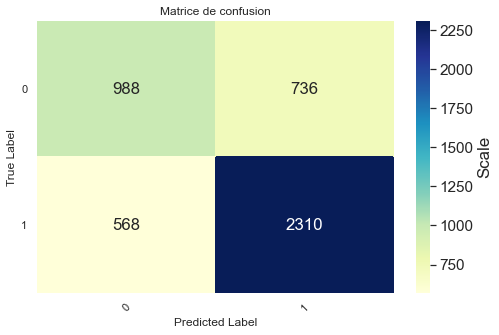

In [21]:
text_normalizer = TextNormalizer(removestopwords=True, # suppression des stopwords
                 lowercase=True,# passage en minuscule
                 removedigit=True, # supprimer les nombres 
                 transformdigit=True, # transforamation des chiffre en lettres
                 getstemmer=True,# racinisation des termes 
                 getlemmatisation=True, # lemmatisation des termes 
                 remove_non_ascii=True # supprimer les caractéres non ascii
                            )
parameters = {'clf__n_estimators':[200], 'clf__criterion':['gini'],'clf__min_samples_split':[2],
                        'clf__min_samples_leaf': [2]}


clf = RandomForestClassifier()
print("En utilisent 'text','source','headline','author','named_entities_article','keywords' comme jeu de donnée")
features = np.array(['text','source','headline','author','named_entities_article','keywords'])
dfn=dfVF_M.copy()
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn)

print("En utilisent 'text','headline','author','named_entities_article','keywords' comme jeu de donnée")
features = np.array(['text','headline','author','named_entities_article','keywords'])
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn)

dfn_article=dfVF_M.copy()
dfn_article['named_entities_article'].replace('', np.nan, inplace=True)
dfn_article.dropna(subset=['named_entities_article'], inplace=True)

print("En utilisent 'text','headline','author','named_entities_article' comme jeu de donnée")
features = np.array(['text','headline','author','named_entities_article'])
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn_article)

#### Utilisation de l'algorithme AdaBoostClassifier SVM

En utilisent 'text','source','headline','author','named_entities_article','keywords' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.713095238095238
Accuracy : 0.703
Classification Report
              precision    recall  f1-score   support

           0    0.62221   0.61042   0.61626      1689
           1    0.75300   0.76216   0.75755      2632

    accuracy                        0.70285      4321
   macro avg    0.68761   0.68629   0.68691      4321
weighted avg    0.70188   0.70285   0.70232      4321



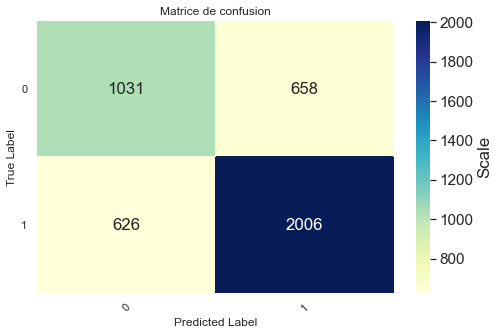

En utilisent 'text','headline','author','named_entities_article','keywords' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7114087301587302
Accuracy : 0.702
Classification Report
              precision    recall  f1-score   support

           0    0.62370   0.60154   0.61242      1689
           1    0.75000   0.76710   0.75845      2632

    accuracy                        0.70238      4321
   macro avg    0.68685   0.68432   0.68543      4321
weighted avg    0.70063   0.70238   0.70137      4321



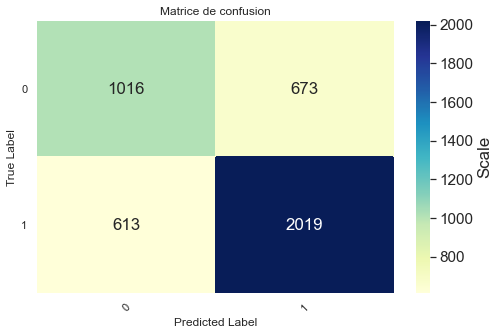

En utilisent 'text','headline','author','named_entities_article' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7088855958554616
Accuracy : 0.708
Classification Report
              precision    recall  f1-score   support

           0    0.62179   0.56265   0.59074      1724
           1    0.75214   0.79500   0.77297      2878

    accuracy                        0.70795      4602
   macro avg    0.68697   0.67882   0.68186      4602
weighted avg    0.70331   0.70795   0.70471      4602



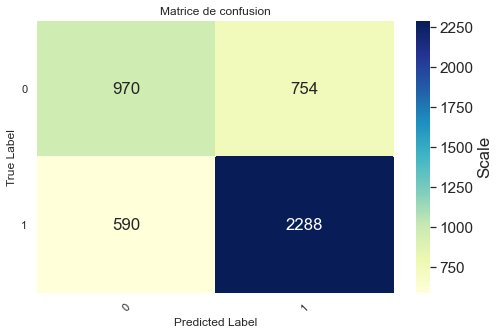

In [23]:
text_normalizer = TextNormalizer(removestopwords=True, # suppression des stopwords
                 lowercase=True,# passage en minuscule
                 removedigit=True, # supprimer les nombres 
                 transformdigit=True, # transforamation des chiffre en lettres
                 getstemmer=True,# racinisation des termes 
                 getlemmatisation=True, # lemmatisation des termes 
                 remove_non_ascii=True # supprimer les caractéres non ascii
                            )
parameters = {'clf__C': [1], 'clf__gamma': [1], 'clf__kernel': ['linear']}

clf = SVC()
print("En utilisent 'text','source','headline','author','named_entities_article','keywords' comme jeu de donnée")
features = np.array(['text','source','headline','author','named_entities_article','keywords'])
dfnADB=dfVF_M.copy()
dfnADB['named_entities_article'].replace('', np.nan, inplace=True)
dfnADB['keywords'].replace("", np.nan, inplace=True)
dfnADB.dropna(subset=['named_entities_article'], inplace=True)
dfnADB.dropna(subset=['keywords'], inplace=True)
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfnADB)

print("En utilisent 'text','headline','author','named_entities_article','keywords' comme jeu de donnée")
features = np.array(['text','headline','author','named_entities_article','keywords'])
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfnADB)

dfnADBarticle=dfVF_M.copy()
dfnADBarticle['named_entities_article'].replace('', np.nan, inplace=True)
dfnADBarticle.dropna(subset=['named_entities_article'], inplace=True)

print("En utilisent 'text','headline','author','named_entities_article' comme jeu de donnée")
features = np.array(['text','headline','author','named_entities_article'])
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfnADBarticle)

#### Utilisation de l'algorithme GradientBoostingClassifier GBC


En utilisent 'source','headline','author','named_entities_article','keywords' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7179563492063492
Accuracy : 0.714
Classification Report
              precision    recall  f1-score   support

           0    0.61442   0.72173   0.66376      1689
           1    0.79889   0.70935   0.75146      2632

    accuracy                        0.71419      4321
   macro avg    0.70665   0.71554   0.70761      4321
weighted avg    0.72678   0.71419   0.71718      4321



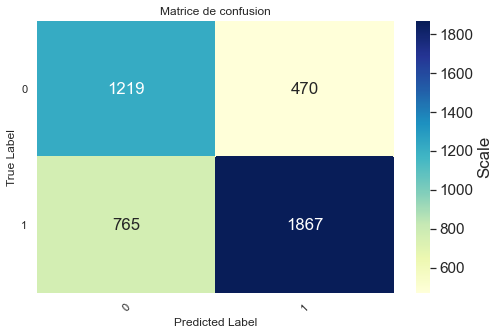

En utilisent 'text','headline','author','named_entities_article','keywords' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7068452380952381
Accuracy : 0.706
Classification Report
              precision    recall  f1-score   support

           0    0.60609   0.70693   0.65264      1689
           1    0.78945   0.70517   0.74493      2632

    accuracy                        0.70586      4321
   macro avg    0.69777   0.70605   0.69879      4321
weighted avg    0.71778   0.70586   0.70886      4321



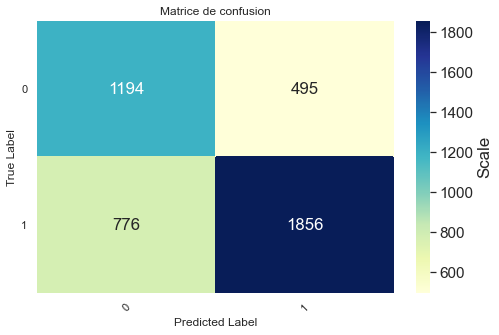

En utilisent 'text','headline','author','named_entities_article' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7125164470973746
Accuracy : 0.716
Classification Report
              precision    recall  f1-score   support

           0    0.61085   0.66647   0.63745      1724
           1    0.78868   0.74566   0.76657      2878

    accuracy                        0.71599      4602
   macro avg    0.69976   0.70607   0.70201      4602
weighted avg    0.72206   0.71599   0.71820      4602



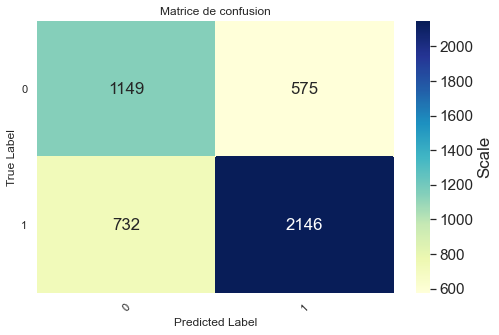

In [24]:
text_normalizer = TextNormalizer(removestopwords=True, # suppression des stopwords
                 lowercase=True,# passage en minuscule
                 removedigit=True, # supprimer les nombres 
                 transformdigit=True, # transforamation des chiffre en lettres
                 getstemmer=True,# racinisation des termes 
                 getlemmatisation=True, # lemmatisation des termes 
                 remove_non_ascii=True # supprimer les caractéres non ascii
                            )
parameters = {'clf__learning_rate':[0.3],'clf__n_estimators':[100,200], 'clf__max_depth':[3],
                         'clf__min_samples_split':[2],'clf__min_samples_leaf': [2]}

clf = GradientBoostingClassifier()
print("En utilisent 'source','headline','author','named_entities_article','keywords' comme jeu de donnée")
features = np.array(['source','headline','author','named_entities_article','keywords'])
dfnGBC=dfVF_M.copy()
dfnGBC['named_entities_article'].replace('', np.nan, inplace=True)
dfnGBC['keywords'].replace("", np.nan, inplace=True)
dfnGBC.dropna(subset=['named_entities_article'], inplace=True)
dfnGBC.dropna(subset=['keywords'], inplace=True)
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfnGBC)

print("En utilisent 'text','headline','author','named_entities_article','keywords' comme jeu de donnée")
features = np.array(['text','headline','author','named_entities_article','keywords'])
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfnGBC)

dfnGBCarticle=dfVF_M.copy()
dfnGBCarticle['named_entities_article'].replace('', np.nan, inplace=True)
dfnGBCarticle.dropna(subset=['named_entities_article'], inplace=True)

print("En utilisent 'text','headline','author','named_entities_article' comme jeu de donnée")
features = np.array(['text','headline','author','named_entities_article'])
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfnGBCarticle)

#### Nous déduisons que le meilleur algorithme est RandomForestClassifier (RFC) 

### Application du prétraitement lower case et remove stop words sur l'algorithme RFC

En utilisent 'text','source','headline','author','named_entities_article','keywords' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7258928571428571
Accuracy : 0.710
Classification Report
              precision    recall  f1-score   support

           0    0.61993   0.67022   0.64410      1689
           1    0.77675   0.73632   0.75600      2632

    accuracy                        0.71048      4321
   macro avg    0.69834   0.70327   0.70005      4321
weighted avg    0.71546   0.71048   0.71226      4321



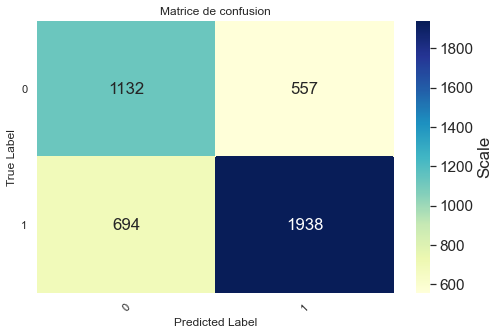

En utilisent 'text','headline','author','named_entities_article','keywords' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.720436507936508
Accuracy : 0.707
Classification Report
              precision    recall  f1-score   support

           0    0.62154   0.63884   0.63007      1689
           1    0.76402   0.75038   0.75714      2632

    accuracy                        0.70678      4321
   macro avg    0.69278   0.69461   0.69361      4321
weighted avg    0.70833   0.70678   0.70747      4321



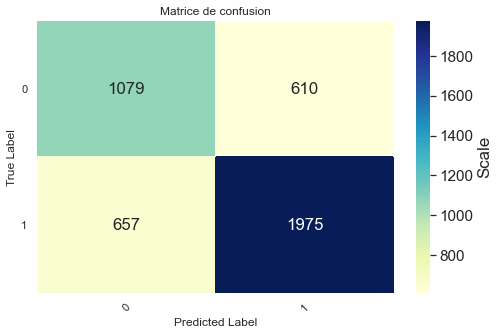

En utilisent 'text','headline','author','named_entities_article' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7194086590877748
Accuracy : 0.717
Classification Report
              precision    recall  f1-score   support

           0    0.63294   0.58411   0.60754      1724
           1    0.76187   0.79708   0.77908      2878

    accuracy                        0.71730      4602
   macro avg    0.69740   0.69059   0.69331      4602
weighted avg    0.71357   0.71730   0.71482      4602



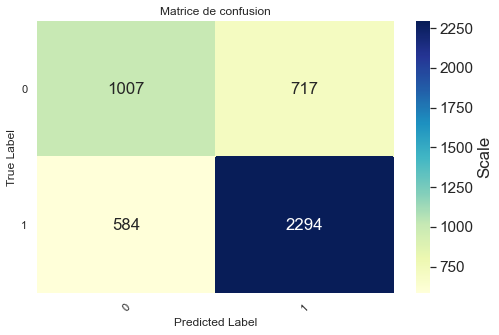

In [25]:
text_normalizer = TextNormalizer(removestopwords=True, # suppression des stopwords
                 lowercase=True,# passage en minuscule
                 removedigit=False, # supprimer les nombres 
                 transformdigit=False, # transforamation des chiffre en lettres
                 getstemmer=False,# racinisation des termes 
                 getlemmatisation=False, # lemmatisation des termes 
                 remove_non_ascii=False # supprimer les caractéres non ascii
                 )
parameters = {'clf__n_estimators':[200], 'clf__criterion':['gini'],'clf__min_samples_split':[2],
                        'clf__min_samples_leaf': [2]}


clf = RandomForestClassifier()
print("En utilisent 'text','source','headline','author','named_entities_article','keywords' comme jeu de donnée")
features = np.array(['text','source','headline','author','named_entities_article','keywords'])
dfn=dfVF_M.copy()
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn)

print("En utilisent 'text','headline','author','named_entities_article','keywords' comme jeu de donnée")
features = np.array(['text','headline','author','named_entities_article','keywords'])
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn)

dfn_article=dfVF_M.copy()
dfn_article['named_entities_article'].replace('', np.nan, inplace=True)
dfn_article.dropna(subset=['named_entities_article'], inplace=True)

print("En utilisent 'text','headline','author','named_entities_article' comme jeu de donnée")
features = np.array(['text','headline','author','named_entities_article'])
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn_article)

### Application du prétraitement lower case et remove stop words et lemmatisation sur le meilleur algorithme et les meilleurs features

#### Application sur l'algorithme RFC en utilisent les features 'source','headline','author','named_entities_article','keywords

En utilisent 'text','source','headline','author','named_entities_article','keywords' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7242063492063492
Accuracy : 0.717
Classification Report
              precision    recall  f1-score   support

           0    0.62895   0.67140   0.64948      1689
           1    0.77959   0.74582   0.76233      2632

    accuracy                        0.71673      4321
   macro avg    0.70427   0.70861   0.70591      4321
weighted avg    0.72071   0.71673   0.71822      4321



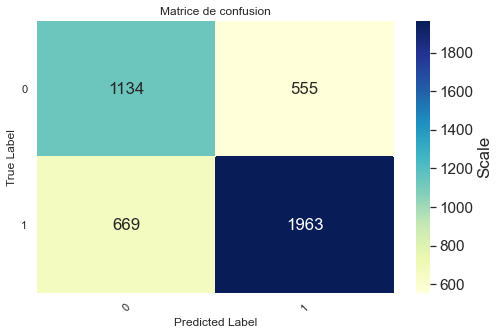

En utilisent 'text','headline','author','named_entities_article','keywords' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.720734126984127
Accuracy : 0.710
Classification Report
              precision    recall  f1-score   support

           0    0.62696   0.63884   0.63284      1689
           1    0.76538   0.75608   0.76070      2632

    accuracy                        0.71025      4321
   macro avg    0.69617   0.69746   0.69677      4321
weighted avg    0.71128   0.71025   0.71073      4321



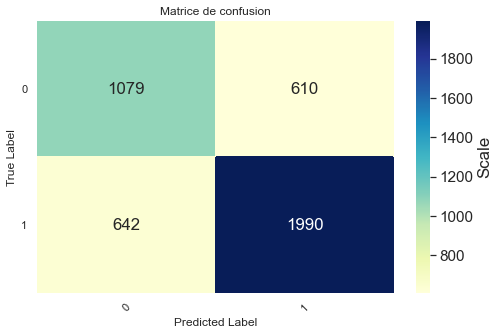

En utilisent 'text','headline','author','named_entities_article' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7179189445408646
Accuracy : 0.719
Classification Report
              precision    recall  f1-score   support

           0    0.63671   0.58353   0.60896      1724
           1    0.76241   0.80056   0.78102      2878

    accuracy                        0.71925      4602
   macro avg    0.69956   0.69204   0.69499      4602
weighted avg    0.71532   0.71925   0.71656      4602



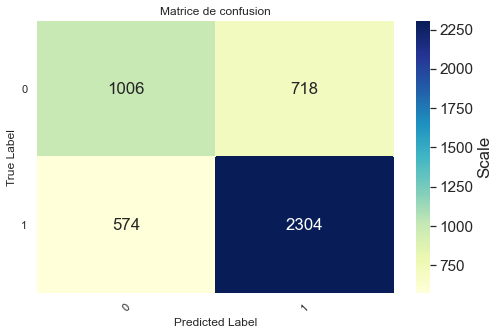

In [27]:
text_normalizer = TextNormalizer(removestopwords=True, # suppression des stopwords
                 lowercase=True,# passage en minuscule
                 removedigit=False, # supprimer les nombres 
                 transformdigit=False, # transforamation des chiffre en lettres
                 getstemmer=False,# racinisation des termes 
                 getlemmatisation=True, # lemmatisation des termes 
                 remove_non_ascii=False # supprimer les caractéres non ascii
                 )
parameters = {'clf__n_estimators':[200], 'clf__criterion':['gini'],'clf__min_samples_split':[2],
                        'clf__min_samples_leaf': [2]}


clf = RandomForestClassifier()
print("En utilisent 'text','source','headline','author','named_entities_article','keywords' comme jeu de donnée")
features = np.array(['text','source','headline','author','named_entities_article','keywords'])
dfn=dfVF_M.copy()
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn)

print("En utilisent 'text','headline','author','named_entities_article','keywords' comme jeu de donnée")
features = np.array(['text','headline','author','named_entities_article','keywords'])
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn)

dfn_article=dfVF_M.copy()
dfn_article['named_entities_article'].replace('', np.nan, inplace=True)
dfn_article.dropna(subset=['named_entities_article'], inplace=True)

print("En utilisent 'text','headline','author','named_entities_article' comme jeu de donnée")
features = np.array(['text','headline','author','named_entities_article'])
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn_article)


##### On déduit que les meilleurs features sont : 'text','source','headline','author','named_entities_article','keywords'

### Application du prétraitement lower case et remove stop words et lemmatisation et transformation des digit en lettre

En utilisent 'text','source','headline','author','named_entities_article','keywords' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7246031746031747
Accuracy : 0.712
Classification Report
              precision    recall  f1-score   support

           0    0.62493   0.65897   0.64150      1689
           1    0.77323   0.74620   0.75947      2632

    accuracy                        0.71210      4321
   macro avg    0.69908   0.70259   0.70049      4321
weighted avg    0.71526   0.71210   0.71336      4321



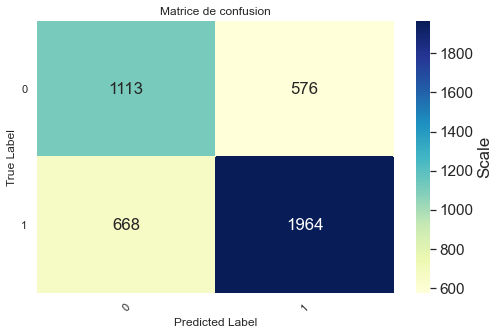

In [29]:
text_normalizer = TextNormalizer(removestopwords=True, # suppression des stopwords
                 lowercase=True,# passage en minuscule
                 removedigit=False, # supprimer les nombres 
                 transformdigit=True, # transforamation des chiffre en lettres
                 getstemmer=False,# racinisation des termes 
                 getlemmatisation=True, # lemmatisation des termes 
                 remove_non_ascii=False # supprimer les caractéres non ascii
                 )
parameters = {'clf__n_estimators':[200], 'clf__criterion':['gini'],'clf__min_samples_split':[2],
                        'clf__min_samples_leaf': [2]}


clf = RandomForestClassifier()
print("En utilisent 'text','source','headline','author','named_entities_article','keywords' comme jeu de donnée")
features = np.array(['text','source','headline','author','named_entities_article','keywords'])
dfn=dfVF_M.copy()
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn)

### Application du prétraitement suppression des stopwords, passage en miniscule, supprimer les nombres et supprimer les caractéres non ascii

En utilisent 'text','source','headline','author','named_entities_article','keywords' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7231150793650793
Accuracy : 0.714
Classification Report
              precision    recall  f1-score   support

           0    0.62548   0.66844   0.64625      1689
           1    0.77742   0.74316   0.75991      2632

    accuracy                        0.71396      4321
   macro avg    0.70145   0.70580   0.70308      4321
weighted avg    0.71803   0.71396   0.71548      4321



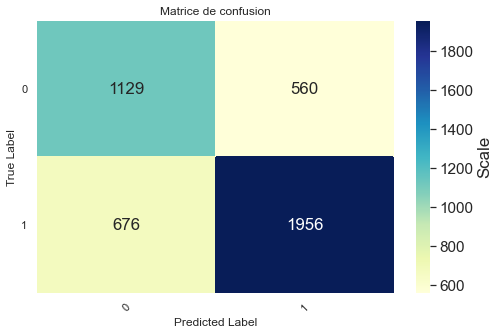

In [30]:
text_normalizer = TextNormalizer(removestopwords=True, # suppression des stopwords
                 lowercase=True,# passage en minuscule
                 removedigit=True, # supprimer les nombres 
                 transformdigit=False, # transforamation des chiffre en lettres
                 getstemmer=False,# racinisation des termes 
                 getlemmatisation=True, # lemmatisation des termes 
                 remove_non_ascii=True # supprimer les caractéres non ascii
                 )
parameters = {'clf__n_estimators':[200], 'clf__criterion':['gini'],'clf__min_samples_split':[2],
                        'clf__min_samples_leaf': [2]}


clf = RandomForestClassifier()
print("En utilisent 'text','source','headline','author','named_entities_article','keywords' comme jeu de donnée")
features = np.array(['text','source','headline','author','named_entities_article','keywords'])
dfn=dfVF_M.copy()
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn)

##### On déduit que le meilleur prétraitement est la transoformation en lower case et remove stop words et lemmatisation et transformation des digit en lettre

# Equilibrage des données

## Random under-sampling

14452 10000
Random under-sampling:
MIXTURE    10000
FALSE       6984
TRUE        3016
Name: ratingName, dtype: int64


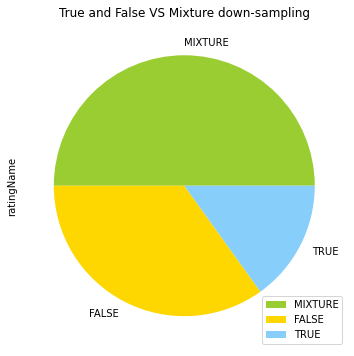

Random under-sampling:
MIXTURE       10000
True/False    10000
Name: ratingName, dtype: int64


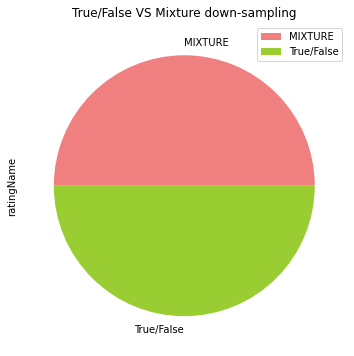

In [12]:

dfrvf = df[df.ratingName != "ratingName"]

dfrvfm = df['ratingName'].apply(lambda x: "True/False" if x == "TRUE" or x == "FALSE" else "MIXTURE")

count_class_true_false,count_class_mixture = dfrvfm.value_counts()
print(count_class_true_false,count_class_mixture)

df_class_mixture = dfrvf[dfrvf['ratingName'] == "MIXTURE"]
df_class_true_false = dfrvf[dfrvf['ratingName'] != "MIXTURE"]

df_class_true_false_under = df_class_true_false.sample(count_class_mixture)
df_test_under = pd.concat([df_class_true_false_under, df_class_mixture], axis=0)

print('Random under-sampling:')
print(df_test_under.ratingName.value_counts())

colors = ['yellowgreen', 'gold', 'lightskyblue']

df_test_under["ratingName"].value_counts().plot(kind='pie', 
                                  title = "True and False VS Mixture down-sampling",
                                  figsize=(6,6),colors=colors, 
                                  legend=True)

plt.show()

dfrvfm["ratingName"] = df['ratingName'].apply(lambda x: "True/False" if x == "TRUE" or x == "FALSE" else "MIXTURE")
#print(dfrvfm["ratingName"])
df_class_mixture = dfrvf[dfrvf['ratingName'] == "MIXTURE"]
df_class_true_false = dfrvf[dfrvf["ratingName"] != "MIXTURE"]
#print(df_class_true_false)
df_class_true_false_under = df_class_true_false.sample(count_class_mixture)

dfVF_M_under = pd.concat([df_class_true_false_under, df_class_mixture], axis=0)
dfVF_M_under["ratingName"] = dfVF_M_under['ratingName'].apply(lambda x: "True/False" if x == "TRUE" or x == "FALSE" else "MIXTURE")


print('Random under-sampling:')
print(dfVF_M_under.ratingName.value_counts())
colors = ['lightcoral', 'yellowgreen', 'lightskyblue']

dfVF_M_under["ratingName"].value_counts().plot(kind='pie', 
                                  title = "True/False VS Mixture down-sampling",
                                  figsize=(6,6),colors=colors, 
                                  legend=True)

plt.show()
dfVF_M_under['truthRating'] =dfVF_M_under['truthRating'].apply(lambda x: '1' if x == '1' or x == '3' else '0')


### Application du prétraitement brut en utilisent le down sampling

En utilisent text claims comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.6196666666666667
Accuracy : 0.641
Classification Report
              precision    recall  f1-score   support

           0    0.64689   0.62166   0.63403      6999
           1    0.63596   0.66076   0.64813      7001

    accuracy                        0.64121     14000
   macro avg    0.64143   0.64121   0.64108     14000
weighted avg    0.64143   0.64121   0.64108     14000



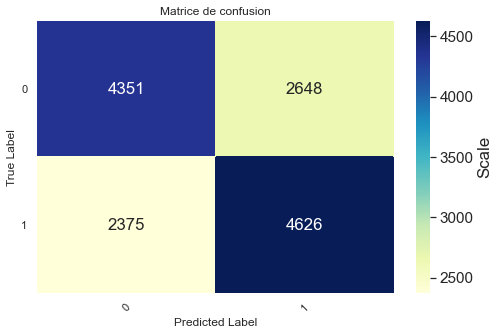

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6244999999999999
Accuracy : 0.635
Classification Report
              precision    recall  f1-score   support

           0    0.63798   0.62595   0.63191      6999
           1    0.63297   0.64491   0.63888      7001

    accuracy                        0.63543     14000
   macro avg    0.63548   0.63543   0.63540     14000
weighted avg    0.63548   0.63543   0.63540     14000



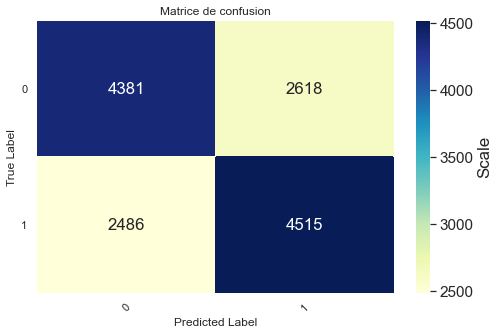

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6548333333333333
Accuracy : 0.663
Classification Report
              precision    recall  f1-score   support

           0    0.64566   0.72325   0.68226      6999
           1    0.68555   0.60320   0.64174      7001

    accuracy                        0.66321     14000
   macro avg    0.66561   0.66322   0.66200     14000
weighted avg    0.66561   0.66321   0.66200     14000



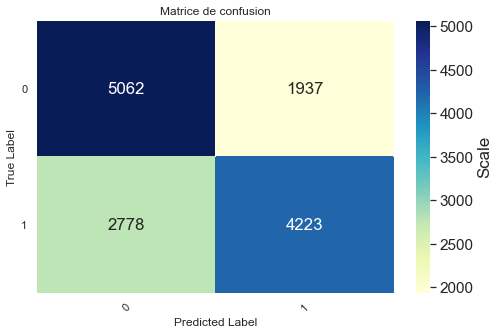

Alogrithm: logisticRegression
best params: {'clf__C': 2000, 'clf__tol': 0.001}
best scores: 0.6026666666666667
Accuracy : 0.601
Classification Report
              precision    recall  f1-score   support

           0    0.60238   0.59266   0.59748      6999
           1    0.59924   0.60891   0.60404      7001

    accuracy                        0.60079     14000
   macro avg    0.60081   0.60078   0.60076     14000
weighted avg    0.60081   0.60079   0.60076     14000



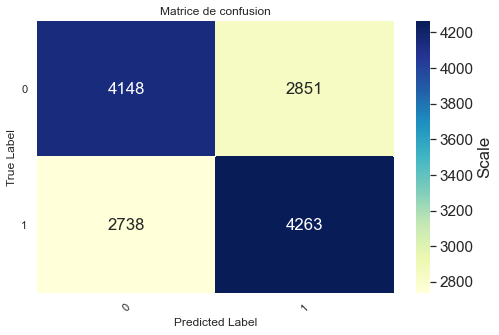

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6483333333333333
Accuracy : 0.652
Classification Report
              precision    recall  f1-score   support

           0    0.64453   0.67953   0.66157      6999
           1    0.66123   0.62534   0.64278      7001

    accuracy                        0.65243     14000
   macro avg    0.65288   0.65243   0.65218     14000
weighted avg    0.65288   0.65243   0.65217     14000



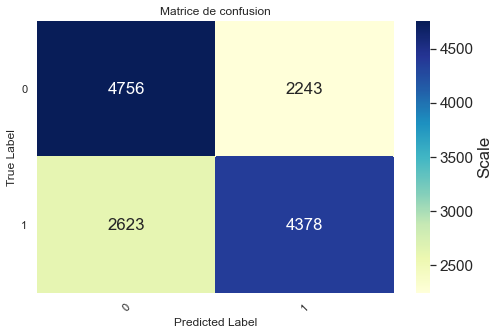

En utilisent source et text claims comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.6715
Accuracy : 0.683
Classification Report
              precision    recall  f1-score   support

           0    0.65312   0.77854   0.71034      6999
           1    0.72600   0.58663   0.64892      7001

    accuracy                        0.68257     14000
   macro avg    0.68956   0.68259   0.67963     14000
weighted avg    0.68957   0.68257   0.67962     14000



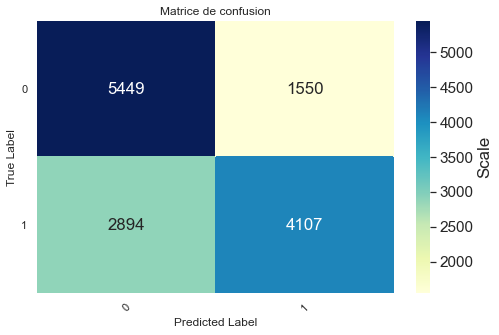

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.6598333333333334
Accuracy : 0.676
Classification Report
              precision    recall  f1-score   support

           0    0.65194   0.75496   0.69968      6999
           1    0.70908   0.59706   0.64826      7001

    accuracy                        0.67600     14000
   macro avg    0.68051   0.67601   0.67397     14000
weighted avg    0.68051   0.67600   0.67397     14000



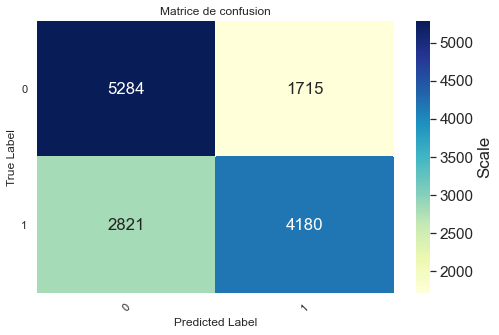

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6828333333333333
Accuracy : 0.695
Classification Report
              precision    recall  f1-score   support

           0    0.66212   0.79740   0.72349      6999
           1    0.74547   0.59320   0.66067      7001

    accuracy                        0.69529     14000
   macro avg    0.70379   0.69530   0.69208     14000
weighted avg    0.70380   0.69529   0.69208     14000



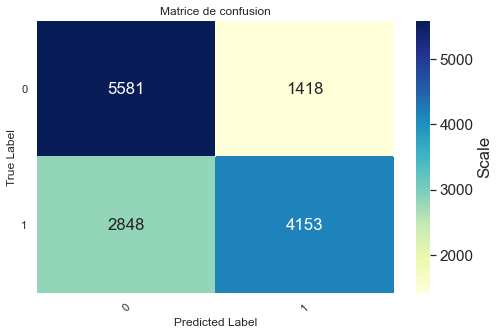

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.6163333333333334
Accuracy : 0.616
Classification Report
              precision    recall  f1-score   support

           0    0.62011   0.60009   0.60993      6999
           1    0.61270   0.63248   0.62243      7001

    accuracy                        0.61629     14000
   macro avg    0.61641   0.61628   0.61618     14000
weighted avg    0.61641   0.61629   0.61618     14000



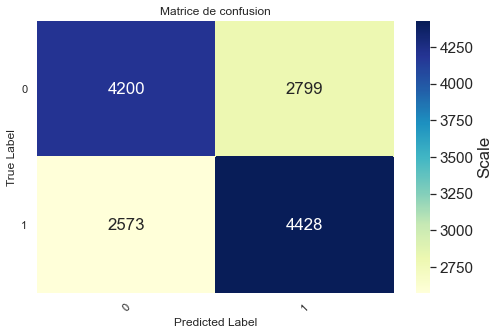

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6666666666666666
Accuracy : 0.675
Classification Report
              precision    recall  f1-score   support

           0    0.65782   0.72925   0.69169      6999
           1    0.69636   0.62077   0.65640      7001

    accuracy                        0.67500     14000
   macro avg    0.67709   0.67501   0.67404     14000
weighted avg    0.67709   0.67500   0.67404     14000



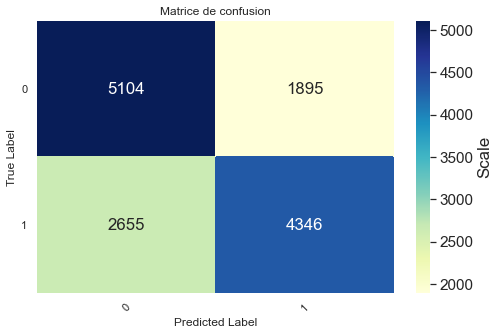

En utilisent text claims et author comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.6828333333333333
Accuracy : 0.698
Classification Report
              precision    recall  f1-score   support

           0    0.67095   0.77611   0.71971      6999
           1    0.73459   0.61948   0.67214      7001

    accuracy                        0.69779     14000
   macro avg    0.70277   0.69780   0.69593     14000
weighted avg    0.70277   0.69779   0.69592     14000



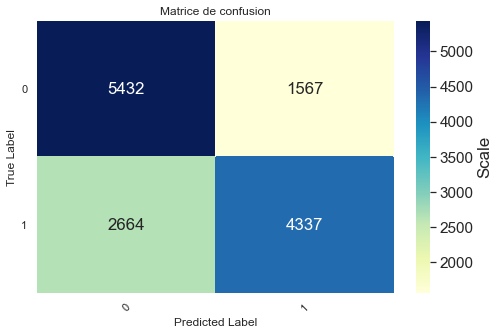

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.6793333333333333
Accuracy : 0.694
Classification Report
              precision    recall  f1-score   support

           0    0.67195   0.75682   0.71187      6999
           1    0.72176   0.63062   0.67312      7001

    accuracy                        0.69371     14000
   macro avg    0.69686   0.69372   0.69249     14000
weighted avg    0.69686   0.69371   0.69249     14000



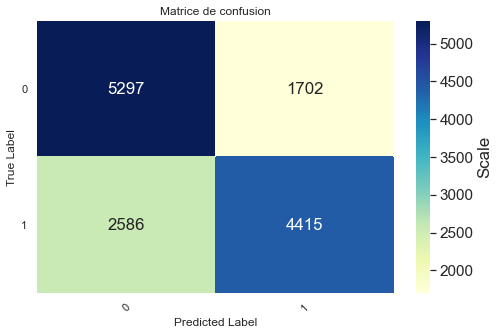

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.692
Accuracy : 0.703
Classification Report
              precision    recall  f1-score   support

           0    0.67536   0.78025   0.72403      6999
           1    0.73994   0.62505   0.67766      7001

    accuracy                        0.70264     14000
   macro avg    0.70765   0.70265   0.70085     14000
weighted avg    0.70766   0.70264   0.70084     14000



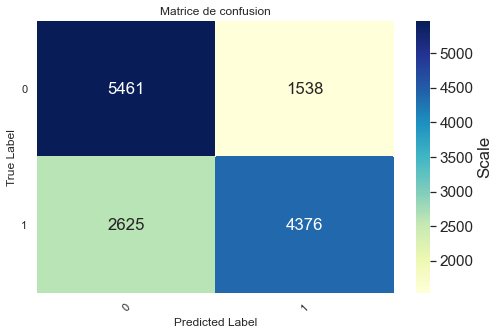

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.6333333333333333
Accuracy : 0.628
Classification Report
              precision    recall  f1-score   support

           0    0.63135   0.61466   0.62289      6999
           1    0.62469   0.64119   0.63283      7001

    accuracy                        0.62793     14000
   macro avg    0.62802   0.62793   0.62786     14000
weighted avg    0.62802   0.62793   0.62786     14000



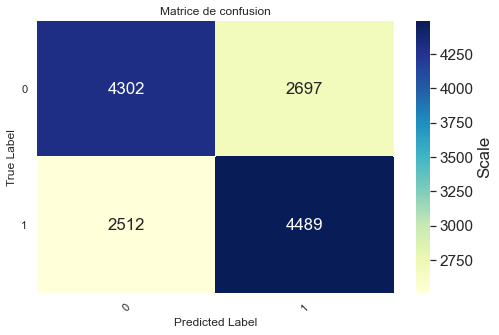

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6821666666666666
Accuracy : 0.690
Classification Report
              precision    recall  f1-score   support

           0    0.67484   0.73182   0.70217      6999
           1    0.70718   0.64748   0.67601      7001

    accuracy                        0.68964     14000
   macro avg    0.69101   0.68965   0.68909     14000
weighted avg    0.69101   0.68964   0.68909     14000



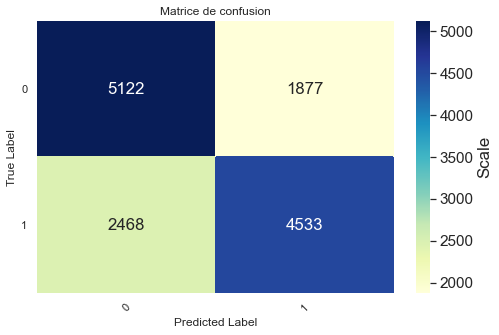

En utilisent text claims, headline et author comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.7
Accuracy : 0.712
Classification Report
              precision    recall  f1-score   support

           0    0.68703   0.77754   0.72949      6999
           1    0.74387   0.64591   0.69144      7001

    accuracy                        0.71171     14000
   macro avg    0.71545   0.71172   0.71046     14000
weighted avg    0.71546   0.71171   0.71046     14000



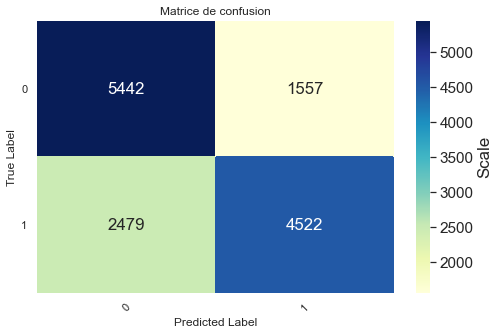

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.689
Accuracy : 0.703
Classification Report
              precision    recall  f1-score   support

           0    0.68311   0.75797   0.71859      6999
           1    0.72826   0.64848   0.68606      7001

    accuracy                        0.70321     14000
   macro avg    0.70569   0.70322   0.70233     14000
weighted avg    0.70569   0.70321   0.70232     14000



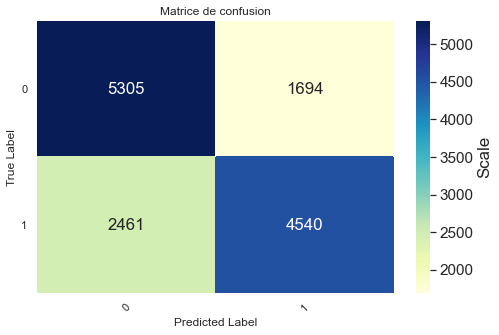

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7051666666666666
Accuracy : 0.712
Classification Report
              precision    recall  f1-score   support

           0    0.68445   0.78654   0.73195      6999
           1    0.74920   0.63748   0.68884      7001

    accuracy                        0.71200     14000
   macro avg    0.71682   0.71201   0.71040     14000
weighted avg    0.71683   0.71200   0.71039     14000



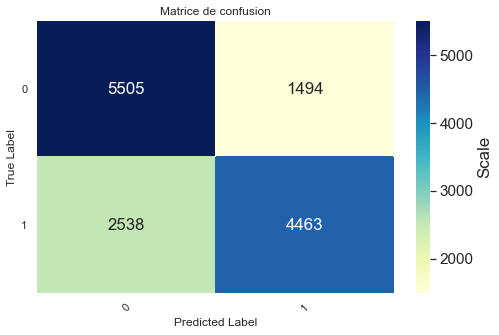

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.6355
Accuracy : 0.648
Classification Report
              precision    recall  f1-score   support

           0    0.65041   0.63852   0.64441      6999
           1    0.64511   0.65691   0.65096      7001

    accuracy                        0.64771     14000
   macro avg    0.64776   0.64771   0.64768     14000
weighted avg    0.64776   0.64771   0.64768     14000



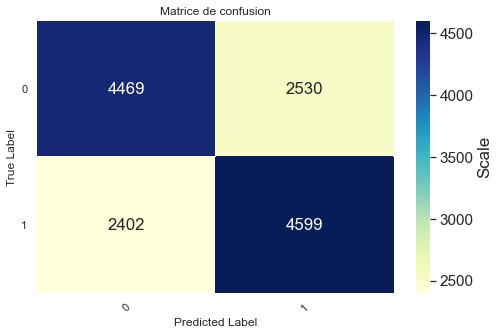

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6813333333333333
Accuracy : 0.696
Classification Report
              precision    recall  f1-score   support

           0    0.68268   0.73310   0.70699      6999
           1    0.71191   0.65933   0.68461      7001

    accuracy                        0.69621     14000
   macro avg    0.69729   0.69622   0.69580     14000
weighted avg    0.69729   0.69621   0.69580     14000



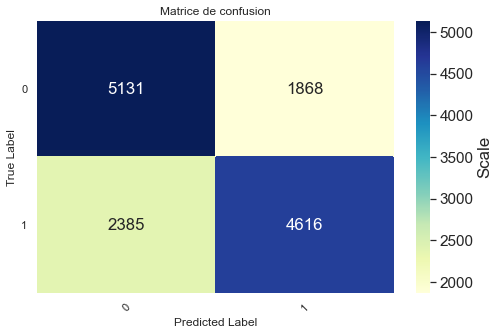

En utilisent text claims, headline, author et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.6825431627085775
Accuracy : 0.709
Classification Report
              precision    recall  f1-score   support

           0    0.68299   0.70341   0.69305      4046
           1    0.73387   0.71469   0.72415      4630

    accuracy                        0.70943      8676
   macro avg    0.70843   0.70905   0.70860      8676
weighted avg    0.71014   0.70943   0.70965      8676



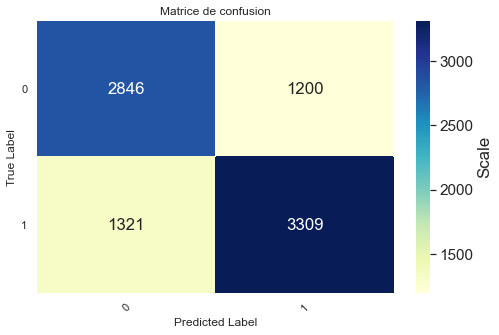

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.6798586086629329
Accuracy : 0.704
Classification Report
              precision    recall  f1-score   support

           0    0.68030   0.69056   0.68539      4046
           1    0.72598   0.71641   0.72117      4630

    accuracy                        0.70436      8676
   macro avg    0.70314   0.70349   0.70328      8676
weighted avg    0.70468   0.70436   0.70448      8676



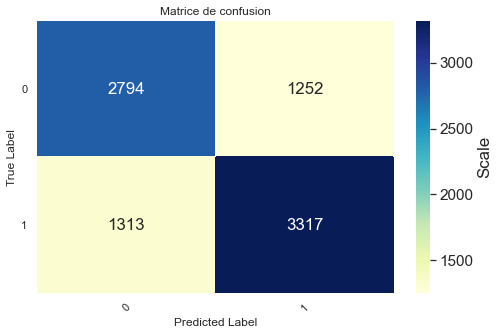

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6906160002315518
Accuracy : 0.715
Classification Report
              precision    recall  f1-score   support

           0    0.68973   0.70712   0.69832      4046
           1    0.73830   0.72203   0.73007      4630

    accuracy                        0.71508      8676
   macro avg    0.71401   0.71457   0.71419      8676
weighted avg    0.71565   0.71508   0.71526      8676



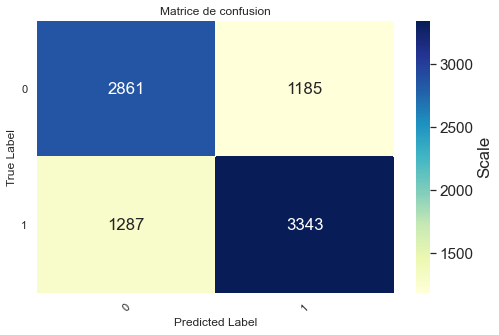

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.6335742919579154
Accuracy : 0.648
Classification Report
              precision    recall  f1-score   support

           0    0.62519   0.61221   0.61863      4046
           1    0.66716   0.67927   0.67316      4630

    accuracy                        0.64799      8676
   macro avg    0.64618   0.64574   0.64590      8676
weighted avg    0.64759   0.64799   0.64773      8676



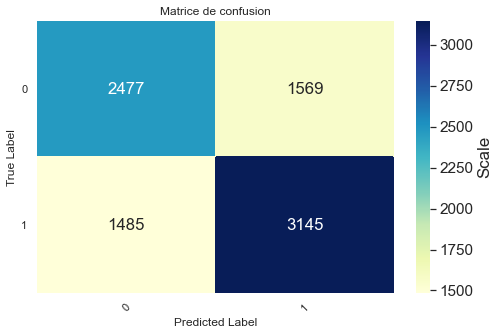

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6790405794584581
Accuracy : 0.686
Classification Report
              precision    recall  f1-score   support

           0    0.66751   0.65052   0.65891      4046
           1    0.70125   0.71685   0.70896      4630

    accuracy                        0.68592      8676
   macro avg    0.68438   0.68368   0.68393      8676
weighted avg    0.68551   0.68592   0.68562      8676



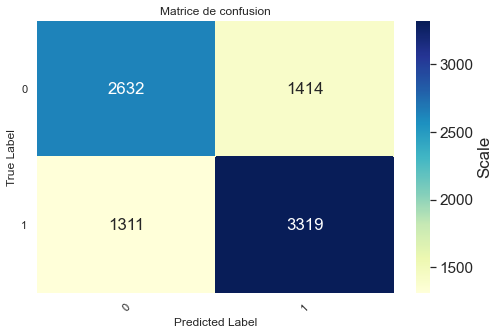

En utilisent text claims, headline, author,keywords et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.6972019563888322
Accuracy : 0.702
Classification Report
              precision    recall  f1-score   support

           0    0.67219   0.72933   0.69959      3894
           1    0.73323   0.67655   0.70375      4282

    accuracy                        0.70169      8176
   macro avg    0.70271   0.70294   0.70167      8176
weighted avg    0.70416   0.70169   0.70177      8176



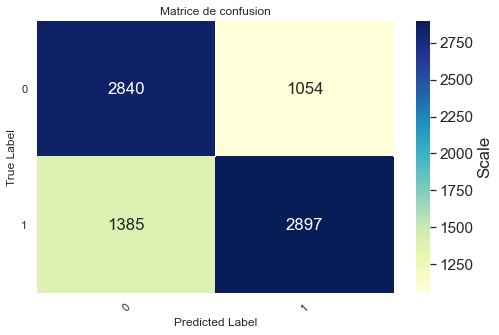

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6983435907886693
Accuracy : 0.698
Classification Report
              precision    recall  f1-score   support

           0    0.67776   0.69569   0.68660      3894
           1    0.71644   0.69921   0.70772      4282

    accuracy                        0.69753      8176
   macro avg    0.69710   0.69745   0.69716      8176
weighted avg    0.69802   0.69753   0.69766      8176



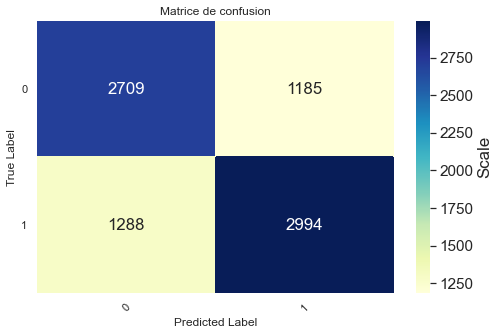

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7186024047279396
Accuracy : 0.719
Classification Report
              precision    recall  f1-score   support

           0    0.68168   0.76939   0.72289      3894
           1    0.76250   0.67328   0.71512      4282

    accuracy                        0.71906      8176
   macro avg    0.72209   0.72134   0.71900      8176
weighted avg    0.72401   0.71906   0.71882      8176



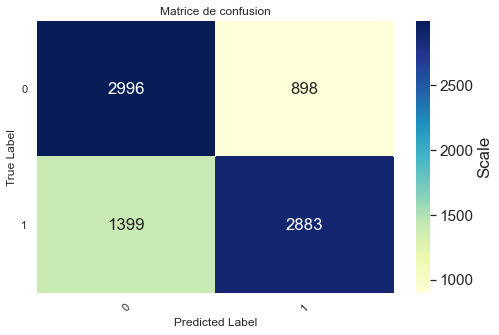

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.6629492561646627
Accuracy : 0.672
Classification Report
              precision    recall  f1-score   support

           0    0.66023   0.64124   0.65060      3894
           1    0.68207   0.69991   0.69087      4282

    accuracy                        0.67197      8176
   macro avg    0.67115   0.67057   0.67074      8176
weighted avg    0.67167   0.67197   0.67169      8176



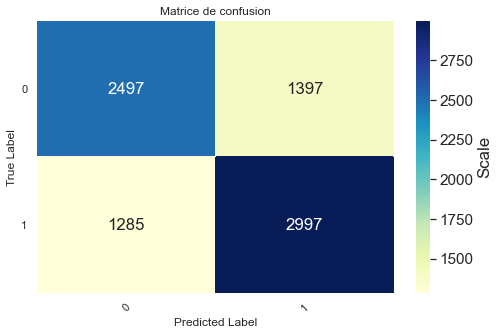

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6974787038923986
Accuracy : 0.710
Classification Report
              precision    recall  f1-score   support

           0    0.68647   0.71803   0.70190      3894
           1    0.73239   0.70177   0.71676      4282

    accuracy                        0.70952      8176
   macro avg    0.70943   0.70990   0.70933      8176
weighted avg    0.71052   0.70952   0.70968      8176



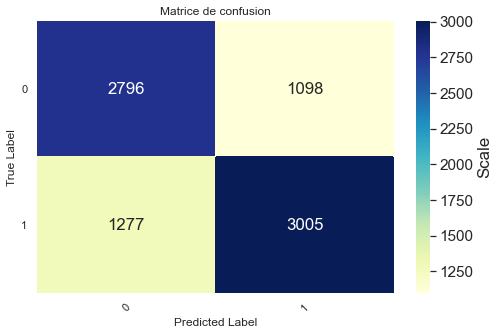

En utilisent text claims, source, headline, author, keywords et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.6940648053800693
Accuracy : 0.702
Classification Report
              precision    recall  f1-score   support

           0    0.67400   0.72419   0.69819      3894
           1    0.73096   0.68146   0.70534      4282

    accuracy                        0.70181      8176
   macro avg    0.70248   0.70282   0.70177      8176
weighted avg    0.70383   0.70181   0.70194      8176



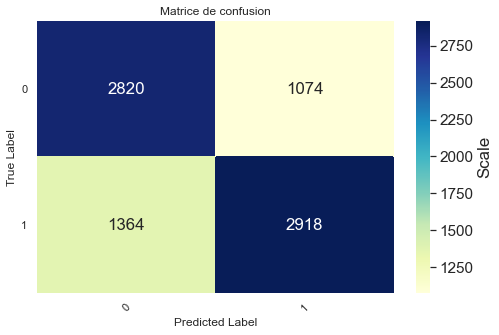

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.7000546158549011
Accuracy : 0.701
Classification Report
              precision    recall  f1-score   support

           0    0.67744   0.71084   0.69373      3894
           1    0.72469   0.69220   0.70807      4282

    accuracy                        0.70108      8176
   macro avg    0.70106   0.70152   0.70090      8176
weighted avg    0.70219   0.70108   0.70124      8176



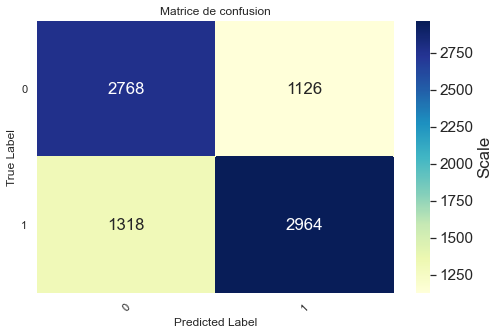

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7200321988995313
Accuracy : 0.721
Classification Report
              precision    recall  f1-score   support

           0    0.68151   0.77812   0.72662      3894
           1    0.76836   0.66931   0.71543      4282

    accuracy                        0.72114      8176
   macro avg    0.72494   0.72372   0.72102      8176
weighted avg    0.72700   0.72114   0.72076      8176



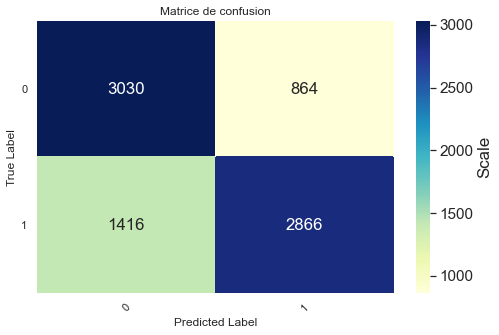

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.6660876299164459
Accuracy : 0.673
Classification Report
              precision    recall  f1-score   support

           0    0.66173   0.64304   0.65225      3894
           1    0.68352   0.70107   0.69218      4282

    accuracy                        0.67343      8176
   macro avg    0.67262   0.67206   0.67222      8176
weighted avg    0.67314   0.67343   0.67317      8176



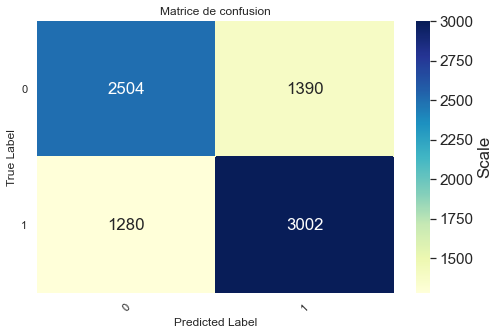

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.702332178520481
Accuracy : 0.713
Classification Report
              precision    recall  f1-score   support

           0    0.68811   0.72522   0.70618      3894
           1    0.73723   0.70107   0.71870      4282

    accuracy                        0.71257      8176
   macro avg    0.71267   0.71315   0.71244      8176
weighted avg    0.71384   0.71257   0.71273      8176



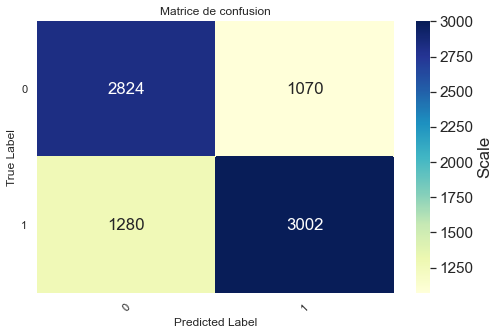

En utilisent text claims, headline, author,keywords,named_entities_claim et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.7058773181169757
Accuracy : 0.704
Classification Report
              precision    recall  f1-score   support

           0    0.67381   0.73486   0.70301      3896
           1    0.73682   0.67602   0.70511      4278

    accuracy                        0.70406      8174
   macro avg    0.70531   0.70544   0.70406      8174
weighted avg    0.70678   0.70406   0.70411      8174



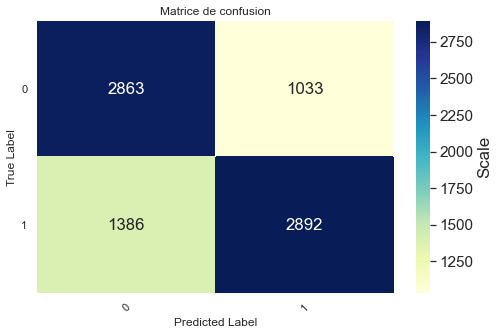

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7055952720603219
Accuracy : 0.704
Classification Report
              precision    recall  f1-score   support

           0    0.67879   0.71869   0.69817      3896
           1    0.72932   0.69028   0.70926      4278

    accuracy                        0.70382      8174
   macro avg    0.70405   0.70448   0.70371      8174
weighted avg    0.70523   0.70382   0.70397      8174



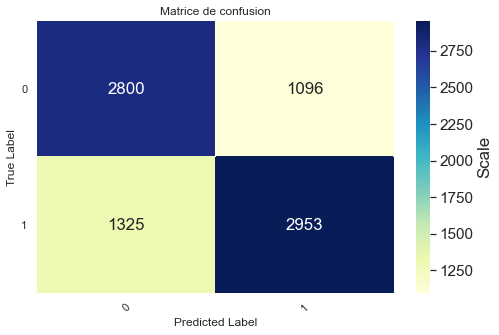

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7212977379254127
Accuracy : 0.725
Classification Report
              precision    recall  f1-score   support

           0    0.68495   0.78516   0.73164      3896
           1    0.77427   0.67111   0.71901      4278

    accuracy                        0.72547      8174
   macro avg    0.72961   0.72814   0.72533      8174
weighted avg    0.73170   0.72547   0.72503      8174



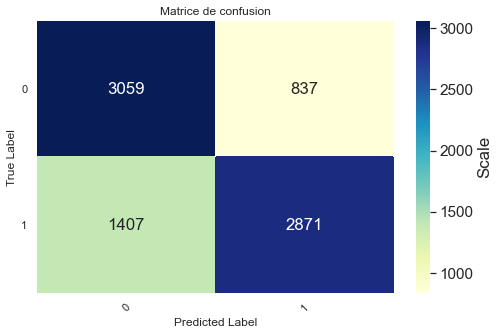

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.6778985123293254
Accuracy : 0.674
Classification Report
              precision    recall  f1-score   support

           0    0.65958   0.65298   0.65626      3896
           1    0.68682   0.69308   0.68994      4278

    accuracy                        0.67397      8174
   macro avg    0.67320   0.67303   0.67310      8174
weighted avg    0.67384   0.67397   0.67389      8174



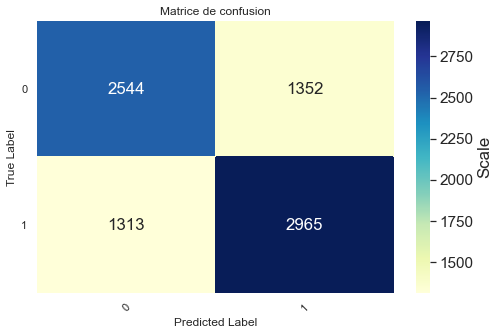

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6998834318320766
Accuracy : 0.711
Classification Report
              precision    recall  f1-score   support

           0    0.68056   0.74204   0.70997      3896
           1    0.74401   0.68280   0.71209      4278

    accuracy                        0.71103      8174
   macro avg    0.71228   0.71242   0.71103      8174
weighted avg    0.71377   0.71103   0.71108      8174



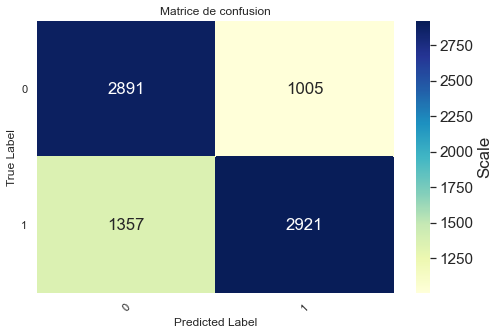

In [14]:
text_normalizer = TextNormalizer()
underBestScoredAlgo = []
print("En utilisent text claims comme jeu de donnée")
features = np.array(["text"])
score = classification_avec_pretraitement(features,text_normalizer,dfVF_M_under)
underBestScoredAlgo.append(score)
print("En utilisent source et text claims comme jeu de donnée")
features = np.array(["source","text"])
score = classification_avec_pretraitement(features,text_normalizer,dfVF_M_under)
underBestScoredAlgo.append(score)
print("En utilisent text claims et author comme jeu de donnée")
features = np.array(["text","author"])
score = classification_avec_pretraitement(features,text_normalizer,dfVF_M_under)
underBestScoredAlgo.append(score)
print("En utilisent text claims, headline et author comme jeu de donnée")
features = np.array(["text","headline","author"])
score = classification_avec_pretraitement(features,text_normalizer,dfVF_M_under)
underBestScoredAlgo.append(score)
print("En utilisent text claims, headline, author et named_entities_article comme jeu de donnée")
dfn=dfVF_M_under.copy()
features = np.array(["text","headline","author","named_entities_article"])
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)
score=classification_avec_pretraitement(features,text_normalizer,dfn)
underBestScoredAlgo.append(score)
print("En utilisent text claims, headline, author,keywords et named_entities_article comme jeu de donnée")
features = np.array(["text","headline","author","named_entities_article","keywords"])
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
score=classification_avec_pretraitement(features,text_normalizer,dfn)
underBestScoredAlgo.append(score)
print("En utilisent text claims, source, headline, author, keywords et named_entities_article comme jeu de donnée")
features = np.array(["text","source","headline","author","named_entities_article","keywords"])
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
score=classification_avec_pretraitement(features,text_normalizer,dfn)
underBestScoredAlgo.append(score)
print("En utilisent text claims, headline, author,keywords,named_entities_claim et named_entities_article comme jeu de donnée")
dfn['named_entities_claim'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['named_entities_claim'], inplace=True)
features = np.array(["text","headline","author","named_entities_article","keywords","named_entities_claim"])
score=classification_avec_pretraitement(features,text_normalizer,dfn)
underBestScoredAlgo.append(score)

In [15]:
underBestScoredAlgo.sort(key=lambda x: x[3],reverse=True)
print("Meilleur score "+str(underBestScoredAlgo[0][3]))
print("tri de meilleur score et meilleur algorithme de chaque features")
for i in range(len(underBestScoredAlgo)):
    print("Features :"+str(underBestScoredAlgo[i][0]))
    print("Meilleur Score :"+str(underBestScoredAlgo[i][3]))
    print("Meilleur Algorithm :"+str(underBestScoredAlgo[i][2]))
    print("Meilleur Parametre :"+str(underBestScoredAlgo[i][4]))
    print("-------------------------")

Meilleur score 0.7212977379254127
tri de meilleur score et meilleur algorithme de chaque features
Features :['text' 'headline' 'author' 'named_entities_article' 'keywords'
 'named_entities_claim']
Meilleur Score :0.7212977379254127
Meilleur Algorithm :RFC
Meilleur Parametre :{'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
-------------------------
Features :['text' 'source' 'headline' 'author' 'named_entities_article' 'keywords']
Meilleur Score :0.7200321988995313
Meilleur Algorithm :RFC
Meilleur Parametre :{'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
-------------------------
Features :['text' 'headline' 'author' 'named_entities_article' 'keywords']
Meilleur Score :0.7186024047279396
Meilleur Algorithm :RFC
Meilleur Parametre :{'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
-------------------------

##### On remarque que le meilleur algorithme n'a pas changer, c'est toujour RandomForestClassifier (RFC)

### Application du meilleur prétraitement sur les meilleurs features

En utilisent 'text','source','headline','author','named_entities_article','keywords' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.723302752293578
Accuracy : 0.725
Classification Report
              precision    recall  f1-score   support

           0    0.68163   0.79197   0.73267      1668
           1    0.77842   0.66394   0.71664      1836

    accuracy                        0.72489      3504
   macro avg    0.73002   0.72795   0.72465      3504
weighted avg    0.73234   0.72489   0.72427      3504



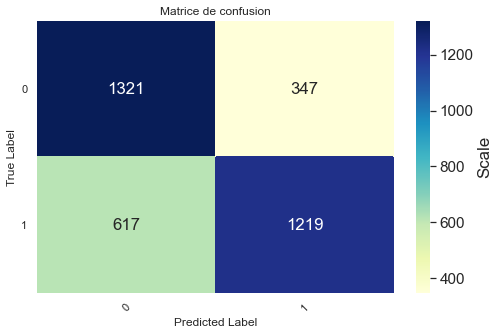

En utilisent 'text','headline','author','named_entities_article','keywords' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.721223241590214
Accuracy : 0.729
Classification Report
              precision    recall  f1-score   support

           0    0.68370   0.80216   0.73821      1668
           1    0.78668   0.66285   0.71948      1836

    accuracy                        0.72917      3504
   macro avg    0.73519   0.73251   0.72884      3504
weighted avg    0.73766   0.72917   0.72839      3504



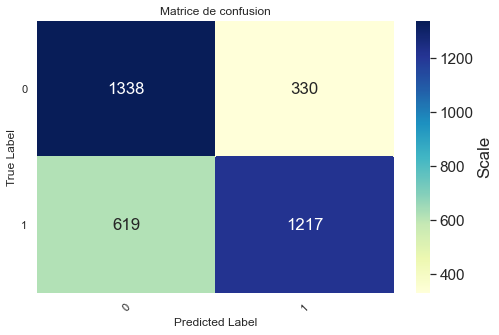

En utilisent 'text','headline','author','named_entities_article' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7140057636887609
Accuracy : 0.726
Classification Report
              precision    recall  f1-score   support

           0    0.69533   0.74686   0.72018      1754
           1    0.75791   0.70774   0.73196      1964

    accuracy                        0.72620      3718
   macro avg    0.72662   0.72730   0.72607      3718
weighted avg    0.72838   0.72620   0.72640      3718



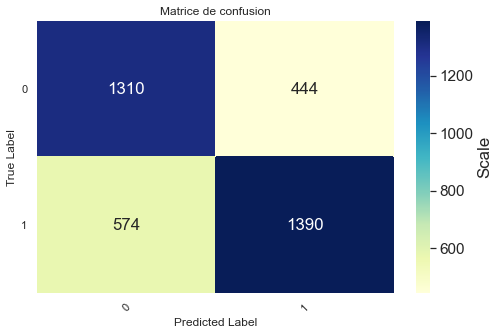

In [24]:
text_normalizer = TextNormalizer(removestopwords=True, # suppression des stopwords
                 lowercase=True,# passage en minuscule
                 removedigit=False, # supprimer les nombres 
                 transformdigit=False, # transforamation des chiffre en lettres
                 getstemmer=False,# racinisation des termes 
                 getlemmatisation=True, # lemmatisation des termes 
                 remove_non_ascii=False # supprimer les caractéres non ascii
                 )
parameters = {'clf__n_estimators':[200], 'clf__criterion':['gini'],'clf__min_samples_split':[2],
                        'clf__min_samples_leaf': [2]}


clf = RandomForestClassifier()
print("En utilisent 'text','source','headline','author','named_entities_article','keywords' comme jeu de donnée")
features = np.array(['text','source','headline','author','named_entities_article','keywords'])
dfn=dfVF_M_under.copy()
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn)

print("En utilisent 'text','headline','author','named_entities_article','keywords' comme jeu de donnée")
features = np.array(['text','headline','author','named_entities_article','keywords'])
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn)

dfn_article=dfVF_M_under.copy()
dfn_article['named_entities_article'].replace('', np.nan, inplace=True)
dfn_article.dropna(subset=['named_entities_article'], inplace=True)

print("En utilisent 'text','headline','author','named_entities_article' comme jeu de donnée")
features = np.array(['text','headline','author','named_entities_article'])
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn_article)

## Random Over Sampling

Random over-sampling:
MIXTURE    14452
FALSE      10000
TRUE        4452
Name: ratingName, dtype: int64


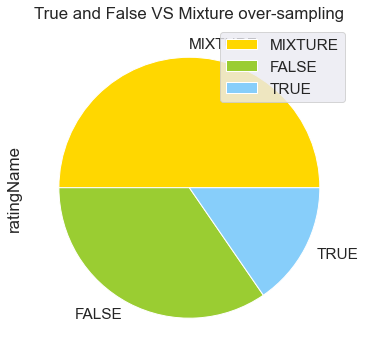

Random under-sampling:
MIXTURE       14452
True/False    14452
Name: ratingName, dtype: int64


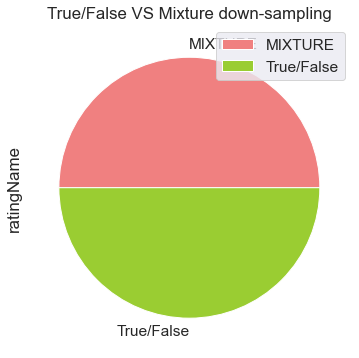

In [18]:

dfrvf = df[df.ratingName != "ratingName"]
dfrvfm = df['ratingName'].apply(lambda x: "True/False" if x == "TRUE" or x == "FALSE" else "MIXTURE")
# Class count
count_class_true_false,count_class_mixture = dfrvfm.value_counts()

df_class_mixture = dfrvf[dfrvf['ratingName'] == "MIXTURE"]
df_class_true_false = dfrvf[dfrvf['ratingName'] != "MIXTURE"]

df_class_mixture_over = df_class_mixture.sample(count_class_true_false, replace=True)
df_test_over = pd.concat([df_class_mixture_over, df_class_true_false], axis=0)

print('Random over-sampling:')
print(df_test_over.ratingName.value_counts())

colors = ['gold', 'yellowgreen', 'lightskyblue']

df_test_over["ratingName"].value_counts().plot(kind='pie', 
                                  title = "True and False VS Mixture over-sampling",
                                  figsize=(6,6),colors=colors, 
                                  legend=True)

plt.show()

dfrvfm["ratingName"] = df['ratingName'].apply(lambda x: "True/False" if x == "TRUE" or x == "FALSE" else "MIXTURE")
#print(dfrvfm["ratingName"])
df_class_mixture = dfrvf[dfrvf['ratingName'] == "MIXTURE"]
df_class_true_false = dfrvf[dfrvf["ratingName"] != "MIXTURE"]
#print(df_class_true_false)
df_class_mixture_over = df_class_mixture_over.sample(count_class_true_false,replace=True)

dfVF_M_over = pd.concat([df_class_mixture_over, df_class_true_false], axis=0)
dfVF_M_over["ratingName"] = dfVF_M_over['ratingName'].apply(lambda x: "True/False" if x == "TRUE" or x == "FALSE" else "MIXTURE")

print('Random under-sampling:')
print(dfVF_M_over.ratingName.value_counts())
colors = ['lightcoral', 'yellowgreen', 'lightskyblue']

dfVF_M_over["ratingName"].value_counts().plot(kind='pie', 
                                  title = "True/False VS Mixture down-sampling",
                                  figsize=(6,6),colors=colors, 
                                  legend=True)

plt.show()

dfVF_M_over['truthRating'] =dfVF_M_over['truthRating'].apply(lambda x: '1' if x == '1' or x == '3' else '0')


En utilisent text claims comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.6472149151235337
Accuracy : 0.661
Classification Report
              precision    recall  f1-score   support

           0    0.66773   0.64286   0.65506     10125
           1    0.65513   0.67956   0.66712     10108

    accuracy                        0.66120     20233
   macro avg    0.66143   0.66121   0.66109     20233
weighted avg    0.66143   0.66120   0.66108     20233



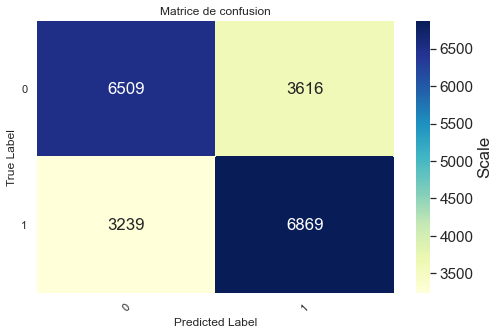

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6790453682744501
Accuracy : 0.688
Classification Report
              precision    recall  f1-score   support

           0    0.68269   0.70272   0.69256     10125
           1    0.69320   0.67283   0.68287     10108

    accuracy                        0.68779     20233
   macro avg    0.68795   0.68777   0.68771     20233
weighted avg    0.68794   0.68779   0.68772     20233



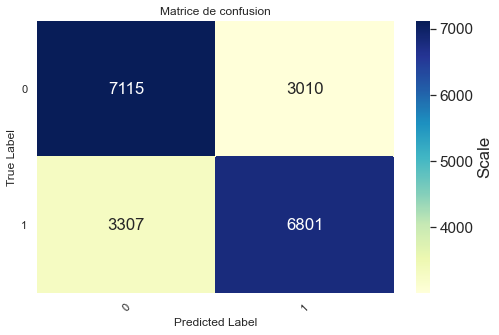

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7144519675983634
Accuracy : 0.726
Classification Report
              precision    recall  f1-score   support

           0    0.70252   0.78440   0.74120     10125
           1    0.75549   0.66729   0.70866     10108

    accuracy                        0.72589     20233
   macro avg    0.72900   0.72584   0.72493     20233
weighted avg    0.72898   0.72589   0.72494     20233



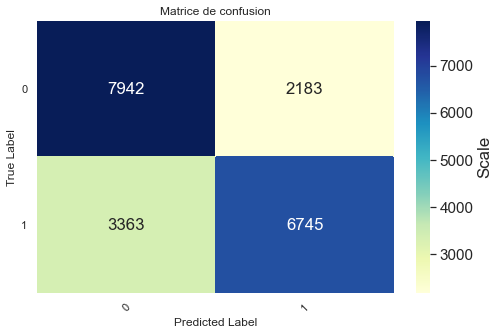

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.6861961316141985
Accuracy : 0.710
Classification Report
              precision    recall  f1-score   support

           0    0.69024   0.76257   0.72460     10125
           1    0.73428   0.65720   0.69360     10108

    accuracy                        0.70993     20233
   macro avg    0.71226   0.70989   0.70910     20233
weighted avg    0.71224   0.70993   0.70912     20233



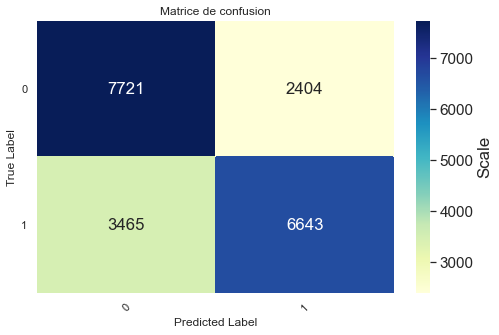

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.7069541198408503
Accuracy : 0.722
Classification Report
              precision    recall  f1-score   support

           0    0.70342   0.76741   0.73402     10125
           1    0.74366   0.67590   0.70816     10108

    accuracy                        0.72169     20233
   macro avg    0.72354   0.72165   0.72109     20233
weighted avg    0.72352   0.72169   0.72110     20233



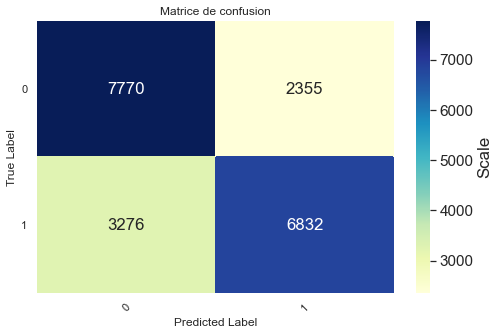

En utilisent source et text claims comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.6861958657000689
Accuracy : 0.695
Classification Report
              precision    recall  f1-score   support

           0    0.65949   0.80780   0.72615     10125
           1    0.75150   0.58221   0.65611     10108

    accuracy                        0.69510     20233
   macro avg    0.70550   0.69501   0.69113     20233
weighted avg    0.70546   0.69510   0.69116     20233



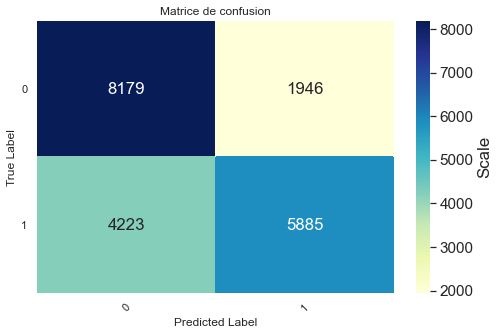

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.6959986571336451
Accuracy : 0.700
Classification Report
              precision    recall  f1-score   support

           0    0.66678   0.79960   0.72717     10125
           1    0.74923   0.59972   0.66619     10108

    accuracy                        0.69975     20233
   macro avg    0.70800   0.69966   0.69668     20233
weighted avg    0.70797   0.69975   0.69671     20233



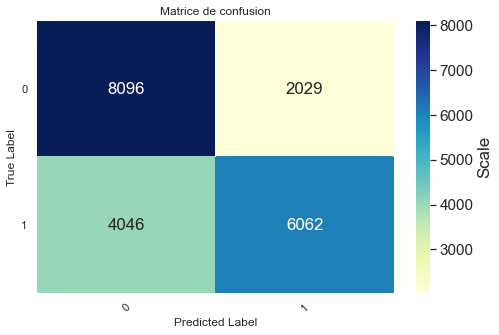

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7227541391196248
Accuracy : 0.728
Classification Report
              precision    recall  f1-score   support

           0    0.68720   0.83625   0.75443     10125
           1    0.79044   0.61872   0.69412     10108

    accuracy                        0.72757     20233
   macro avg    0.73882   0.72748   0.72428     20233
weighted avg    0.73878   0.72757   0.72430     20233



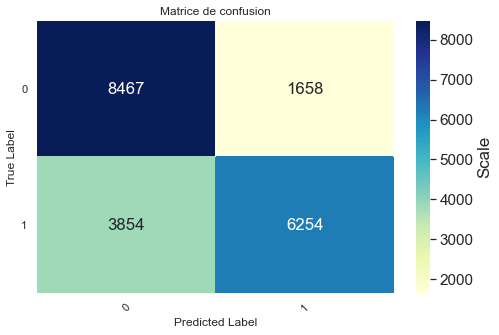

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.6951916077500673
Accuracy : 0.719
Classification Report
              precision    recall  f1-score   support

           0    0.70029   0.76662   0.73195     10125
           1    0.74172   0.67135   0.70478     10108

    accuracy                        0.71902     20233
   macro avg    0.72100   0.71898   0.71837     20233
weighted avg    0.72099   0.71902   0.71838     20233



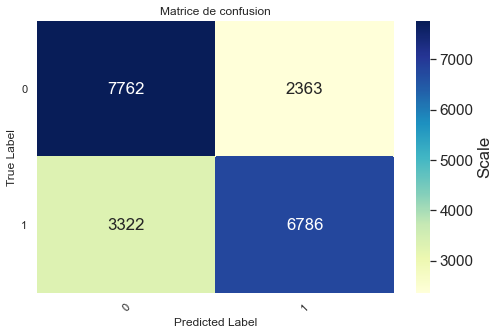

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.7154885008758547
Accuracy : 0.729
Classification Report
              precision    recall  f1-score   support

           0    0.70095   0.79822   0.74643     10125
           1    0.76525   0.65888   0.70810     10108

    accuracy                        0.72861     20233
   macro avg    0.73310   0.72855   0.72726     20233
weighted avg    0.73308   0.72861   0.72728     20233



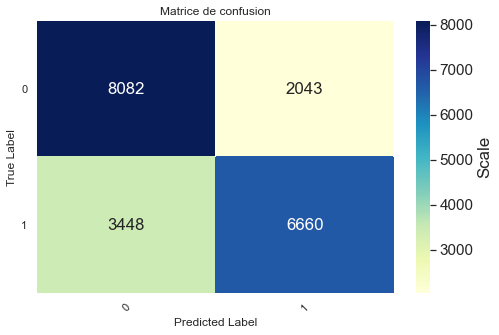

En utilisent text claims et author comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.7016493988678706
Accuracy : 0.711
Classification Report
              precision    recall  f1-score   support

           0    0.67952   0.80040   0.73502     10125
           1    0.75671   0.62188   0.68270     10108

    accuracy                        0.71121     20233
   macro avg    0.71812   0.71114   0.70886     20233
weighted avg    0.71809   0.71121   0.70889     20233



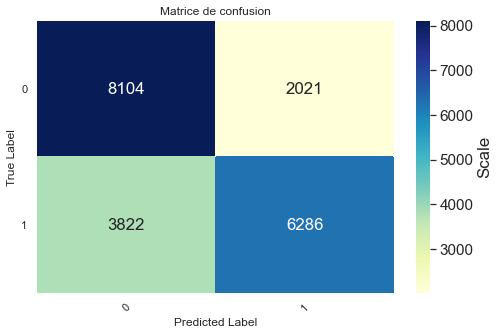

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7183726055263604
Accuracy : 0.724
Classification Report
              precision    recall  f1-score   support

           0    0.69515   0.79862   0.74330     10125
           1    0.76293   0.64919   0.70148     10108

    accuracy                        0.72397     20233
   macro avg    0.72904   0.72390   0.72239     20233
weighted avg    0.72901   0.72397   0.72241     20233



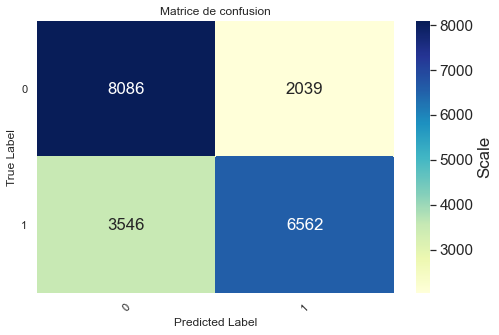

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7339420107761702
Accuracy : 0.743
Classification Report
              precision    recall  f1-score   support

           0    0.70806   0.82835   0.76350     10125
           1    0.79280   0.65789   0.71907     10108

    accuracy                        0.74319     20233
   macro avg    0.75043   0.74312   0.74129     20233
weighted avg    0.75040   0.74319   0.74130     20233



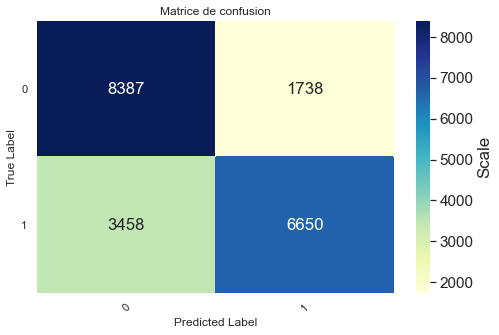

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.707991783253393
Accuracy : 0.729
Classification Report
              precision    recall  f1-score   support

           0    0.70998   0.77393   0.74057     10125
           1    0.75109   0.68332   0.71560     10108

    accuracy                        0.72866     20233
   macro avg    0.73053   0.72862   0.72809     20233
weighted avg    0.73051   0.72866   0.72810     20233



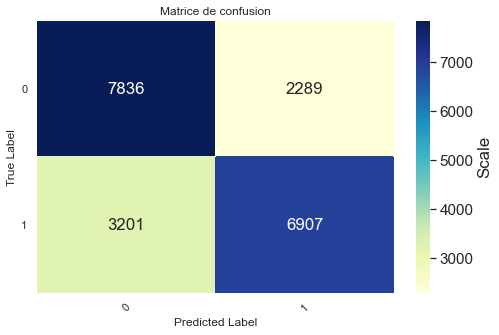

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.7299041711955166
Accuracy : 0.739
Classification Report
              precision    recall  f1-score   support

           0    0.71487   0.79684   0.75363     10125
           1    0.77009   0.68164   0.72317     10108

    accuracy                        0.73929     20233
   macro avg    0.74248   0.73924   0.73840     20233
weighted avg    0.74246   0.73929   0.73841     20233



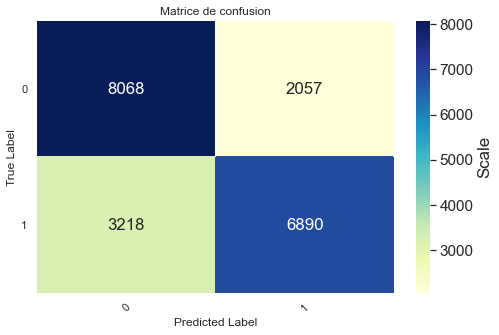

En utilisent text claims, headline et author comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.7146815844493417
Accuracy : 0.719
Classification Report
              precision    recall  f1-score   support

           0    0.69220   0.78894   0.73741     10125
           1    0.75417   0.64860   0.69741     10108

    accuracy                        0.71883     20233
   macro avg    0.72319   0.71877   0.71741     20233
weighted avg    0.72316   0.71883   0.71743     20233



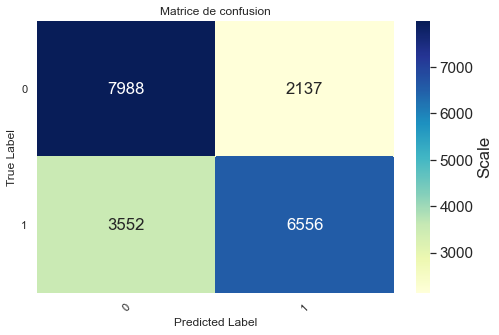

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7304813378139864
Accuracy : 0.736
Classification Report
              precision    recall  f1-score   support

           0    0.71032   0.79921   0.75215     10125
           1    0.77005   0.67353   0.71856     10108

    accuracy                        0.73642     20233
   macro avg    0.74019   0.73637   0.73535     20233
weighted avg    0.74016   0.73642   0.73537     20233



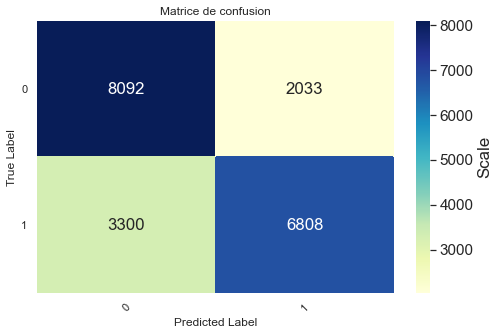

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7400537811327277
Accuracy : 0.751
Classification Report
              precision    recall  f1-score   support

           0    0.71684   0.83210   0.77018     10125
           1    0.79953   0.67076   0.72950     10108

    accuracy                        0.75150     20233
   macro avg    0.75818   0.75143   0.74984     20233
weighted avg    0.75815   0.75150   0.74986     20233



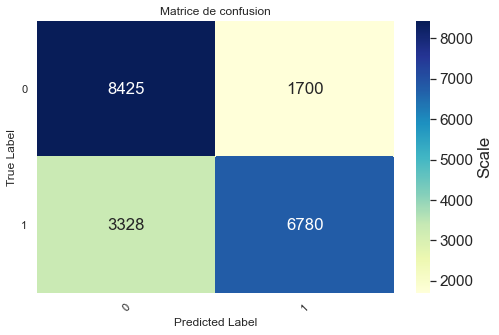

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.723792068446297
Accuracy : 0.747
Classification Report
              precision    recall  f1-score   support

           0    0.73257   0.78025   0.75566     10125
           1    0.76453   0.71468   0.73876     10108

    accuracy                        0.74749     20233
   macro avg    0.74855   0.74746   0.74721     20233
weighted avg    0.74853   0.74749   0.74722     20233



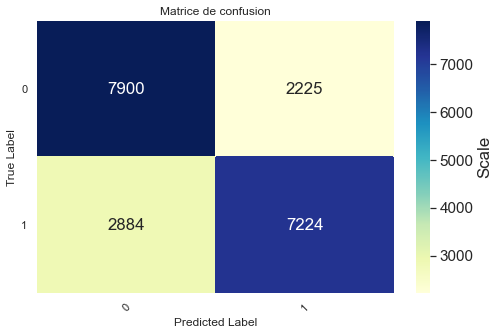

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.7417825553683077
Accuracy : 0.753
Classification Report
              precision    recall  f1-score   support

           0    0.72798   0.80830   0.76604     10125
           1    0.78412   0.69747   0.73826     10108

    accuracy                        0.75293     20233
   macro avg    0.75605   0.75288   0.75215     20233
weighted avg    0.75603   0.75293   0.75216     20233



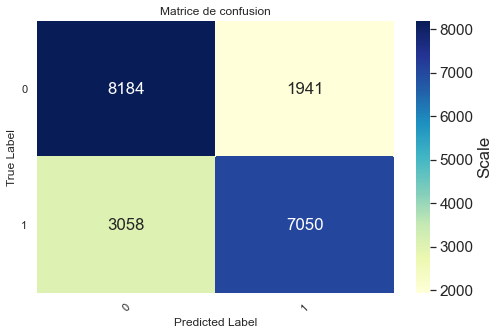

En utilisent text claims, headline, author et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.7126050420168066
Accuracy : 0.721
Classification Report
              precision    recall  f1-score   support

           0    0.67846   0.75217   0.71342      5762
           1    0.76617   0.69494   0.72882      6733

    accuracy                        0.72133     12495
   macro avg    0.72231   0.72355   0.72112     12495
weighted avg    0.72572   0.72133   0.72171     12495



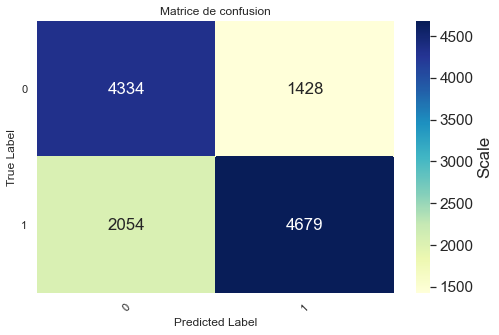

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7337068160597573
Accuracy : 0.746
Classification Report
              precision    recall  f1-score   support

           0    0.70452   0.77421   0.73772      5762
           1    0.78890   0.72211   0.75403      6733

    accuracy                        0.74614     12495
   macro avg    0.74671   0.74816   0.74588     12495
weighted avg    0.74999   0.74614   0.74651     12495



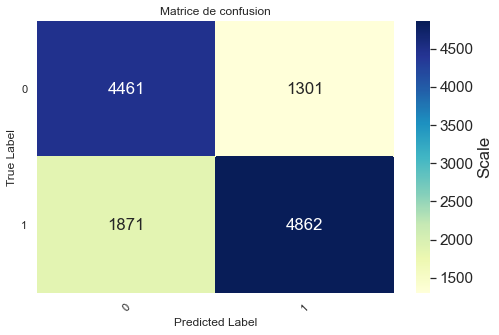

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.746031746031746
Accuracy : 0.760
Classification Report
              precision    recall  f1-score   support

           0    0.72617   0.77091   0.74787      5762
           1    0.79304   0.75123   0.77157      6733

    accuracy                        0.76030     12495
   macro avg    0.75961   0.76107   0.75972     12495
weighted avg    0.76220   0.76030   0.76064     12495



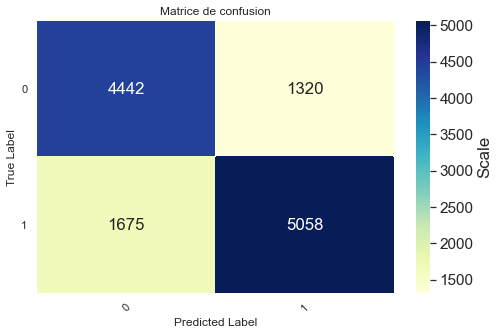

Alogrithm: logisticRegression
best params: {'clf__C': 2000, 'clf__tol': 0.001}
best scores: 0.7297852474323063
Accuracy : 0.754
Classification Report
              precision    recall  f1-score   support

           0    0.71509   0.77577   0.74419      5762
           1    0.79308   0.73548   0.76320      6733

    accuracy                        0.75406     12495
   macro avg    0.75408   0.75563   0.75370     12495
weighted avg    0.75711   0.75406   0.75443     12495



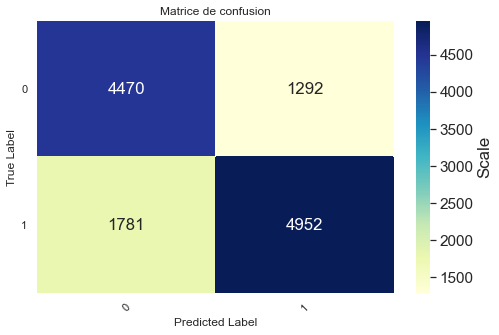

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.7432306255835668
Accuracy : 0.756
Classification Report
              precision    recall  f1-score   support

           0    0.72190   0.76675   0.74365      5762
           1    0.78918   0.74722   0.76762      6733

    accuracy                        0.75622     12495
   macro avg    0.75554   0.75698   0.75563     12495
weighted avg    0.75815   0.75622   0.75657     12495



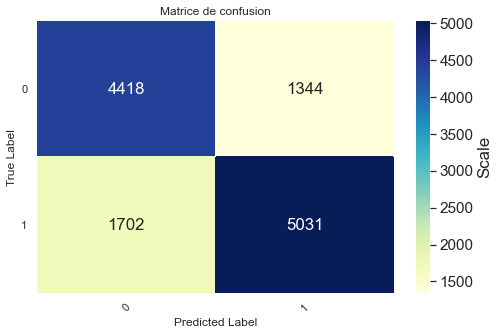

En utilisent text claims, headline, author,keywords et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.727579365079365
Accuracy : 0.729
Classification Report
              precision    recall  f1-score   support

           0    0.68906   0.77800   0.73083      5563
           1    0.77459   0.68485   0.72696      6197

    accuracy                        0.72891     11760
   macro avg    0.73183   0.73142   0.72890     11760
weighted avg    0.73413   0.72891   0.72879     11760



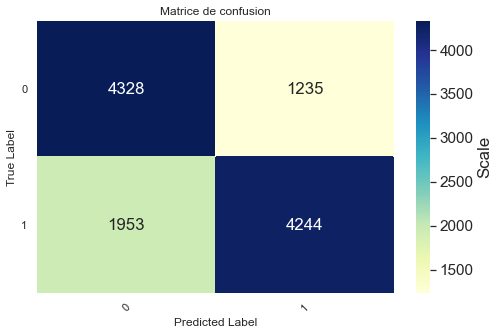

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7509920634920635
Accuracy : 0.749
Classification Report
              precision    recall  f1-score   support

           0    0.71092   0.79220   0.74936      5563
           1    0.79212   0.71083   0.74928      6197

    accuracy                        0.74932     11760
   macro avg    0.75152   0.75151   0.74932     11760
weighted avg    0.75371   0.74932   0.74932     11760



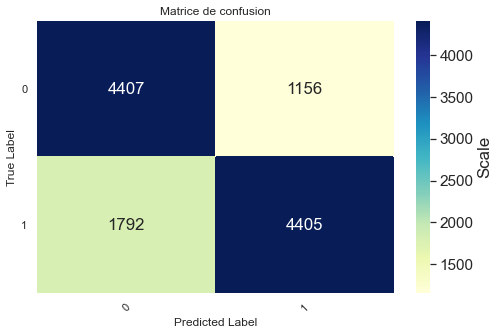

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7511904761904762
Accuracy : 0.757
Classification Report
              precision    recall  f1-score   support

           0    0.71148   0.81916   0.76153      5563
           1    0.81214   0.70179   0.75294      6197

    accuracy                        0.75731     11760
   macro avg    0.76181   0.76048   0.75724     11760
weighted avg    0.76452   0.75731   0.75701     11760



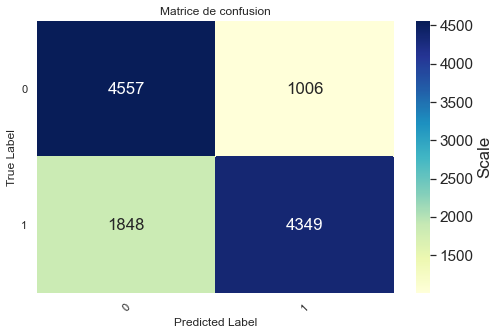

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.7525793650793651
Accuracy : 0.759
Classification Report
              precision    recall  f1-score   support

           0    0.72944   0.78123   0.75445      5563
           1    0.79024   0.73987   0.76423      6197

    accuracy                        0.75944     11760
   macro avg    0.75984   0.76055   0.75934     11760
weighted avg    0.76148   0.75944   0.75960     11760



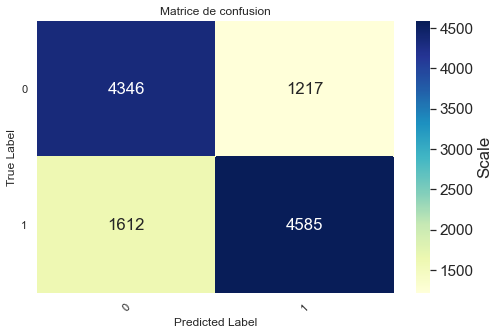

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.7531746031746032
Accuracy : 0.758
Classification Report
              precision    recall  f1-score   support

           0    0.72015   0.79795   0.75706      5563
           1    0.79914   0.72164   0.75842      6197

    accuracy                        0.75774     11760
   macro avg    0.75965   0.75980   0.75774     11760
weighted avg    0.76178   0.75774   0.75777     11760



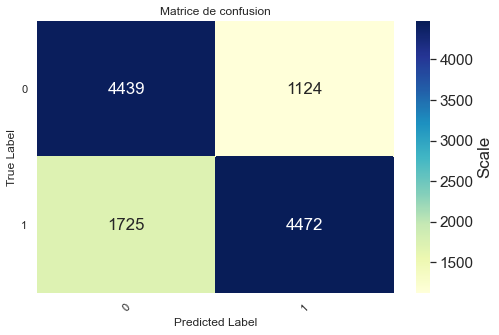

En utilisent text claims, source, headline, author, keywords et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.7283730158730158
Accuracy : 0.729
Classification Report
              precision    recall  f1-score   support

           0    0.68824   0.77980   0.73116      5563
           1    0.77552   0.68291   0.72627      6197

    accuracy                        0.72874     11760
   macro avg    0.73188   0.73135   0.72872     11760
weighted avg    0.73423   0.72874   0.72859     11760



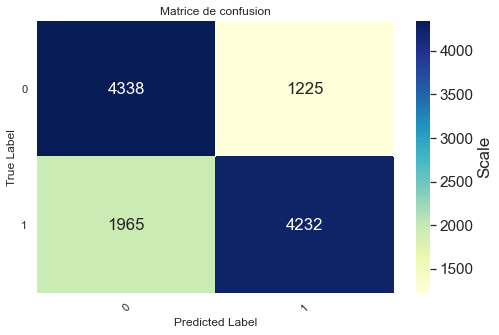

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7549603174603174
Accuracy : 0.752
Classification Report
              precision    recall  f1-score   support

           0    0.71463   0.79094   0.75085      5563
           1    0.79243   0.71648   0.75254      6197

    accuracy                        0.75170     11760
   macro avg    0.75353   0.75371   0.75170     11760
weighted avg    0.75563   0.75170   0.75174     11760



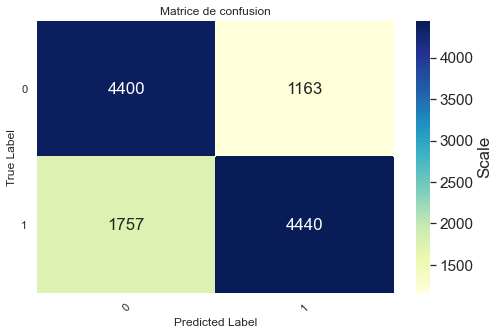

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7515873015873016
Accuracy : 0.752
Classification Report
              precision    recall  f1-score   support

           0    0.70134   0.83031   0.76039      5563
           1    0.81755   0.68259   0.74400      6197

    accuracy                        0.75247     11760
   macro avg    0.75944   0.75645   0.75219     11760
weighted avg    0.76258   0.75247   0.75175     11760



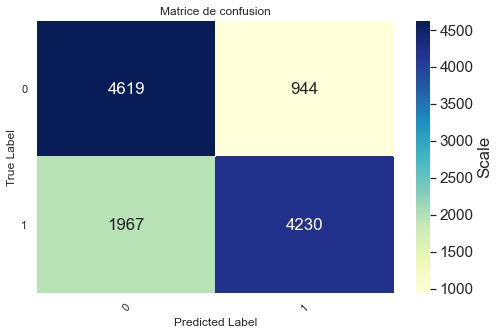

Alogrithm: logisticRegression
best params: {'clf__C': 2000, 'clf__tol': 0.001}
best scores: 0.7531746031746032
Accuracy : 0.760
Classification Report
              precision    recall  f1-score   support

           0    0.73005   0.78267   0.75544      5563
           1    0.79141   0.74020   0.76495      6197

    accuracy                        0.76029     11760
   macro avg    0.76073   0.76143   0.76019     11760
weighted avg    0.76238   0.76029   0.76045     11760



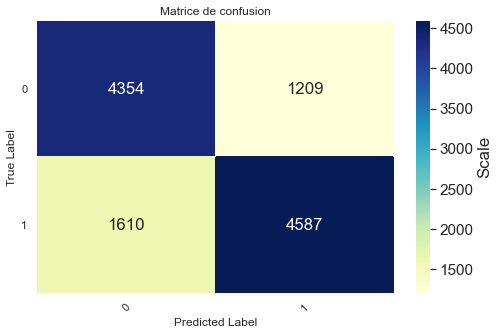

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.7559523809523809
Accuracy : 0.760
Classification Report
              precision    recall  f1-score   support

           0    0.72028   0.80496   0.76027      5563
           1    0.80426   0.71938   0.75945      6197

    accuracy                        0.75986     11760
   macro avg    0.76227   0.76217   0.75986     11760
weighted avg    0.76453   0.75986   0.75984     11760



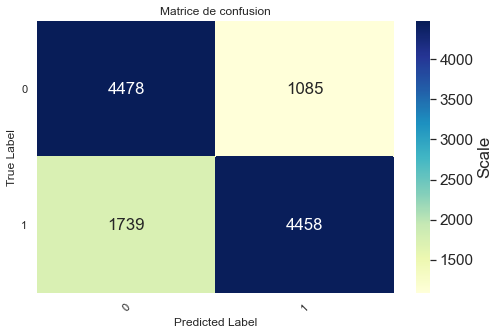

En utilisent text claims, headline, author,keywords,named_entities_claim et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.729657477025898
Accuracy : 0.734
Classification Report
              precision    recall  f1-score   support

           0    0.69584   0.77904   0.73509      5562
           1    0.77776   0.69427   0.73365      6195

    accuracy                        0.73437     11757
   macro avg    0.73680   0.73665   0.73437     11757
weighted avg    0.73900   0.73437   0.73433     11757



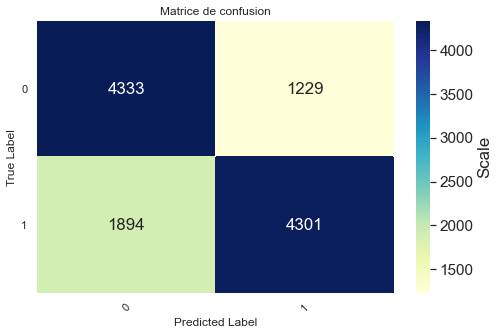

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7685552324206743
Accuracy : 0.758
Classification Report
              precision    recall  f1-score   support

           0    0.71665   0.80942   0.76022      5562
           1    0.80639   0.71267   0.75664      6195

    accuracy                        0.75844     11757
   macro avg    0.76152   0.76105   0.75843     11757
weighted avg    0.76394   0.75844   0.75833     11757



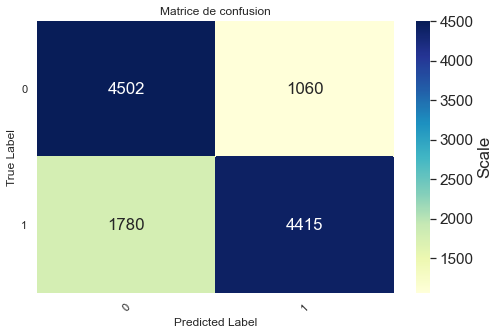

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.7622064201383963
Accuracy : 0.766
Classification Report
              precision    recall  f1-score   support

           0    0.72180   0.82147   0.76842      5562
           1    0.81703   0.71574   0.76304      6195

    accuracy                        0.76576     11757
   macro avg    0.76941   0.76860   0.76573     11757
weighted avg    0.77198   0.76576   0.76558     11757



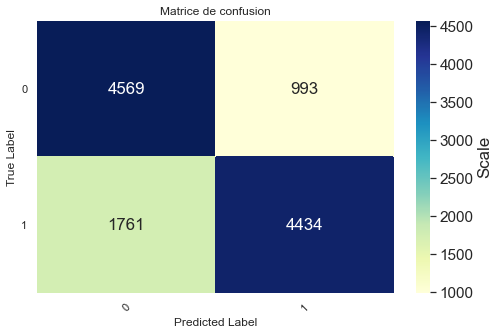

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.756452451884428
Accuracy : 0.765
Classification Report
              precision    recall  f1-score   support

           0    0.73686   0.78137   0.75846      5562
           1    0.79246   0.74948   0.77037      6195

    accuracy                        0.76457     11757
   macro avg    0.76466   0.76542   0.76442     11757
weighted avg    0.76615   0.76457   0.76474     11757



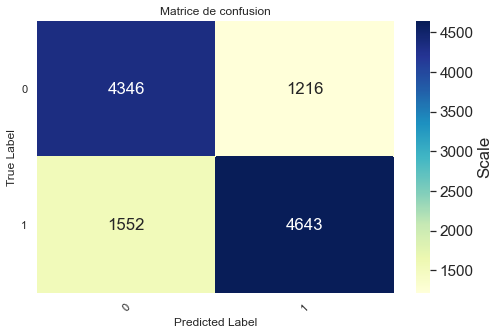

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.7574443183430274
Accuracy : 0.763
Classification Report
              precision    recall  f1-score   support

           0    0.72379   0.80798   0.76357      5562
           1    0.80750   0.72316   0.76301      6195

    accuracy                        0.76329     11757
   macro avg    0.76564   0.76557   0.76329     11757
weighted avg    0.76790   0.76329   0.76327     11757



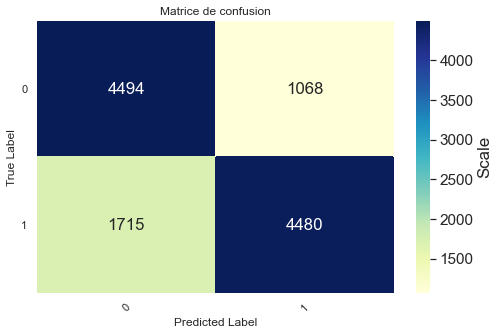

In [19]:
text_normalizer = TextNormalizer()
overBestScoredAlgo = []
print("En utilisent text claims comme jeu de donnée")
features = np.array(["text"])
score = classification_avec_pretraitement(features,text_normalizer,dfVF_M_over)
overBestScoredAlgo.append(score)
print("En utilisent source et text claims comme jeu de donnée")
features = np.array(["source","text"])
score = classification_avec_pretraitement(features,text_normalizer,dfVF_M_over)
overBestScoredAlgo.append(score)
print("En utilisent text claims et author comme jeu de donnée")
features = np.array(["text","author"])
score = classification_avec_pretraitement(features,text_normalizer,dfVF_M_over)
overBestScoredAlgo.append(score)
print("En utilisent text claims, headline et author comme jeu de donnée")
features = np.array(["text","headline","author"])
score = classification_avec_pretraitement(features,text_normalizer,dfVF_M_over)
overBestScoredAlgo.append(score)
print("En utilisent text claims, headline, author et named_entities_article comme jeu de donnée")
dfn=dfVF_M_over.copy()
features = np.array(["text","headline","author","named_entities_article"])
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)
score=classification_avec_pretraitement(features,text_normalizer,dfn)
overBestScoredAlgo.append(score)
print("En utilisent text claims, headline, author,keywords et named_entities_article comme jeu de donnée")
features = np.array(["text","headline","author","named_entities_article","keywords"])
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
score=classification_avec_pretraitement(features,text_normalizer,dfn)
overBestScoredAlgo.append(score)
print("En utilisent text claims, source, headline, author, keywords et named_entities_article comme jeu de donnée")
features = np.array(["text","source","headline","author","named_entities_article","keywords"])
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
score=classification_avec_pretraitement(features,text_normalizer,dfn)
overBestScoredAlgo.append(score)
print("En utilisent text claims, headline, author,keywords,named_entities_claim et named_entities_article comme jeu de donnée")
dfn['named_entities_claim'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['named_entities_claim'], inplace=True)
features = np.array(["text","headline","author","named_entities_article","keywords","named_entities_claim"])
score=classification_avec_pretraitement(features,text_normalizer,dfn)
overBestScoredAlgo.append(score)

In [21]:
overBestScoredAlgo.sort(key=lambda x: x[3],reverse=True)
print("Meilleur score "+str(overBestScoredAlgo[0][3]))
print("tri de meilleur score et meilleur algorithme de chaque features")
for i in range(len(overBestScoredAlgo)):
    print("Features :"+str(overBestScoredAlgo[i][0]))
    print("Meilleur Score :"+str(overBestScoredAlgo[i][3]))
    print("Meilleur Algorithm :"+str(overBestScoredAlgo[i][2]))
    print("Meilleur Parametre :"+str(overBestScoredAlgo[i][4]))
    print("-------------------------")

Meilleur score 0.7685552324206743
tri de meilleur score et meilleur algorithme de chaque features
Features :['text' 'headline' 'author' 'named_entities_article' 'keywords'
 'named_entities_claim']
Meilleur Score :0.7685552324206743
Meilleur Algorithm :GBC
Meilleur Parametre :{'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
-------------------------
Features :['text' 'source' 'headline' 'author' 'named_entities_article' 'keywords']
Meilleur Score :0.7559523809523809
Meilleur Algorithm :SVM
Meilleur Parametre :{'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
-------------------------
Features :['text' 'headline' 'author' 'named_entities_article' 'keywords']
Meilleur Score :0.7531746031746032
Meilleur Algorithm :SVM
Meilleur Parametre :{'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
-------------------------
Features :['text' 'headline' 'author' 'named_entities_article']
Meilleur Score :0.746

##### Nous remarquons aprés avoir fait le over sampling que le comportement des algorithmes a changer ainsi que leurs scores, l'algorithm SVC et RFC nous ont donner les meilleurs scores pour tous les features. 

### Application de l'algorithm RFC en utilisent le meilleur prétraitement et les meilleurs features

En utilisent 'text','source','headline','author','named_entities_article','keywords' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7880952380952381
Accuracy : 0.797
Classification Report
              precision    recall  f1-score   support

           0    0.74028   0.87553   0.80224      2370
           1    0.86813   0.72734   0.79152      2670

    accuracy                        0.79702      5040
   macro avg    0.80420   0.80143   0.79688      5040
weighted avg    0.80801   0.79702   0.79656      5040



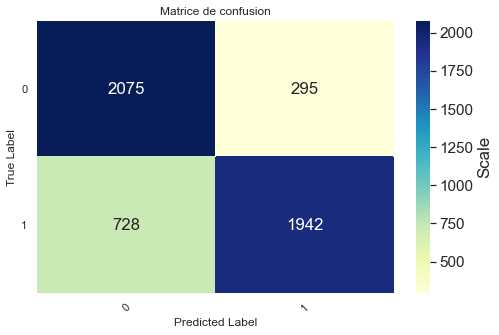

En utilisent 'text','headline','author','named_entities_article','keywords' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7920068027210884
Accuracy : 0.803
Classification Report
              precision    recall  f1-score   support

           0    0.74991   0.87173   0.80624      2370
           1    0.86696   0.74195   0.79960      2670

    accuracy                        0.80298      5040
   macro avg    0.80843   0.80684   0.80292      5040
weighted avg    0.81192   0.80298   0.80272      5040



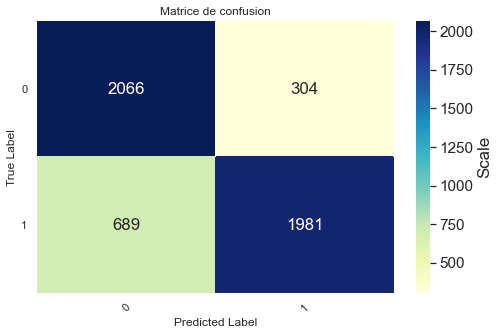

En utilisent 'text','headline','author','named_entities_article' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7989595838335334
Accuracy : 0.814
Classification Report
              precision    recall  f1-score   support

           0    0.76423   0.85644   0.80771      2445
           1    0.86577   0.77801   0.81955      2910

    accuracy                        0.81382      5355
   macro avg    0.81500   0.81722   0.81363      5355
weighted avg    0.81941   0.81382   0.81414      5355



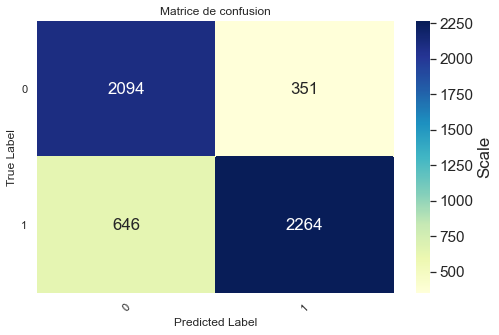

In [23]:
text_normalizer = TextNormalizer(removestopwords=True, # suppression des stopwords
                 lowercase=True,# passage en minuscule
                 removedigit=False, # supprimer les nombres 
                 transformdigit=False, # transforamation des chiffre en lettres
                 getstemmer=False,# racinisation des termes 
                 getlemmatisation=True, # lemmatisation des termes 
                 remove_non_ascii=False # supprimer les caractéres non ascii
                 )
parameters = {'clf__n_estimators':[200], 'clf__criterion':['gini'],'clf__min_samples_split':[2],
                        'clf__min_samples_leaf': [2]}


clf = RandomForestClassifier()
print("En utilisent 'text','source','headline','author','named_entities_article','keywords' comme jeu de donnée")
features = np.array(['text','source','headline','author','named_entities_article','keywords'])
dfn=dfVF_M_over.copy()
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn)

print("En utilisent 'text','headline','author','named_entities_article','keywords' comme jeu de donnée")
features = np.array(['text','headline','author','named_entities_article','keywords'])
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn)

dfn_article=dfVF_M_over.copy()
dfn_article['named_entities_article'].replace('', np.nan, inplace=True)
dfn_article.dropna(subset=['named_entities_article'], inplace=True)

print("En utilisent 'text','headline','author','named_entities_article' comme jeu de donnée")
features = np.array(['text','headline','author','named_entities_article'])
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn_article)

### Application de l'algorithm SVM en utilisent le meilleur prétraitement et les meilleurs features


En utilisent 'text','source','headline','author','named_entities_article','keywords' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7910714285714285
Accuracy : 0.790
Classification Report
              precision    recall  f1-score   support

           0    0.74727   0.83586   0.78909      2370
           1    0.83717   0.74906   0.79067      2670

    accuracy                        0.78988      5040
   macro avg    0.79222   0.79246   0.78988      5040
weighted avg    0.79489   0.78988   0.78993      5040



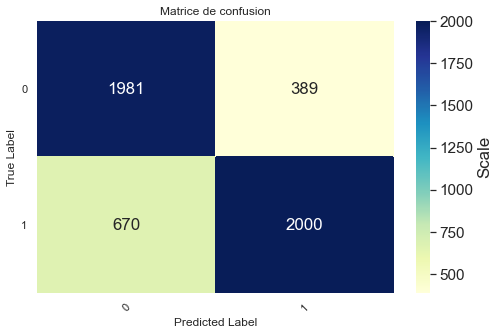

En utilisent 'text','headline','author','named_entities_article','keywords' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7906462585034013
Accuracy : 0.788
Classification Report
              precision    recall  f1-score   support

           0    0.74687   0.83038   0.78641      2370
           1    0.83285   0.75019   0.78936      2670

    accuracy                        0.78790      5040
   macro avg    0.78986   0.79028   0.78789      5040
weighted avg    0.79242   0.78790   0.78797      5040



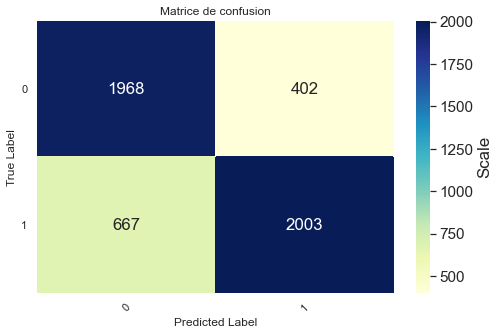

En utilisent 'text','headline','author','named_entities_article' comme jeu de donnée
Enlever les valeurs nulle des features
Meilleur résultat : 0.7795118047218887
Accuracy : 0.797
Classification Report
              precision    recall  f1-score   support

           0    0.75251   0.82699   0.78800      2445
           1    0.84145   0.77148   0.80495      2910

    accuracy                        0.79683      5355
   macro avg    0.79698   0.79924   0.79647      5355
weighted avg    0.80084   0.79683   0.79721      5355



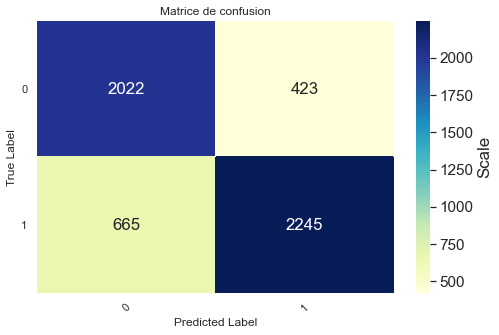

In [25]:
text_normalizer = TextNormalizer(removestopwords=True, # suppression des stopwords
                 lowercase=True,# passage en minuscule
                 removedigit=False, # supprimer les nombres 
                 transformdigit=False, # transforamation des chiffre en lettres
                 getstemmer=False,# racinisation des termes 
                 getlemmatisation=True, # lemmatisation des termes 
                 remove_non_ascii=False # supprimer les caractéres non ascii
                 )
parameters ={'clf__C': [1], 'clf__gamma': [1], 'clf__kernel': ['linear']}


clf = SVC()
print("En utilisent 'text','source','headline','author','named_entities_article','keywords' comme jeu de donnée")
features = np.array(['text','source','headline','author','named_entities_article','keywords'])
dfn=dfVF_M_over.copy()
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn)

print("En utilisent 'text','headline','author','named_entities_article','keywords' comme jeu de donnée")
features = np.array(['text','headline','author','named_entities_article','keywords'])
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn)

dfn_article=dfVF_M_over.copy()
dfn_article['named_entities_article'].replace('', np.nan, inplace=True)
dfn_article.dropna(subset=['named_entities_article'], inplace=True)

print("En utilisent 'text','headline','author','named_entities_article' comme jeu de donnée")
features = np.array(['text','headline','author','named_entities_article'])
print("Enlever les valeurs nulle des features")
Classify(features,text_normalizer,clf,parameters,dfn_article)

##### Nous déduisons que Le meilleur equilibrage est Over sampling, le meilleur algorithme est RFC et le meilleur feature est 'text','headline','author','named_entities_article'

## Cross Validation du meilleur algorithm et meilleur feature

In [28]:


# selection des données
features = np.array(['text','headline','author','named_entities_article'])
X=dfn_article[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
y=dfn_article.truthRating
# Création d'un jeu d'apprentissage et de test
trainsize=0.7 # 70% pour le jeu d'apprentissage, il reste 30% du jeu de données pour le test
testsize= 0.3
seed=30
X_train,X_test,y_train,y_test=train_test_split(X, 
                                               y, 
                                               train_size=trainsize, 
                                               random_state=seed,
                                               test_size=testsize)

# création du pipeline en ajoutant le classifier
text_normalizer = TextNormalizer(removestopwords=True, # suppression des stopwords
                 lowercase=True,# passage en minuscule
                 removedigit=False, # supprimer les nombres 
                 transformdigit=False, # transforamation des chiffre en lettres
                 getstemmer=False,# racinisation des termes 
                 getlemmatisation=True, # lemmatisation des termes 
                 remove_non_ascii=False # supprimer les caractéres non ascii
                 )
pipe = Pipeline([("cleaner", text_normalizer),
                 ("count_vectorizer", TfidfVectorizer()),
                 ("RFC", RandomForestClassifier(
                 n_estimators=200, criterion='gini',min_samples_split=2,min_samples_leaf=2
                 ))])
pipe.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [29]:

seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)
scoring = 'accuracy'
print('Cross validation ...')
score = cross_val_score(pipe, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std()) 

Cross validation ...
Les différentes accuracy pour les 10 évaluations sont [0.84033613 0.83585434 0.82240896 0.84145658 0.8487395  0.82016807
 0.82913165 0.83641457 0.82072829 0.84369748] 

Accuracy moyenne :  0.8338935574229691  standard deviation 0.009704174448866175


# Tache 3 : VRAIS / FAUX / MIXTURE

En utilisent text claims comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.5471029311520109
Accuracy : 0.538
Classification Report
              precision    recall  f1-score   support

           1    0.52569   0.69339   0.59801      7009
           2    0.56095   0.60000   0.57982      7010
           3    0.39572   0.04777   0.08525      3098

    accuracy                        0.53830     17117
   macro avg    0.49412   0.44706   0.42103     17117
weighted avg    0.51661   0.53830   0.49775     17117



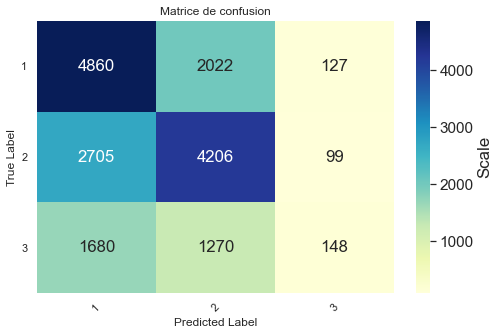

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.5419222903885481
Accuracy : 0.543
Classification Report
              precision    recall  f1-score   support

           1    0.55052   0.64603   0.59446      7009
           2    0.55970   0.63795   0.59627      7010
           3    0.32262   0.09393   0.14550      3098

    accuracy                        0.54279     17117
   macro avg    0.47761   0.45930   0.44541     17117
weighted avg    0.51303   0.54279   0.51394     17117



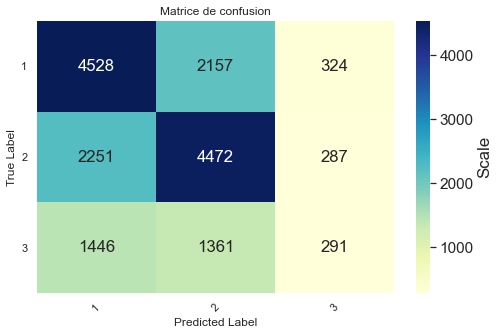

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.5706884798909339
Accuracy : 0.567
Classification Report
              precision    recall  f1-score   support

           1    0.57998   0.63889   0.60801      7009
           2    0.55629   0.73167   0.63204      7010
           3    0.56250   0.03196   0.06048      3098

    accuracy                        0.56704     17117
   macro avg    0.56626   0.46751   0.43351     17117
weighted avg    0.56711   0.56704   0.51875     17117



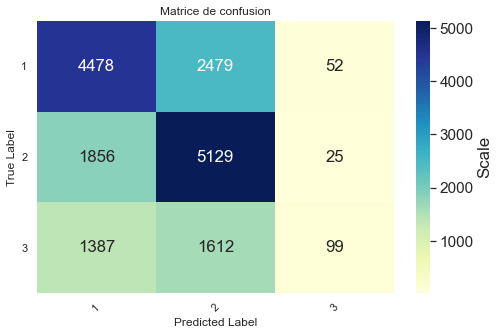

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.505521472392638
Accuracy : 0.493
Classification Report
              precision    recall  f1-score   support

           1    0.54219   0.55828   0.55012      7009
           2    0.52508   0.54365   0.53420      7010
           3    0.27101   0.23112   0.24948      3098

    accuracy                        0.49308     17117
   macro avg    0.44609   0.44435   0.44460     17117
weighted avg    0.48610   0.49308   0.48919     17117



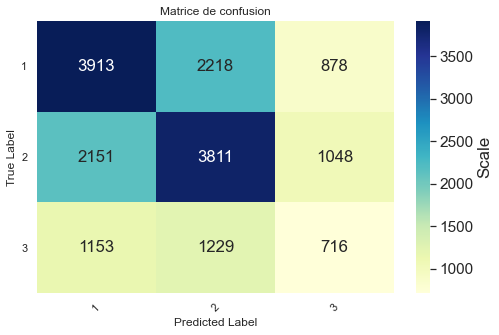

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.5710974778459441
Accuracy : 0.565
Classification Report
              precision    recall  f1-score   support

           1    0.57801   0.64275   0.60866      7009
           2    0.56449   0.69929   0.62470      7010
           3    0.40532   0.08360   0.13861      3098

    accuracy                        0.56470     17117
   macro avg    0.51594   0.47521   0.45732     17117
weighted avg    0.54122   0.56470   0.53015     17117



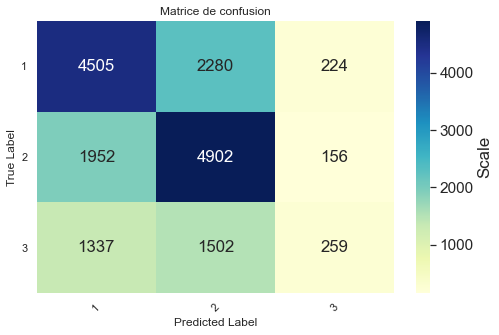

En utilisent source et text claims comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.5821404226312202
Accuracy : 0.571
Classification Report
              precision    recall  f1-score   support

           1    0.60321   0.57826   0.59047      7009
           2    0.55955   0.79358   0.65632      7010
           3    0.36404   0.05358   0.09342      3098

    accuracy                        0.57148     17117
   macro avg    0.50893   0.47514   0.44674     17117
weighted avg    0.54204   0.57148   0.52748     17117



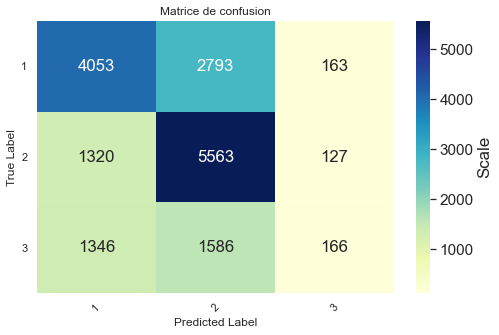

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.5740967961826857
Accuracy : 0.570
Classification Report
              precision    recall  f1-score   support

           1    0.59390   0.60322   0.59853      7009
           2    0.56603   0.75635   0.64749      7010
           3    0.36292   0.07392   0.12282      3098

    accuracy                        0.57013     17117
   macro avg    0.50762   0.47783   0.45628     17117
weighted avg    0.54068   0.57013   0.53248     17117



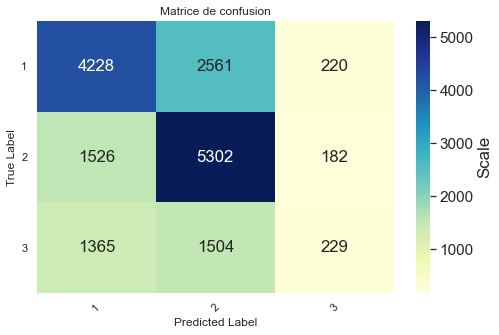

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.596319018404908
Accuracy : 0.589
Classification Report
              precision    recall  f1-score   support

           1    0.61040   0.62833   0.61924      7009
           2    0.57216   0.79458   0.66527      7010
           3    0.61078   0.03292   0.06248      3098

    accuracy                        0.58865     17117
   macro avg    0.59778   0.48528   0.44900     17117
weighted avg    0.59481   0.58865   0.53732     17117



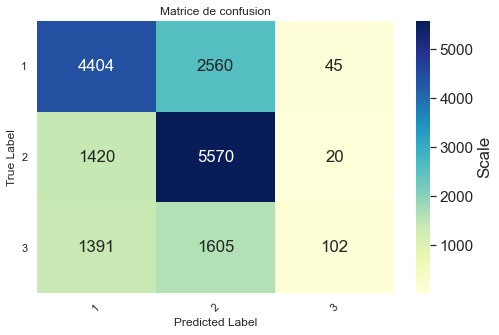

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.5179277436946149
Accuracy : 0.501
Classification Report
              precision    recall  f1-score   support

           1    0.54869   0.56513   0.55679      7009
           2    0.53610   0.55292   0.54438      7010
           3    0.27474   0.23660   0.25425      3098

    accuracy                        0.50067     17117
   macro avg    0.45318   0.45155   0.45181     17117
weighted avg    0.49395   0.50067   0.49695     17117



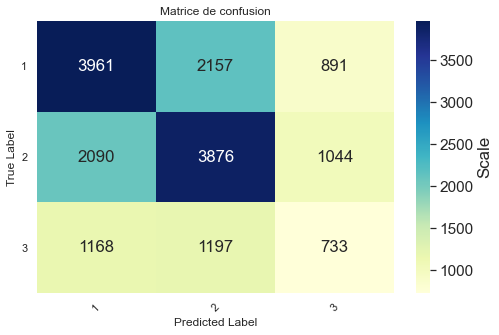

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.5959100204498977
Accuracy : 0.584
Classification Report
              precision    recall  f1-score   support

           1    0.60590   0.62976   0.61760      7009
           2    0.57750   0.75635   0.65493      7010
           3    0.42704   0.08974   0.14831      3098

    accuracy                        0.58386     17117
   macro avg    0.53681   0.49195   0.47361     17117
weighted avg    0.56190   0.58386   0.54795     17117



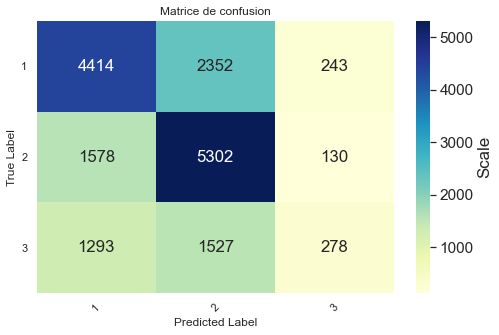

En utilisent text claims et author comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.5942740286298569
Accuracy : 0.593
Classification Report
              precision    recall  f1-score   support

           1    0.61788   0.65173   0.63436      7009
           2    0.58558   0.77989   0.66891      7010
           3    0.31186   0.03906   0.06942      3098

    accuracy                        0.59333     17117
   macro avg    0.50511   0.49023   0.45756     17117
weighted avg    0.54927   0.59333   0.54626     17117



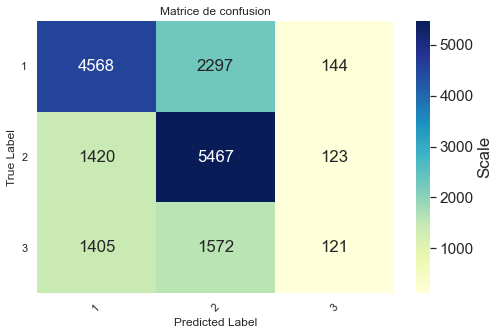

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.5923653715064758
Accuracy : 0.593
Classification Report
              precision    recall  f1-score   support

           1    0.62055   0.65402   0.63684      7009
           2    0.59011   0.76134   0.66488      7010
           3    0.34111   0.07553   0.12368      3098

    accuracy                        0.59327     17117
   macro avg    0.51726   0.49696   0.47513     17117
weighted avg    0.55751   0.59327   0.55545     17117



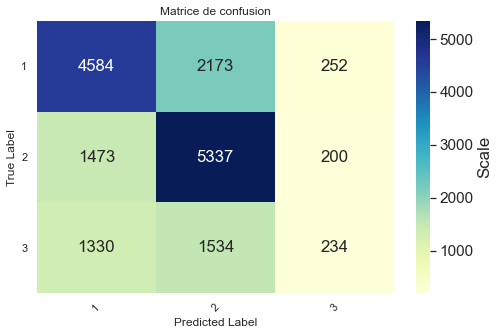

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6088616223585548
Accuracy : 0.603
Classification Report
              precision    recall  f1-score   support

           1    0.62515   0.66957   0.64660      7009
           2    0.58586   0.78845   0.67222      7010
           3    0.59091   0.03357   0.06353      3098

    accuracy                        0.60314     17117
   macro avg    0.60064   0.49719   0.46078     17117
weighted avg    0.60286   0.60314   0.55156     17117



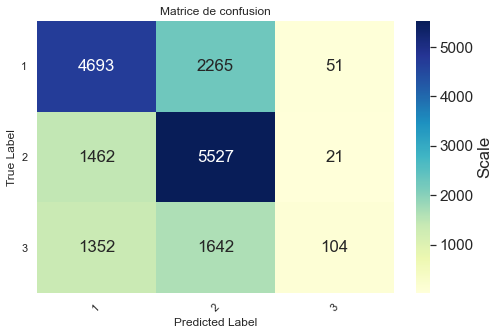

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.5246080436264485
Accuracy : 0.520
Classification Report
              precision    recall  f1-score   support

           1    0.56841   0.60993   0.58844      7009
           2    0.55601   0.55720   0.55661      7010
           3    0.28277   0.23467   0.25648      3098

    accuracy                        0.52042     17117
   macro avg    0.46906   0.46727   0.46718     17117
weighted avg    0.51163   0.52042   0.51532     17117



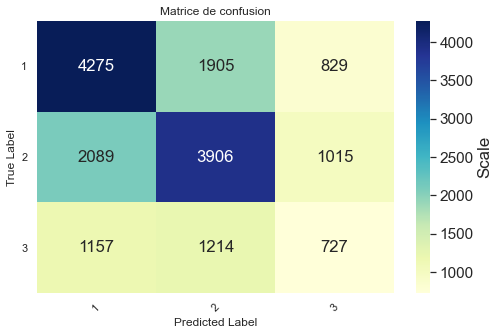

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6059986366734833
Accuracy : 0.600
Classification Report
              precision    recall  f1-score   support

           1    0.61984   0.67670   0.64702      7009
           2    0.59508   0.74907   0.66326      7010
           3    0.43214   0.08941   0.14817      3098

    accuracy                        0.60005     17117
   macro avg    0.54902   0.50506   0.48615     17117
weighted avg    0.57573   0.60005   0.56338     17117



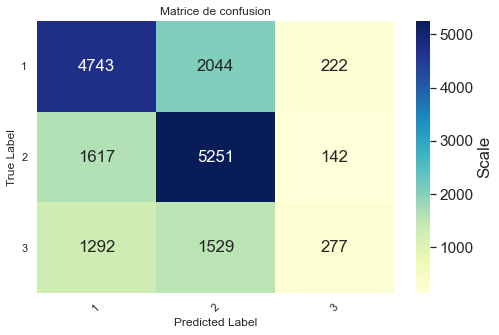

En utilisent text claims, headline et author comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.6096796182685753
Accuracy : 0.610
Classification Report
              precision    recall  f1-score   support

           1    0.63714   0.67014   0.65322      7009
           2    0.59439   0.78916   0.67807      7010
           3    0.47489   0.06714   0.11765      3098

    accuracy                        0.60974     17117
   macro avg    0.56881   0.50881   0.48298     17117
weighted avg    0.59027   0.60974   0.56646     17117



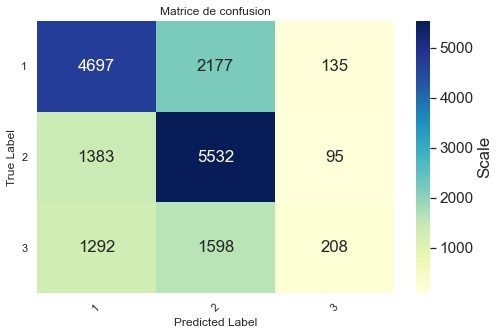

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.6117246080436265
Accuracy : 0.613
Classification Report
              precision    recall  f1-score   support

           1    0.63790   0.69496   0.66521      7009
           2    0.60748   0.75307   0.67248      7010
           3    0.44248   0.11298   0.17999      3098

    accuracy                        0.61343     17117
   macro avg    0.56262   0.52034   0.50590     17117
weighted avg    0.59007   0.61343   0.58037     17117



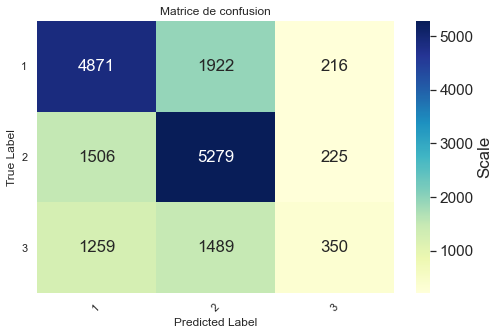

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6188139059304703
Accuracy : 0.615
Classification Report
              precision    recall  f1-score   support

           1    0.63438   0.69339   0.66258      7009
           2    0.59582   0.78502   0.67746      7010
           3    0.71818   0.05100   0.09524      3098

    accuracy                        0.61465     17117
   macro avg    0.64946   0.50981   0.47842     17117
weighted avg    0.63376   0.61465   0.56599     17117



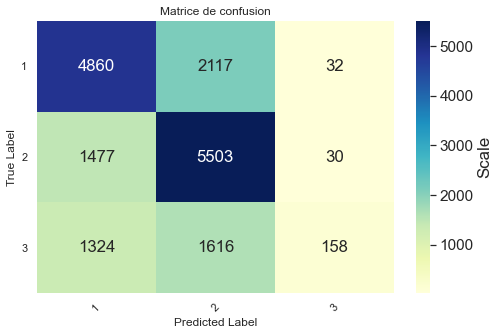

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.5434219495569189
Accuracy : 0.544
Classification Report
              precision    recall  f1-score   support

           1    0.58628   0.62819   0.60652      7009
           2    0.58577   0.58602   0.58589      7010
           3    0.30840   0.25823   0.28110      3098

    accuracy                        0.54396     17117
   macro avg    0.49349   0.49081   0.49117     17117
weighted avg    0.53578   0.54396   0.53917     17117



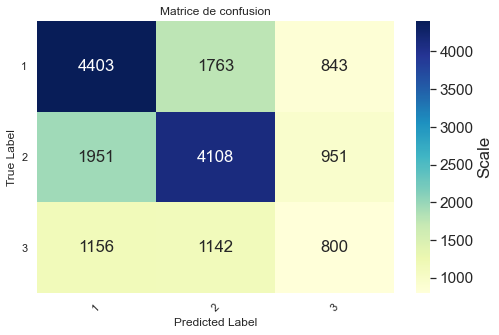

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6134969325153374
Accuracy : 0.611
Classification Report
              precision    recall  f1-score   support

           1    0.62635   0.70267   0.66232      7009
           2    0.60841   0.74094   0.66817      7010
           3    0.46862   0.10846   0.17615      3098

    accuracy                        0.61080     17117
   macro avg    0.56779   0.51736   0.50221     17117
weighted avg    0.59046   0.61080   0.57672     17117



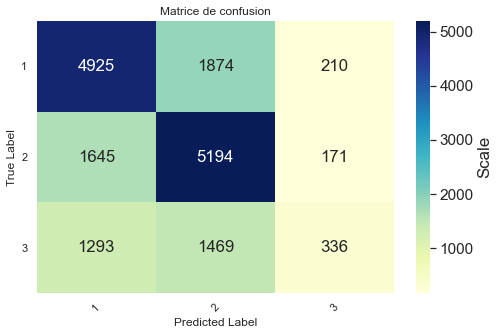

En utilisent text claims, headline, author et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.6077817117499882
Accuracy : 0.610
Classification Report
              precision    recall  f1-score   support

           1    0.64188   0.71563   0.67676      4874
           2    0.58818   0.72386   0.64900      4027
           3    0.40805   0.07730   0.12998      1837

    accuracy                        0.60952     10738
   macro avg    0.54604   0.50560   0.48525     10738
weighted avg    0.58174   0.60952   0.57281     10738



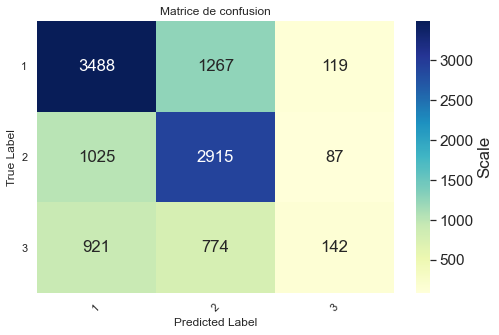

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.6123452768729643
Accuracy : 0.611
Classification Report
              precision    recall  f1-score   support

           1    0.64386   0.72589   0.68242      4874
           2    0.60107   0.69481   0.64455      4027
           3    0.37585   0.12030   0.18227      1837

    accuracy                        0.61064     10738
   macro avg    0.54026   0.51367   0.50308     10738
weighted avg    0.58196   0.61064   0.58265     10738



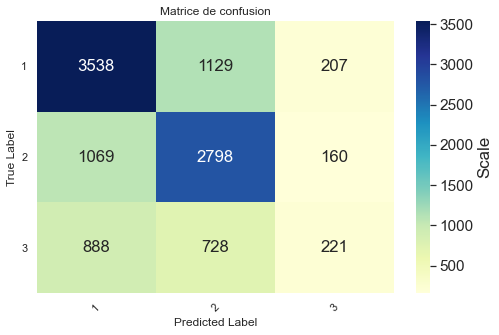

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6201706557144882
Accuracy : 0.624
Classification Report
              precision    recall  f1-score   support

           1    0.64530   0.75400   0.69543      4874
           2    0.59708   0.73082   0.65721      4027
           3    0.70175   0.04355   0.08201      1837

    accuracy                        0.62377     10738
   macro avg    0.64805   0.50946   0.47822     10738
weighted avg    0.63688   0.62377   0.57616     10738



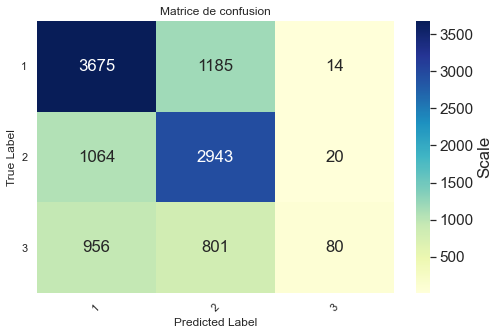

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.5560647689184723
Accuracy : 0.554
Classification Report
              precision    recall  f1-score   support

           1    0.61217   0.66455   0.63728      4874
           2    0.56065   0.58306   0.57164      4027
           3    0.28912   0.19815   0.23514      1837

    accuracy                        0.55420     10738
   macro avg    0.48731   0.48192   0.48135     10738
weighted avg    0.53758   0.55420   0.54387     10738



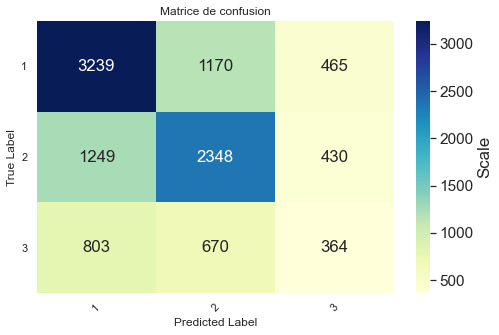

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6043041589954209
Accuracy : 0.608
Classification Report
              precision    recall  f1-score   support

           1    0.62776   0.74600   0.68179      4874
           2    0.59203   0.69009   0.63731      4027
           3    0.44444   0.06097   0.10723      1837

    accuracy                        0.60784     10738
   macro avg    0.55475   0.49902   0.47544     10738
weighted avg    0.58300   0.60784   0.56682     10738



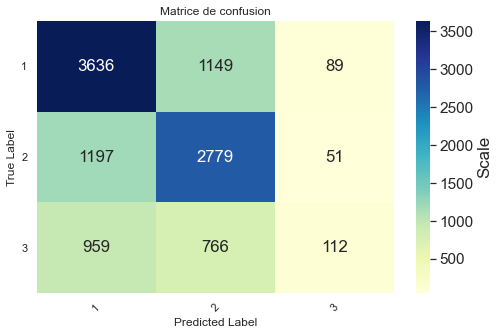

En utilisent text claims, headline, author,keywords et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.6053240740740741
Accuracy : 0.614
Classification Report
              precision    recall  f1-score   support

           1    0.66178   0.68599   0.67366      4538
           2    0.58406   0.77208   0.66504      3883
           3    0.30738   0.04518   0.07878      1660

    accuracy                        0.61363     10081
   macro avg    0.51774   0.50108   0.47250     10081
weighted avg    0.57349   0.61363   0.57239     10081



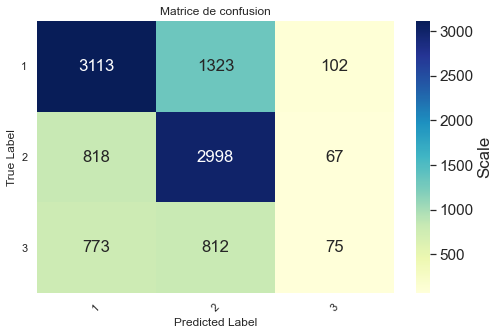

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.6085648148148148
Accuracy : 0.617
Classification Report
              precision    recall  f1-score   support

           1    0.66026   0.71133   0.68484      4538
           2    0.60124   0.72495   0.65733      3883
           3    0.34510   0.10602   0.16221      1660

    accuracy                        0.61690     10081
   macro avg    0.53553   0.51410   0.50146     10081
weighted avg    0.58563   0.61690   0.58818     10081



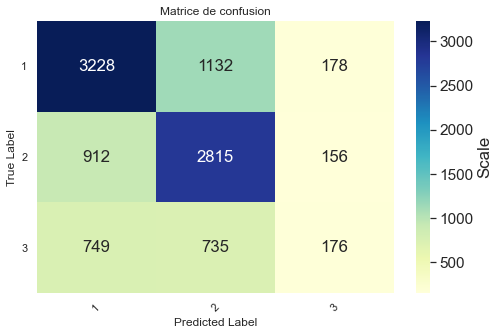

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6296296296296297
Accuracy : 0.625
Classification Report
              precision    recall  f1-score   support

           1    0.65605   0.72168   0.68730      4538
           2    0.59553   0.77620   0.67397      3883
           3    0.50000   0.00843   0.01659      1660

    accuracy                        0.62524     10081
   macro avg    0.58386   0.50211   0.45929     10081
weighted avg    0.60704   0.62524   0.57172     10081



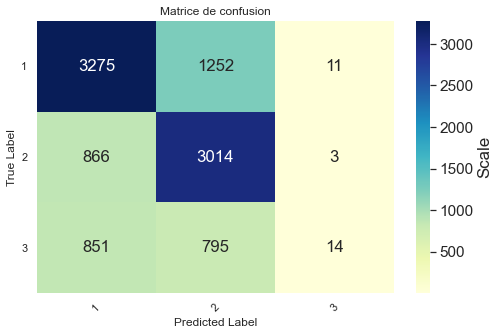

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.5717592592592593
Accuracy : 0.563
Classification Report
              precision    recall  f1-score   support

           1    0.61425   0.66285   0.63763      4538
           2    0.57987   0.60391   0.59165      3883
           3    0.28509   0.19578   0.23214      1660

    accuracy                        0.56324     10081
   macro avg    0.49307   0.48751   0.48714     10081
weighted avg    0.54681   0.56324   0.55315     10081



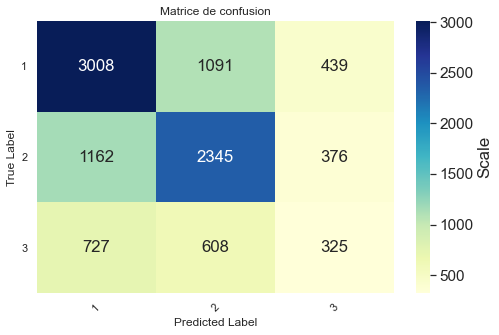

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6173611111111111
Accuracy : 0.616
Classification Report
              precision    recall  f1-score   support

           1    0.64731   0.70978   0.67711      4538
           2    0.59710   0.74118   0.66138      3883
           3    0.40000   0.06867   0.11722      1660

    accuracy                        0.61631     10081
   macro avg    0.54813   0.50655   0.48524     10081
weighted avg    0.58724   0.61631   0.57886     10081



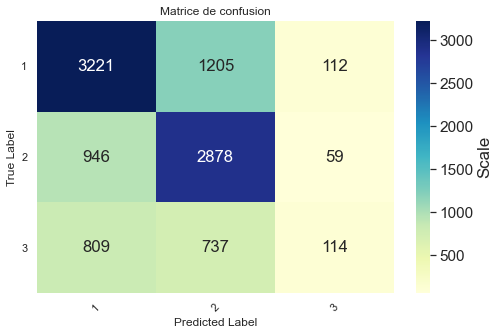

En utilisent text claims, source, headline, author, keywords et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.6069444444444445
Accuracy : 0.614
Classification Report
              precision    recall  f1-score   support

           1    0.65798   0.68973   0.67348      4538
           2    0.58728   0.77028   0.66644      3883
           3    0.31169   0.04337   0.07615      1660

    accuracy                        0.61432     10081
   macro avg    0.51898   0.50113   0.47202     10081
weighted avg    0.57372   0.61432   0.57241     10081



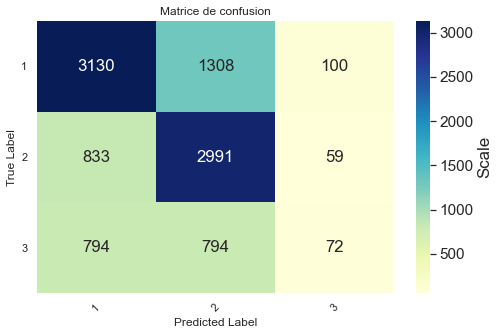

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.6099537037037037
Accuracy : 0.619
Classification Report
              precision    recall  f1-score   support

           1    0.66473   0.70560   0.68455      4538
           2    0.60291   0.73706   0.66327      3883
           3    0.33656   0.10482   0.15985      1660

    accuracy                        0.61879     10081
   macro avg    0.53473   0.51583   0.50256     10081
weighted avg    0.58688   0.61879   0.58995     10081



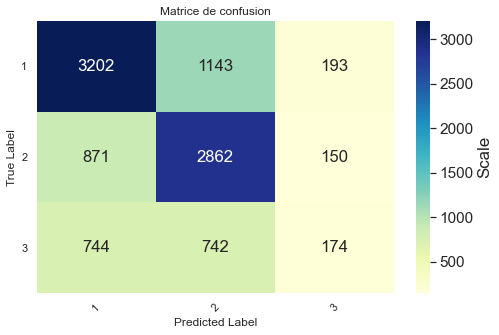

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6296296296296295
Accuracy : 0.629
Classification Report
              precision    recall  f1-score   support

           1    0.66476   0.71706   0.68992      4538
           2    0.59533   0.78728   0.67798      3883
           3    0.64706   0.01988   0.03857      1660

    accuracy                        0.62930     10081
   macro avg    0.63571   0.50807   0.46882     10081
weighted avg    0.63510   0.62930   0.57806     10081



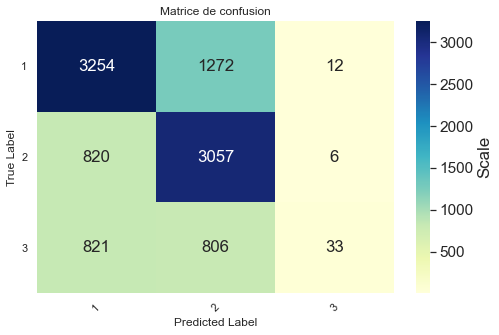

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.5719907407407407
Accuracy : 0.566
Classification Report
              precision    recall  f1-score   support

           1    0.61740   0.66461   0.64014      4538
           2    0.58227   0.60881   0.59524      3883
           3    0.28609   0.19578   0.23247      1660

    accuracy                        0.56592     10081
   macro avg    0.49525   0.48973   0.48928     10081
weighted avg    0.54931   0.56592   0.55572     10081



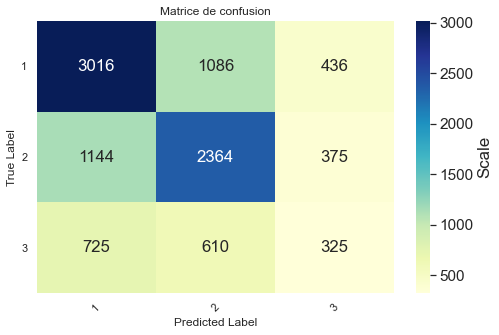

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.619212962962963
Accuracy : 0.620
Classification Report
              precision    recall  f1-score   support

           1    0.65325   0.71155   0.68115      4538
           2    0.59959   0.74968   0.66629      3883
           3    0.39223   0.06687   0.11426      1660

    accuracy                        0.62008     10081
   macro avg    0.54835   0.50936   0.48723     10081
weighted avg    0.58960   0.62008   0.58208     10081



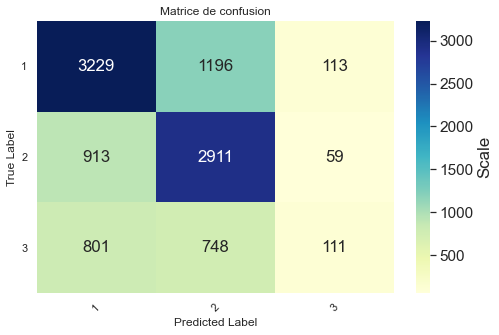

En utilisent text claims, headline, author,keywords,named_entities_claim et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.6093123685678725
Accuracy : 0.614
Classification Report
              precision    recall  f1-score   support

           1    0.65603   0.68871   0.67197      4536
           2    0.59037   0.77054   0.66853      3883
           3    0.30645   0.04581   0.07971      1659

    accuracy                        0.61441     10078
   macro avg    0.51762   0.50169   0.47340     10078
weighted avg    0.57318   0.61441   0.57315     10078



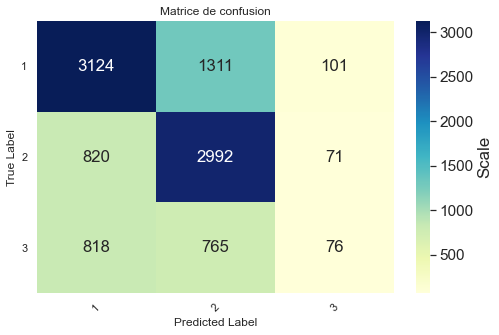

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.6204293807132741
Accuracy : 0.618
Classification Report
              precision    recall  f1-score   support

           1    0.65764   0.71230   0.68388      4536
           2    0.61232   0.73217   0.66690      3883
           3    0.29310   0.09222   0.14030      1659

    accuracy                        0.61788     10078
   macro avg    0.52102   0.51223   0.49703     10078
weighted avg    0.58017   0.61788   0.58786     10078



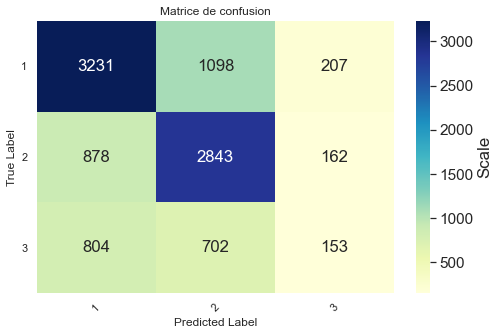

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.618109469550663
Accuracy : 0.631
Classification Report
              precision    recall  f1-score   support

           1    0.66591   0.71539   0.68977      4536
           2    0.59873   0.79887   0.68447      3883
           3    0.54167   0.00784   0.01545      1659

    accuracy                        0.63108     10078
   macro avg    0.60210   0.50736   0.46323     10078
weighted avg    0.61957   0.63108   0.57672     10078



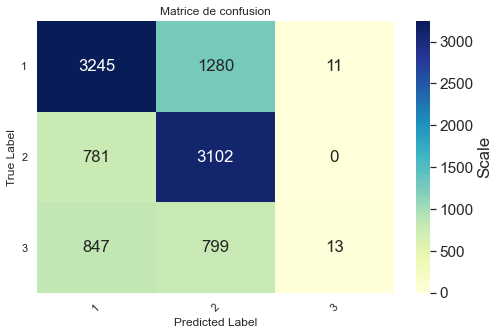

Alogrithm: logisticRegression
best params: {'clf__C': 2000, 'clf__tol': 0.001}
best scores: 0.5766552401184499
Accuracy : 0.576
Classification Report
              precision    recall  f1-score   support

           1    0.62417   0.68100   0.65134      4536
           2    0.58855   0.61447   0.60123      3883
           3    0.30326   0.19650   0.23848      1659

    accuracy                        0.57561     10078
   macro avg    0.50533   0.49732   0.49702     10078
weighted avg    0.55762   0.57561   0.56407     10078



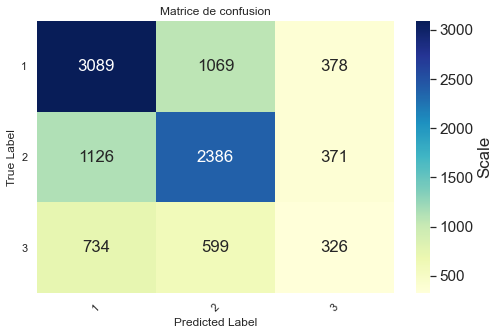

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6141758937384661
Accuracy : 0.621
Classification Report
              precision    recall  f1-score   support

           1    0.64744   0.72266   0.68299      4536
           2    0.60194   0.73603   0.66226      3883
           3    0.44195   0.07113   0.12253      1659

    accuracy                        0.62056     10078
   macro avg    0.56378   0.50994   0.48926     10078
weighted avg    0.59608   0.62056   0.58274     10078



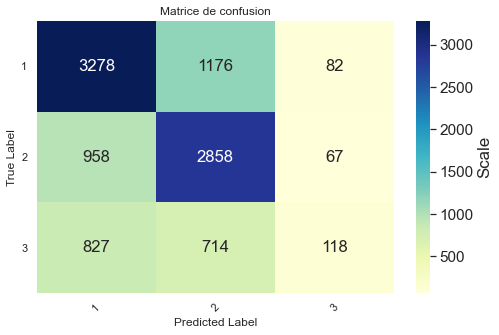

In [68]:
text_normalizer = TextNormalizer()
bestScoredAlgo = []
print("En utilisent text claims comme jeu de donnée")
features = np.array(["text"])
score = classification_avec_pretraitement(features,text_normalizer,dfVFM)
bestScoredAlgo.append(score)
print("En utilisent source et text claims comme jeu de donnée")
features = np.array(["source","text"])
score = classification_avec_pretraitement(features,text_normalizer,dfVFM)
bestScoredAlgo.append(score)
print("En utilisent text claims et author comme jeu de donnée")
features = np.array(["text","author"])
score = classification_avec_pretraitement(features,text_normalizer,dfVFM)
bestScoredAlgo.append(score)
print("En utilisent text claims, headline et author comme jeu de donnée")
features = np.array(["text","headline","author"])
score = classification_avec_pretraitement(features,text_normalizer,dfVFM)
bestScoredAlgo.append(score)
print("En utilisent text claims, headline, author et named_entities_article comme jeu de donnée")
dfn=dfVFM.copy()
features = np.array(["text","headline","author","named_entities_article"])
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)
score=classification_avec_pretraitement(features,text_normalizer,dfn)
bestScoredAlgo.append(score)
print("En utilisent text claims, headline, author,keywords et named_entities_article comme jeu de donnée")
features = np.array(["text","headline","author","named_entities_article","keywords"])
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
score=classification_avec_pretraitement(features,text_normalizer,dfn)
bestScoredAlgo.append(score)
print("En utilisent text claims, source, headline, author, keywords et named_entities_article comme jeu de donnée")
features = np.array(["text","source","headline","author","named_entities_article","keywords"])
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
score=classification_avec_pretraitement(features,text_normalizer,dfn)
bestScoredAlgo.append(score)
print("En utilisent text claims, headline, author,keywords,named_entities_claim et named_entities_article comme jeu de donnée")
dfn['named_entities_claim'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['named_entities_claim'], inplace=True)
features = np.array(["text","headline","author","named_entities_article","keywords","named_entities_claim"])
score=classification_avec_pretraitement(features,text_normalizer,dfn)
bestScoredAlgo.append(score)

In [72]:
bestScoredAlgo.sort(key=lambda x: x[3],reverse=True)
print("Le Meilleur score est: "+str(bestScoredAlgo[0][3]))
print("-------------------------")
print("tri du meilleur score et meilleur algorithme de chaque features")
for i in range(len(bestScoredAlgo)):
    print("Features :"+str(bestScoredAlgo[i][0]))
    print("Meilleur Score :"+str(bestScoredAlgo[i][3]))
    print("Générer par l'Algorithm :"+str(bestScoredAlgo[i][2]))
    print("En utilisent le meilleur Parametre :"+str(bestScoredAlgo[i][4]))
    print("-------------------------")

Le Meilleur score est: 0.6296296296296297
-------------------------
tri du meilleur score et meilleur algorithme de chaque features
Features :['text' 'headline' 'author' 'named_entities_article' 'keywords']
Meilleur Score :0.6296296296296297
Générer par l'Algorithm :RFC
En utilisent le meilleur Parametre :{'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
-------------------------
Features :['text' 'source' 'headline' 'author' 'named_entities_article' 'keywords']
Meilleur Score :0.6296296296296295
Générer par l'Algorithm :RFC
En utilisent le meilleur Parametre :{'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
-------------------------
Features :['text' 'headline' 'author' 'named_entities_article' 'keywords'
 'named_entities_claim']
Meilleur Score :0.6204293807132741
Générer par l'Algorithm :GBC
En utilisent le meilleur Parametre :{'clf__learning_rate': 0.3, 'clf__max_

- Nous remarquons que les meilleurs algorithmes sont RFC et GBC, nous remarquons aussi que les scores sont trés proches entre eux pour cela nous allons effectuer une cross validation sur les features qui ont un trés bon résultat afin de déduire quelle est le meilleur algorithm de classification

### Cross validation en  l'algorithm ___RandomForestClassifier (RFC)___

In [76]:


# selection des données

dfn=dfVFM.copy()
features = np.array(["text","headline","author","named_entities_article"])
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)

X=dfn[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
y=dfn.truthRating
# Création d'un jeu d'apprentissage et de test
trainsize=0.7 # 70% pour le jeu d'apprentissage, il reste 30% du jeu de données pour le test
testsize= 0.3
seed=30
X_train,X_test,y_train,y_test=train_test_split(X, 
                                               y, 
                                               train_size=trainsize, 
                                               random_state=seed,
                                               test_size=testsize)

# création du pipeline en ajoutant le classifier
text_normalizer = TextNormalizer(removestopwords=True, # suppression des stopwords
                 lowercase=True,# passage en minuscule
                 removedigit=False, # supprimer les nombres 
                 transformdigit=False, # transforamation des chiffre en lettres
                 getstemmer=False,# racinisation des termes 
                 getlemmatisation=True, # lemmatisation des termes 
                 remove_non_ascii=False # supprimer les caractéres non ascii
                 )
pipe = Pipeline([("cleaner", text_normalizer),
                 ("count_vectorizer", TfidfVectorizer()),
                 ("RFC", RandomForestClassifier(
                 n_estimators=200, criterion='gini',min_samples_split=2,min_samples_leaf=2
                 ))])
pipe.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [77]:

seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)
scoring = 'accuracy'
print('Cross validation ...')
score = cross_val_score(pipe, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std()) 

Cross validation ...
Les différentes accuracy pour les 10 évaluations sont [0.63168188 0.62190352 0.61734029 0.62451108 0.63298566 0.63428944
 0.63624511 0.64080834 0.64341591 0.61799218] 

Accuracy moyenne :  0.6301173402868319  standard deviation 0.008751857338638017


### Cross validation en utilisent l'algorithm __GradientBoostringClassifier (GBC)__

In [81]:


dfn['named_entities_claim'].replace("", np.nan, inplace=True)
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['named_entities_claim'], inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
features = np.array(["text","headline","author","named_entities_article","keywords","named_entities_claim"])
X=dfn[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
y=dfn.truthRating
# Création d'un jeu d'apprentissage et de test
trainsize=0.7 # 70% pour le jeu d'apprentissage, il reste 30% du jeu de données pour le test
testsize= 0.3
seed=30
X_train,X_test,y_train,y_test=train_test_split(X, 
                                               y, 
                                               train_size=trainsize, 
                                               random_state=seed,
                                               test_size=testsize)

# création du pipeline en ajoutant le classifier
text_normalizer = TextNormalizer(removestopwords=True, # suppression des stopwords
                 lowercase=True,# passage en minuscule
                 removedigit=False, # supprimer les nombres 
                 transformdigit=False, # transforamation des chiffre en lettres
                 getstemmer=False,# racinisation des termes 
                 getlemmatisation=True, # lemmatisation des termes 
                 remove_non_ascii=False # supprimer les caractéres non ascii
                 )
pipe = Pipeline([("cleaner", text_normalizer),
                 ("count_vectorizer", TfidfVectorizer()),
                 ("GBC", GradientBoostingClassifier(
                 learning_rate= 0.3, max_depth= 3, min_samples_leaf= 2,min_samples_split= 2, n_estimators= 100
                 ))])
pipe.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [83]:
seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)
scoring = 'accuracy'
print('Cross validation ...')
score = cross_val_score(pipe, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std()) 

Cross validation ...
Les différentes accuracy pour les 10 évaluations sont [0.63819444 0.64722222 0.62986111 0.64305556 0.63333333 0.62569444
 0.64836692 0.64350243 0.62265462 0.62612926] 

Accuracy moyenne :  0.6358014342521814  standard deviation 0.00903271792114631


Aprés Avoir comparer le résultat de la cross validation des deux algorithmes nous déduisons que le meilleur est GradientBoostingClassifier GBC

## Equilibrage des données

### Under sampling

Random under-sampling:
MIXTURE    4452
FALSE      4452
TRUE       4452
Name: ratingName, dtype: int64


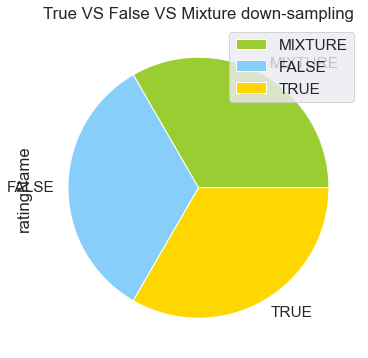

In [28]:
dfrvf = df[df.ratingName != "ratingName"]
# Class count
#count_class_false, count_class_true = dfrvf.ratingName.value_counts()
df_class_false = dfrvf[dfrvf['ratingName'] == "FALSE"]

#dfr = dfr[dfr.ratingName != "ratingName"]
dfrvf = df[df.ratingName != "FALSE"]
count_class_mixture,count_class_true = dfrvf.ratingName.value_counts()
#Divide by class

df_class_true = dfrvf[dfrvf['ratingName'] == "TRUE"]
df_class_mixture = dfrvf[dfrvf['ratingName'] == "MIXTURE"]

df_class_false_under = df_class_false.sample(count_class_true)

df_class_mixture_under = df_class_mixture.sample(count_class_true)
dfVFM_under = pd.concat([df_class_false_under,df_class_mixture_under, df_class_true], axis=0)

print('Random under-sampling:')
print(dfVFM_under.ratingName.value_counts())

#df_test_under.ratingName.value_counts().plot(kind='bar', title='Count (target)');
colors = ['yellowgreen', 'lightskyblue', 'gold']

df_test_under["ratingName"].value_counts().plot(kind='pie', 
                                  title = "True VS False VS Mixture down-sampling",
                                  figsize=(6,6),colors=colors, 
                                  legend=True)

plt.show()

En utilisent text claims comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.44384077260033433
Accuracy : 0.438
Classification Report
              precision    recall  f1-score   support

           1    0.42460   0.60519   0.49906      3080
           2    0.47157   0.41478   0.44136      3139
           3    0.42383   0.29767   0.34972      3131

    accuracy                        0.43829      9350
   macro avg    0.44000   0.43922   0.43005      9350
weighted avg    0.44011   0.43829   0.42968      9350



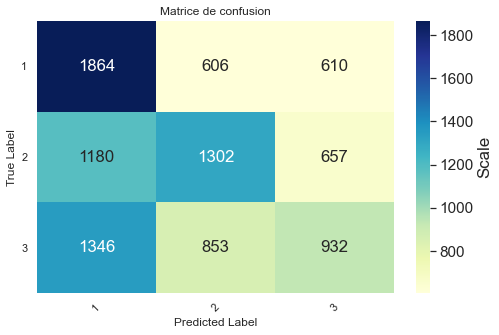

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.4425929558127154
Accuracy : 0.451
Classification Report
              precision    recall  f1-score   support

           1    0.45278   0.54481   0.49455      3080
           2    0.45968   0.46671   0.46317      3139
           3    0.43590   0.34206   0.38332      3131

    accuracy                        0.45070      9350
   macro avg    0.44945   0.45119   0.44701      9350
weighted avg    0.44944   0.45070   0.44677      9350



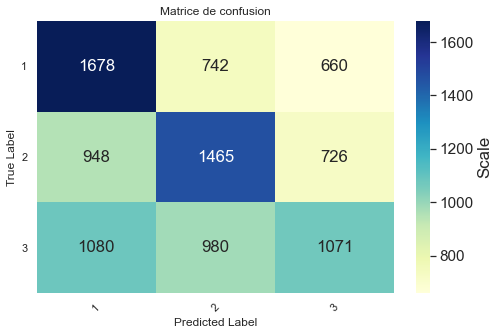

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.46681019050376554
Accuracy : 0.476
Classification Report
              precision    recall  f1-score   support

           1    0.47857   0.55455   0.51376      3080
           2    0.47416   0.58745   0.52476      3139
           3    0.47674   0.28809   0.35915      3131

    accuracy                        0.47636      9350
   macro avg    0.47649   0.47669   0.46589      9350
weighted avg    0.47648   0.47636   0.46568      9350



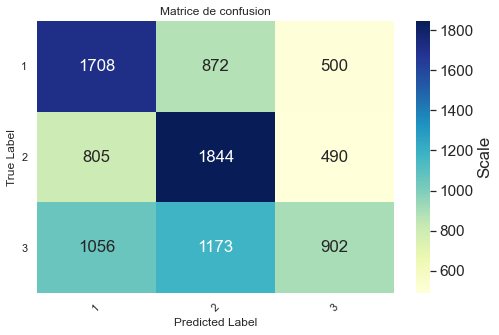

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.4473301764315803
Accuracy : 0.443
Classification Report
              precision    recall  f1-score   support

           1    0.45385   0.45974   0.45677      3080
           2    0.44978   0.47786   0.46339      3139
           3    0.42418   0.39221   0.40757      3131

    accuracy                        0.44321      9350
   macro avg    0.44260   0.44327   0.44258      9350
weighted avg    0.44255   0.44321   0.44252      9350



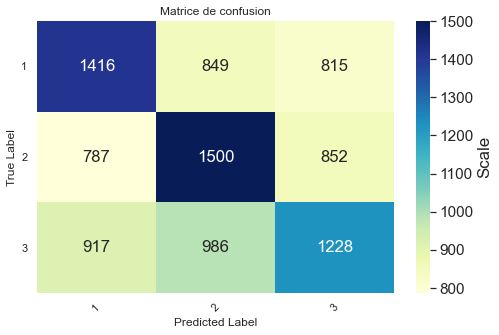

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.4825321216310036
Accuracy : 0.476
Classification Report
              precision    recall  f1-score   support

           1    0.48227   0.52987   0.50495      3080
           2    0.48436   0.53265   0.50736      3139
           3    0.45784   0.36761   0.40779      3131

    accuracy                        0.47647      9350
   macro avg    0.47482   0.47671   0.47337      9350
weighted avg    0.47479   0.47647   0.47322      9350



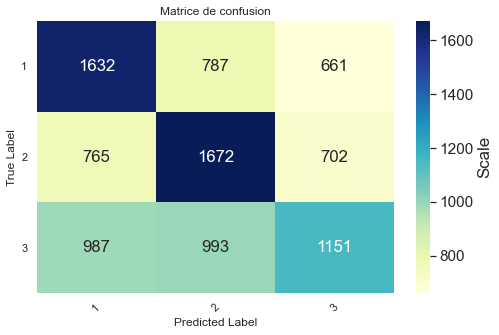

En utilisent source et text claims comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.46929897478525906
Accuracy : 0.482
Classification Report
              precision    recall  f1-score   support

           1    0.49717   0.51396   0.50543      3080
           2    0.47526   0.71615   0.57136      3139
           3    0.46797   0.21463   0.29429      3131

    accuracy                        0.48160      9350
   macro avg    0.48013   0.48158   0.45702      9350
weighted avg    0.48004   0.48160   0.45686      9350



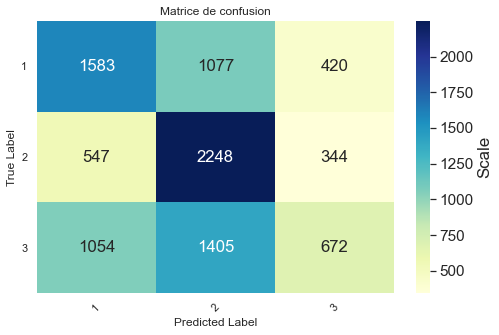

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.48003742205036726
Accuracy : 0.482
Classification Report
              precision    recall  f1-score   support

           1    0.49510   0.52532   0.50977      3080
           2    0.47815   0.63778   0.54655      3139
           3    0.46649   0.28234   0.35177      3131

    accuracy                        0.48171      9350
   macro avg    0.47991   0.48182   0.46936      9350
weighted avg    0.47983   0.48171   0.46921      9350



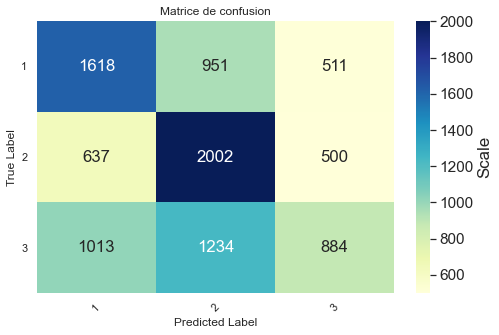

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.5035009230979978
Accuracy : 0.505
Classification Report
              precision    recall  f1-score   support

           1    0.51443   0.56136   0.53687      3080
           2    0.48648   0.73367   0.58504      3139
           3    0.54821   0.21974   0.31373      3131

    accuracy                        0.50481      9350
   macro avg    0.51637   0.50492   0.47855      9350
weighted avg    0.51636   0.50481   0.47832      9350



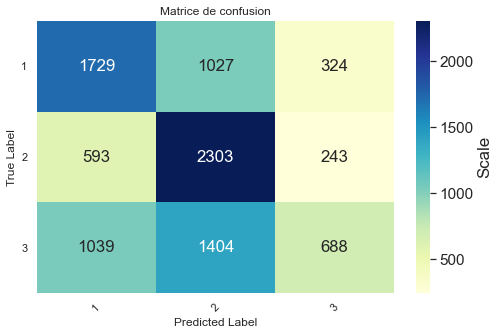

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.45731333339559965
Accuracy : 0.456
Classification Report
              precision    recall  f1-score   support

           1    0.46835   0.48052   0.47436      3080
           2    0.46646   0.48965   0.47777      3139
           3    0.43178   0.39923   0.41487      3131

    accuracy                        0.45636      9350
   macro avg    0.45553   0.45647   0.45567      9350
weighted avg    0.45547   0.45636   0.45558      9350



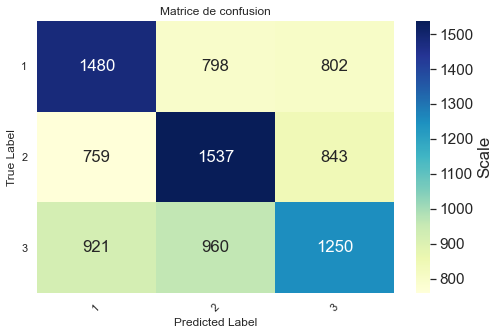

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.5005046684163499
Accuracy : 0.492
Classification Report
              precision    recall  f1-score   support

           1    0.50078   0.52208   0.51121      3080
           2    0.49386   0.60210   0.54264      3139
           3    0.47708   0.35228   0.40529      3131

    accuracy                        0.49209      9350
   macro avg    0.49057   0.49215   0.48638      9350
weighted avg    0.49052   0.49209   0.48629      9350



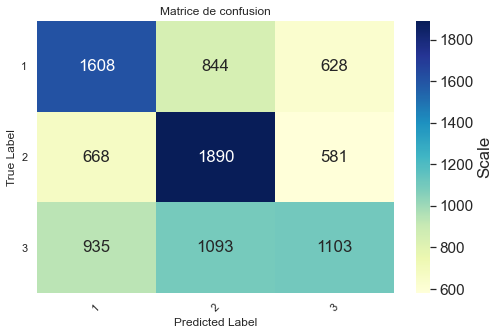

En utilisent text claims et author comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.48178399195519317
Accuracy : 0.495
Classification Report
              precision    recall  f1-score   support

           1    0.51247   0.58052   0.54438      3080
           2    0.48561   0.69863   0.57296      3139
           3    0.47955   0.20600   0.28820      3131

    accuracy                        0.49476      9350
   macro avg    0.49254   0.49505   0.46851      9350
weighted avg    0.49243   0.49476   0.46819      9350



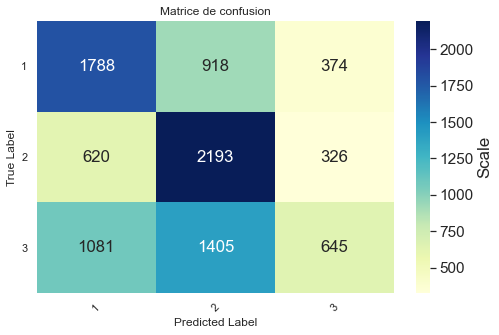

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.4802852419513015
Accuracy : 0.494
Classification Report
              precision    recall  f1-score   support

           1    0.52293   0.54416   0.53333      3080
           2    0.49190   0.62886   0.55201      3139
           3    0.45544   0.31012   0.36899      3131

    accuracy                        0.49422      9350
   macro avg    0.49009   0.49438   0.48478      9350
weighted avg    0.48991   0.49422   0.48457      9350



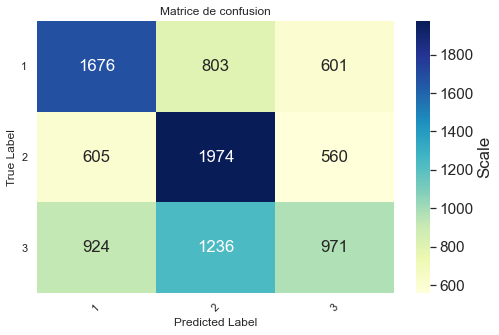

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.5087499727584908
Accuracy : 0.517
Classification Report
              precision    recall  f1-score   support

           1    0.52899   0.59838   0.56155      3080
           2    0.50368   0.69831   0.58524      3139
           3    0.52708   0.25487   0.34360      3131

    accuracy                        0.51690      9350
   macro avg    0.51992   0.51719   0.49679      9350
weighted avg    0.51985   0.51690   0.49652      9350



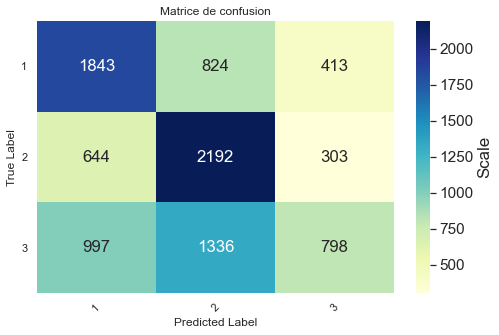

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.47404335602940223
Accuracy : 0.469
Classification Report
              precision    recall  f1-score   support

           1    0.48906   0.52240   0.50518      3080
           2    0.47388   0.48264   0.47822      3139
           3    0.44045   0.40275   0.42075      3131

    accuracy                        0.46898      9350
   macro avg    0.46780   0.46926   0.46805      9350
weighted avg    0.46768   0.46898   0.46786      9350



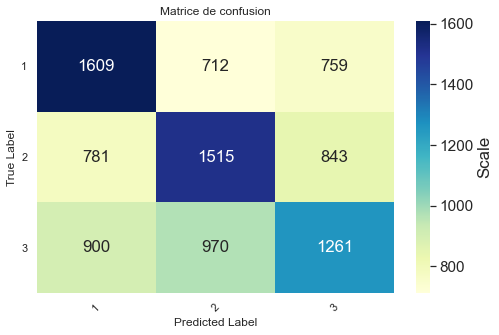

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.5072453074554562
Accuracy : 0.504
Classification Report
              precision    recall  f1-score   support

           1    0.51937   0.56591   0.54164      3080
           2    0.51104   0.59000   0.54769      3139
           3    0.47215   0.35739   0.40684      3131

    accuracy                        0.50417      9350
   macro avg    0.50085   0.50443   0.49872      9350
weighted avg    0.50076   0.50417   0.49853      9350



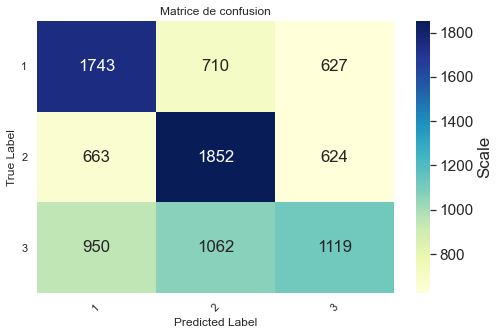

En utilisent text claims, headline et author comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.497250319893151
Accuracy : 0.507
Classification Report
              precision    recall  f1-score   support

           1    0.53747   0.55649   0.54682      3080
           2    0.49172   0.71870   0.58393      3139
           3    0.48951   0.24593   0.32738      3131

    accuracy                        0.50695      9350
   macro avg    0.50623   0.50704   0.48604      9350
weighted avg    0.50605   0.50695   0.48579      9350



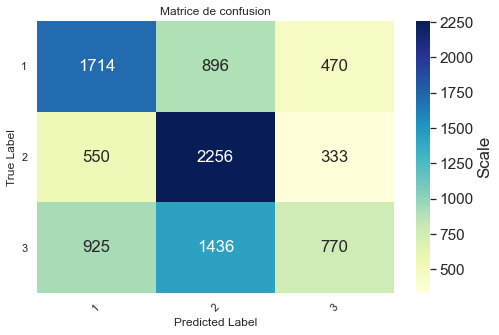

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.5012487507822204
Accuracy : 0.517
Classification Report
              precision    recall  f1-score   support

           1    0.54982   0.55000   0.54991      3080
           2    0.50997   0.61931   0.55934      3139
           3    0.48555   0.38103   0.42699      3131

    accuracy                        0.51668      9350
   macro avg    0.51511   0.51678   0.51208      9350
weighted avg    0.51492   0.51668   0.51191      9350



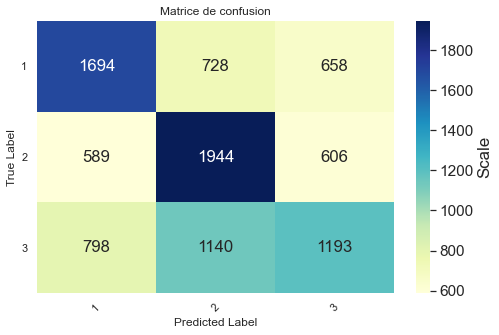

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.5229691065718972
Accuracy : 0.535
Classification Report
              precision    recall  f1-score   support

           1    0.55096   0.61429   0.58090      3080
           2    0.51186   0.72157   0.59889      3139
           3    0.56539   0.26924   0.36478      3131

    accuracy                        0.53476      9350
   macro avg    0.54274   0.53503   0.51486      9350
weighted avg    0.54267   0.53476   0.51457      9350



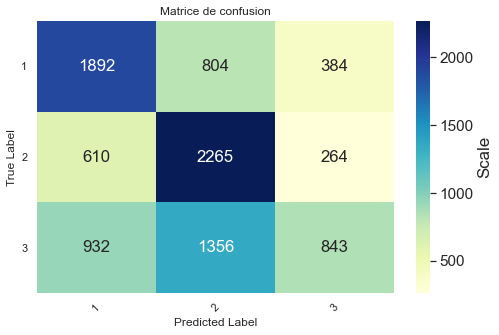

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.491265593818201
Accuracy : 0.487
Classification Report
              precision    recall  f1-score   support

           1    0.50915   0.53312   0.52086      3080
           2    0.48628   0.49665   0.49141      3139
           3    0.46249   0.43117   0.44628      3131

    accuracy                        0.48674      9350
   macro avg    0.48597   0.48698   0.48618      9350
weighted avg    0.48584   0.48674   0.48600      9350



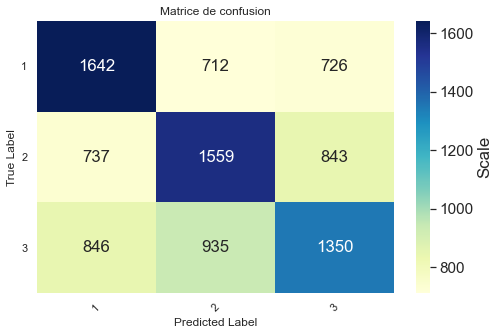

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.5104872027173017
Accuracy : 0.521
Classification Report
              precision    recall  f1-score   support

           1    0.53683   0.59156   0.56287      3080
           2    0.51817   0.58586   0.54994      3139
           3    0.50104   0.38518   0.43554      3131

    accuracy                        0.52053      9350
   macro avg    0.51868   0.52086   0.51611      9350
weighted avg    0.51858   0.52053   0.51589      9350



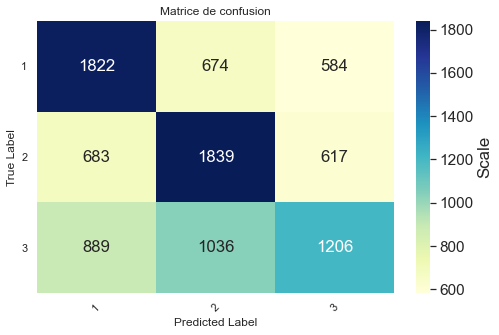

En utilisent text claims, headline, author et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.4837022132796781
Accuracy : 0.503
Classification Report
              precision    recall  f1-score   support

           1    0.52463   0.62361   0.56985      2152
           2    0.49285   0.63504   0.55499      1792
           3    0.46888   0.23558   0.31360      1855

    accuracy                        0.50302      5799
   macro avg    0.49546   0.49808   0.47948      5799
weighted avg    0.49698   0.50302   0.48329      5799



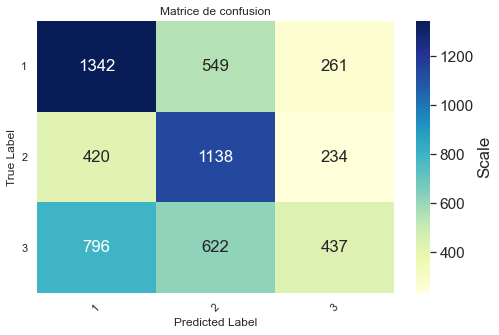

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.5150905432595574
Accuracy : 0.514
Classification Report
              precision    recall  f1-score   support

           1    0.54131   0.56320   0.55204      2152
           2    0.50963   0.59040   0.54705      1792
           3    0.47978   0.38383   0.42647      1855

    accuracy                        0.51423      5799
   macro avg    0.51024   0.51248   0.50852      5799
weighted avg    0.51184   0.51423   0.51033      5799



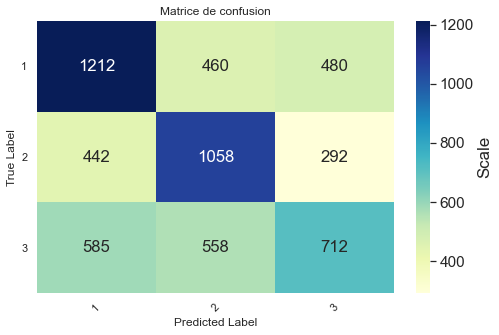

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.5392354124748491
Accuracy : 0.527
Classification Report
              precision    recall  f1-score   support

           1    0.53422   0.65660   0.58912      2152
           2    0.52027   0.63728   0.57286      1792
           3    0.52242   0.27008   0.35608      1855

    accuracy                        0.52699      5799
   macro avg    0.52564   0.52132   0.50602      5799
weighted avg    0.52613   0.52699   0.50955      5799



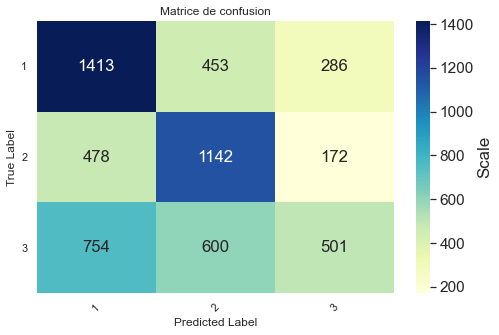

Alogrithm: logisticRegression
best params: {'clf__C': 2000, 'clf__tol': 0.0001}
best scores: 0.47726358148893366
Accuracy : 0.479
Classification Report
              precision    recall  f1-score   support

           1    0.51111   0.53439   0.52249      2152
           2    0.47192   0.47824   0.47506      1792
           3    0.44374   0.41456   0.42865      1855

    accuracy                        0.47870      5799
   macro avg    0.47559   0.47573   0.47540      5799
weighted avg    0.47745   0.47870   0.47781      5799



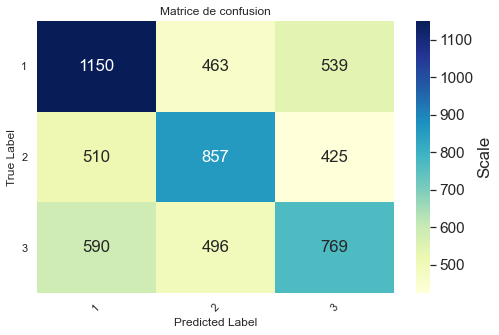

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.5074446680080482
Accuracy : 0.509
Classification Report
              precision    recall  f1-score   support

           1    0.51976   0.61106   0.56173      2152
           2    0.52421   0.52567   0.52494      1792
           3    0.47351   0.37574   0.41900      1855

    accuracy                        0.50940      5799
   macro avg    0.50583   0.50416   0.50189      5799
weighted avg    0.50634   0.50940   0.50470      5799



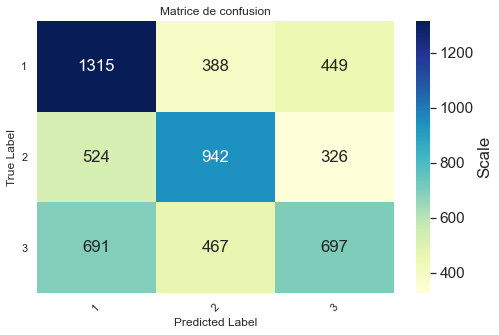

En utilisent text claims, headline, author,keywords et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.5109705108680604
Accuracy : 0.507
Classification Report
              precision    recall  f1-score   support

           1    0.55430   0.54046   0.54729      2002
           2    0.49038   0.69530   0.57513      1723
           3    0.45700   0.27742   0.34526      1705

    accuracy                        0.50700      5430
   macro avg    0.50056   0.50439   0.48923      5430
weighted avg    0.50347   0.50700   0.49269      5430



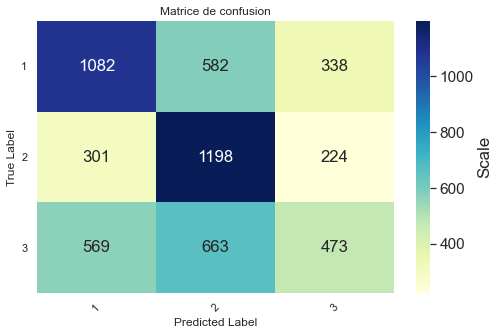

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.5182500346116573
Accuracy : 0.510
Classification Report
              precision    recall  f1-score   support

           1    0.56591   0.54895   0.55730      2002
           2    0.50646   0.61463   0.55532      1723
           3    0.43951   0.36012   0.39587      1705

    accuracy                        0.51050      5430
   macro avg    0.50396   0.50790   0.50283      5430
weighted avg    0.50736   0.51050   0.50599      5430



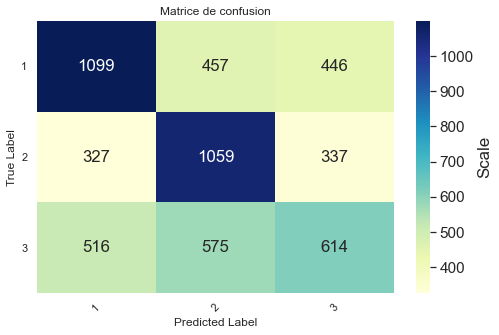

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.5397544879782178
Accuracy : 0.534
Classification Report
              precision    recall  f1-score   support

           1    0.56478   0.64236   0.60108      2002
           2    0.50618   0.73651   0.60000      1723
           3    0.53406   0.20235   0.29349      1705

    accuracy                        0.53407      5430
   macro avg    0.53501   0.52707   0.49819      5430
weighted avg    0.53654   0.53407   0.50415      5430



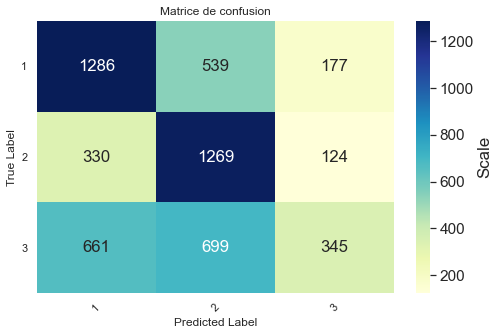

Alogrithm: logisticRegression
best params: {'clf__C': 2000, 'clf__tol': 0.0001}
best scores: 0.5023600535326965
Accuracy : 0.499
Classification Report
              precision    recall  f1-score   support

           1    0.54608   0.55944   0.55268      2002
           2    0.49667   0.52002   0.50808      1723
           3    0.44127   0.40762   0.42378      1705

    accuracy                        0.49926      5430
   macro avg    0.49467   0.49570   0.49485      5430
weighted avg    0.49749   0.49926   0.49805      5430



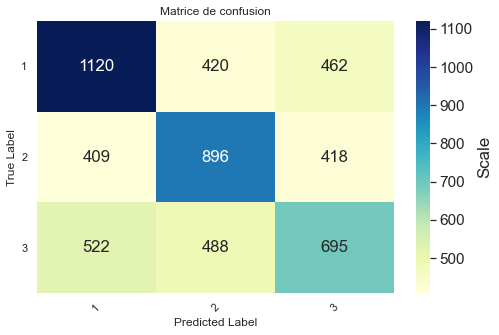

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.5311449536203794
Accuracy : 0.521
Classification Report
              precision    recall  f1-score   support

           1    0.55076   0.61788   0.58239      2002
           2    0.52078   0.60360   0.55914      1723
           3    0.46588   0.32434   0.38243      1705

    accuracy                        0.52118      5430
   macro avg    0.51247   0.51527   0.50799      5430
weighted avg    0.51459   0.52118   0.51223      5430



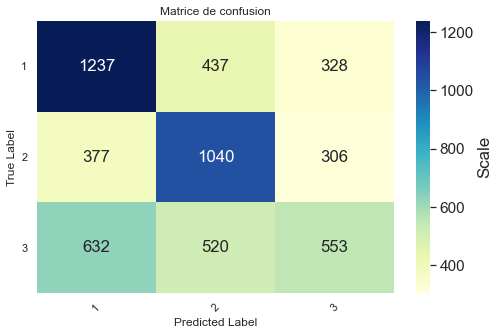

En utilisent text claims, source, headline, author, keywords et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.515261433384097
Accuracy : 0.504
Classification Report
              precision    recall  f1-score   support

           1    0.55460   0.55045   0.55252      2002
           2    0.48338   0.70052   0.57204      1723
           3    0.45243   0.25103   0.32290      1705

    accuracy                        0.50405      5430
   macro avg    0.49681   0.50067   0.48248      5430
weighted avg    0.49992   0.50405   0.48661      5430



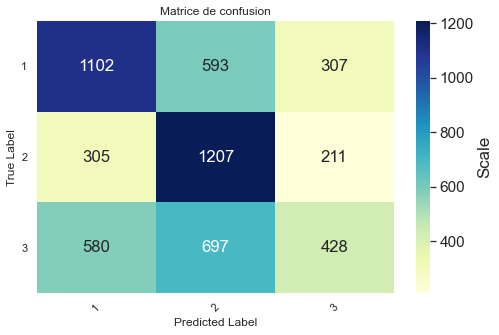

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.509232544187549
Accuracy : 0.516
Classification Report
              precision    recall  f1-score   support

           1    0.57187   0.55644   0.56405      2002
           2    0.50139   0.62623   0.55690      1723
           3    0.45714   0.35660   0.40066      1705

    accuracy                        0.51584      5430
   macro avg    0.51014   0.51309   0.50720      5430
weighted avg    0.51348   0.51584   0.51048      5430



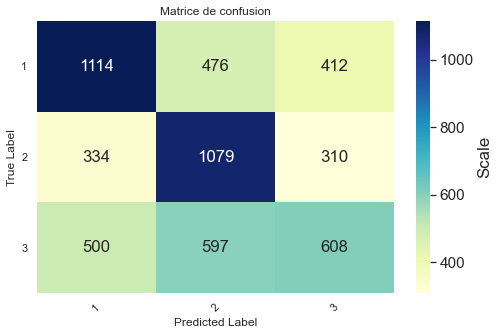

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.5483455627855461
Accuracy : 0.541
Classification Report
              precision    recall  f1-score   support

           1    0.57748   0.63287   0.60391      2002
           2    0.50424   0.75914   0.60598      1723
           3    0.56231   0.21173   0.30763      1705

    accuracy                        0.54070      5430
   macro avg    0.54801   0.53458   0.50584      5430
weighted avg    0.54948   0.54070   0.51153      5430



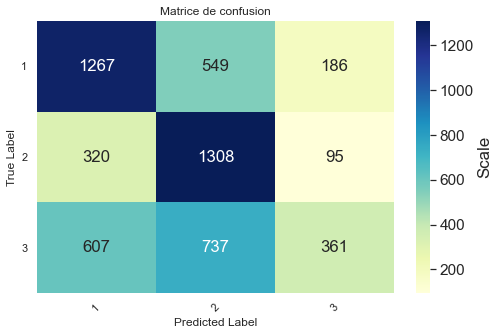

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.5070838525081915
Accuracy : 0.502
Classification Report
              precision    recall  f1-score   support

           1    0.55073   0.56394   0.55726      2002
           2    0.49836   0.52815   0.51282      1723
           3    0.44337   0.40411   0.42283      1705

    accuracy                        0.50239      5430
   macro avg    0.49749   0.49873   0.49764      5430
weighted avg    0.50040   0.50239   0.50095      5430



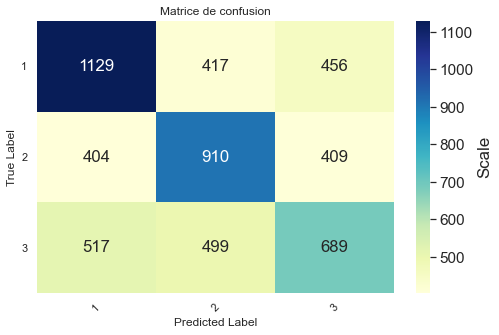

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.5307240758687526
Accuracy : 0.525
Classification Report
              precision    recall  f1-score   support

           1    0.55735   0.62138   0.58762      2002
           2    0.52045   0.62043   0.56606      1723
           3    0.46941   0.31496   0.37697      1705

    accuracy                        0.52486      5430
   macro avg    0.51573   0.51892   0.51022      5430
weighted avg    0.51803   0.52486   0.51464      5430



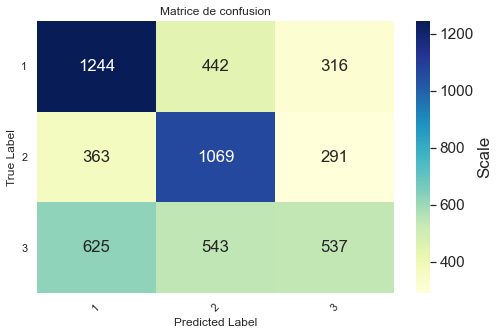

En utilisent text claims, headline, author,keywords,named_entities_claim et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.5133379482209609
Accuracy : 0.512
Classification Report
              precision    recall  f1-score   support

           1    0.57046   0.54650   0.55822      2000
           2    0.50248   0.70476   0.58667      1724
           3    0.42870   0.27523   0.33524      1704

    accuracy                        0.51161      5428
   macro avg    0.50055   0.50883   0.49338      5428
weighted avg    0.50437   0.51161   0.49726      5428



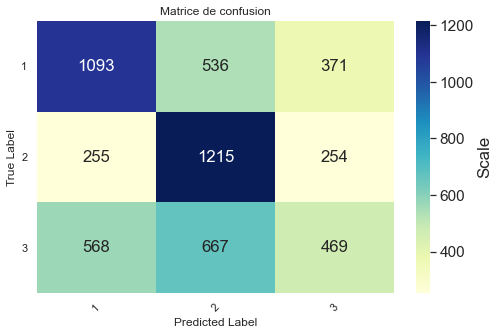

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
best scores: 0.5215081452766624
Accuracy : 0.528
Classification Report
              precision    recall  f1-score   support

           1    0.57672   0.60700   0.59147      2000
           2    0.51163   0.59977   0.55220      1724
           3    0.47312   0.36150   0.40985      1704

    accuracy                        0.52763      5428
   macro avg    0.52049   0.52276   0.51784      5428
weighted avg    0.52352   0.52763   0.52198      5428



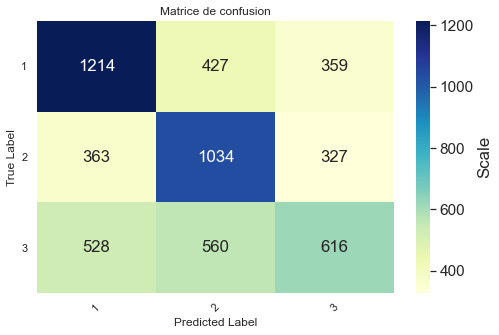

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.5524445059762795
Accuracy : 0.539
Classification Report
              precision    recall  f1-score   support

           1    0.56954   0.66950   0.61549      2000
           2    0.50673   0.74246   0.60235      1724
           3    0.55535   0.17958   0.27140      1704

    accuracy                        0.53887      5428
   macro avg    0.54388   0.53051   0.49641      5428
weighted avg    0.54514   0.53887   0.50330      5428



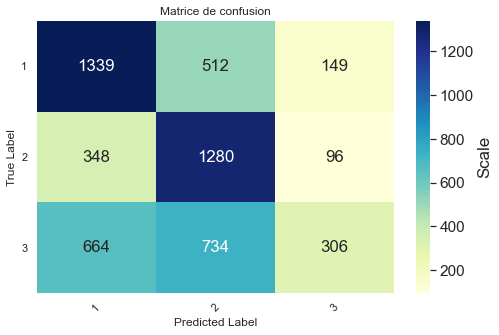

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.4974239697263371
Accuracy : 0.523
Classification Report
              precision    recall  f1-score   support

           1    0.56798   0.61200   0.58917      2000
           2    0.51279   0.51160   0.51220      1724
           3    0.47263   0.43075   0.45072      1704

    accuracy                        0.52321      5428
   macro avg    0.51780   0.51812   0.51736      5428
weighted avg    0.52052   0.52321   0.52126      5428



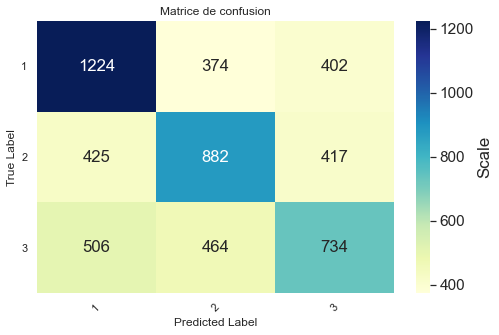

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.5292417739628039
Accuracy : 0.546
Classification Report
              precision    recall  f1-score   support

           1    0.58128   0.62400   0.60188      2000
           2    0.52494   0.62877   0.57218      1724
           3    0.51809   0.36972   0.43151      1704

    accuracy                        0.54569      5428
   macro avg    0.54144   0.54083   0.53519      5428
weighted avg    0.54355   0.54569   0.53896      5428



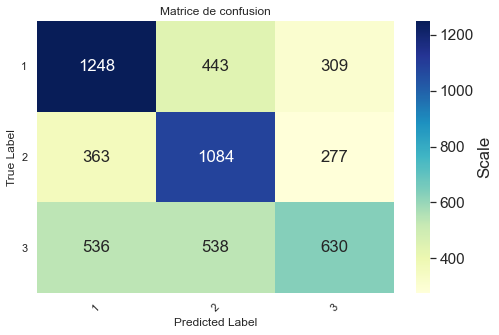

In [19]:
text_normalizer = TextNormalizer()
bestScoredAlgo = []
print("En utilisent text claims comme jeu de donnée")
features = np.array(["text"])
score = classification_avec_pretraitement(features,text_normalizer,dfVFM_under)
bestScoredAlgo.append(score)
print("En utilisent source et text claims comme jeu de donnée")
features = np.array(["source","text"])
score = classification_avec_pretraitement(features,text_normalizer,dfVFM_under)
bestScoredAlgo.append(score)
print("En utilisent text claims et author comme jeu de donnée")
features = np.array(["text","author"])
score = classification_avec_pretraitement(features,text_normalizer,dfVFM_under)
bestScoredAlgo.append(score)
print("En utilisent text claims, headline et author comme jeu de donnée")
features = np.array(["text","headline","author"])
score = classification_avec_pretraitement(features,text_normalizer,dfVFM_under)
bestScoredAlgo.append(score)
print("En utilisent text claims, headline, author et named_entities_article comme jeu de donnée")
dfn=dfVFM_under.copy()
features = np.array(["text","headline","author","named_entities_article"])
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)
score=classification_avec_pretraitement(features,text_normalizer,dfn)
bestScoredAlgo.append(score)
print("En utilisent text claims, headline, author,keywords et named_entities_article comme jeu de donnée")
features = np.array(["text","headline","author","named_entities_article","keywords"])
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
score=classification_avec_pretraitement(features,text_normalizer,dfn)
bestScoredAlgo.append(score)
print("En utilisent text claims, source, headline, author, keywords et named_entities_article comme jeu de donnée")
features = np.array(["text","source","headline","author","named_entities_article","keywords"])
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
score=classification_avec_pretraitement(features,text_normalizer,dfn)
bestScoredAlgo.append(score)
print("En utilisent text claims, headline, author,keywords,named_entities_claim et named_entities_article comme jeu de donnée")
dfn['named_entities_claim'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['named_entities_claim'], inplace=True)
features = np.array(["text","headline","author","named_entities_article","keywords","named_entities_claim"])
score=classification_avec_pretraitement(features,text_normalizer,dfn)
bestScoredAlgo.append(score)

In [20]:
bestScoredAlgo.sort(key=lambda x: x[3],reverse=True)
print("Le Meilleur score est: "+str(bestScoredAlgo[0][3]))
print("-------------------------")
print("tri du meilleur score et meilleur algorithme de chaque features")
for i in range(len(bestScoredAlgo)):
    print("Features :"+str(bestScoredAlgo[i][0]))
    print("Meilleur Score :"+str(bestScoredAlgo[i][3]))
    print("Générer par l'Algorithm :"+str(bestScoredAlgo[i][2]))
    print("En utilisent le meilleur Parametre :"+str(bestScoredAlgo[i][4]))
    print("-------------------------")

Le Meilleur score est: 0.5524445059762795
-------------------------
tri du meilleur score et meilleur algorithme de chaque features
Features :['text' 'headline' 'author' 'named_entities_article' 'keywords'
 'named_entities_claim']
Meilleur Score :0.5524445059762795
Générer par l'Algorithm :RFC
En utilisent le meilleur Parametre :{'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
-------------------------
Features :['text' 'source' 'headline' 'author' 'named_entities_article' 'keywords']
Meilleur Score :0.5483455627855461
Générer par l'Algorithm :RFC
En utilisent le meilleur Parametre :{'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
-------------------------
Features :['text' 'headline' 'author' 'named_entities_article' 'keywords']
Meilleur Score :0.5397544879782178
Générer par l'Algorithm :RFC
En utilisent le meilleur Parametre :{'clf__criterion': 'gini', 'clf__min_s

Nous remarquons que le comportement des algorithmes a changer aprés avoir effectuer l'equilibrage Down Sampling, le meilleur algorithme est RFC avec un score moin de celui d'avant .

- RandomForestClassifier

In [14]:


# selection des données
features = np.array(["text","headline","author","named_entities_article"])

dfn=dfVFM_under.copy()
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)

X=dfn[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
y=dfn.truthRating
# Création d'un jeu d'apprentissage et de test
trainsize=0.7 # 70% pour le jeu d'apprentissage, il reste 30% du jeu de données pour le test
testsize= 0.3
seed=30
X_train,X_test,y_train,y_test=train_test_split(X, 
                                               y, 
                                               train_size=trainsize, 
                                               random_state=seed,
                                               test_size=testsize)

# création du pipeline en ajoutant le classifier
text_normalizer = TextNormalizer(removestopwords=True, # suppression des stopwords
                 lowercase=True,# passage en minuscule
                 removedigit=False, # supprimer les nombres 
                 transformdigit=False, # transforamation des chiffre en lettres
                 getstemmer=False,# racinisation des termes 
                 getlemmatisation=True, # lemmatisation des termes 
                 remove_non_ascii=False # supprimer les caractéres non ascii
                 )
pipe = Pipeline([("cleaner", text_normalizer),
                 ("count_vectorizer", TfidfVectorizer()),
                 ("RFC", RandomForestClassifier(
                 n_estimators=200, criterion='gini',min_samples_split=2,min_samples_leaf=2
                 ))])
pipe.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [15]:
seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)
scoring = 'accuracy'
print('Cross validation ...')
score = cross_val_score(pipe, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std()) 

Cross validation ...
Les différentes accuracy pour les 10 évaluations sont [0.54861945 0.52524038 0.57932692 0.56850962 0.58533654 0.53245192
 0.54447115 0.5625     0.54807692 0.55048077] 

Accuracy moyenne :  0.5545013678548343  standard deviation 0.018336709327111348


In [23]:


# selection des données
features = np.array(['text','headline','author','named_entities_article','keywords','named_entities_claim'])

dfn=dfVFM_under.copy()
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn['named_entities_claim'].replace("", np.nan, inplace=True)
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['named_entities_claim'], inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
X=dfn[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
y=dfn.truthRating
# Création d'un jeu d'apprentissage et de test
trainsize=0.7 # 70% pour le jeu d'apprentissage, il reste 30% du jeu de données pour le test
testsize= 0.3
seed=30
X_train,X_test,y_train,y_test=train_test_split(X, 
                                               y, 
                                               train_size=trainsize, 
                                               random_state=seed,
                                               test_size=testsize)

# création du pipeline en ajoutant le classifier
text_normalizer = TextNormalizer(removestopwords=True, # suppression des stopwords
                 lowercase=True,# passage en minuscule
                 removedigit=False, # supprimer les nombres 
                 transformdigit=False, # transforamation des chiffre en lettres
                 getstemmer=False,# racinisation des termes 
                 getlemmatisation=True, # lemmatisation des termes 
                 remove_non_ascii=False # supprimer les caractéres non ascii
                 )
pipe = Pipeline([("cleaner", text_normalizer),
                 ("count_vectorizer", TfidfVectorizer()),
                 ("RFC", RandomForestClassifier(
                 n_estimators=200, criterion='gini',min_samples_split=2,min_samples_leaf=2
                 ))])
pipe.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [24]:
seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)
scoring = 'accuracy'
print('Cross validation ...')
score = cross_val_score(pipe, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std()) 

Cross validation ...
Les différentes accuracy pour les 10 évaluations sont [0.58247423 0.58762887 0.57474227 0.57860825 0.57032258 0.53290323
 0.55870968 0.58064516 0.57548387 0.57290323] 

Accuracy moyenne :  0.5714421350182907  standard deviation 0.014824789588458847


- La meilleur features pour ce Algorithme est : 'text','headline','author','named_entities_article','keywords','named_entities_claim'

- Nous remarquons que modéle n'est pas trés performant comparer par le modéle qui est été avant l'equilibrage

### Random Over Sampling

Random over-sampling:
MIXTURE    10000
FALSE      10000
TRUE       10000
Name: ratingName, dtype: int64


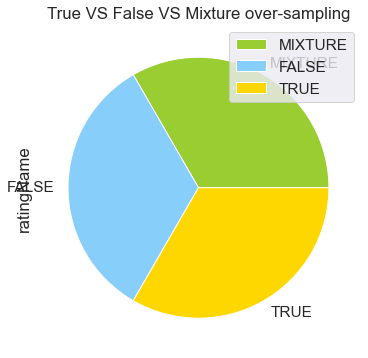

In [40]:
df_class_true_over = df_class_true.sample(count_class_false, replace=True)
df_class_mixture_over = df_class_mixture.sample(count_class_false, replace=True)
dfVFM_over = pd.concat([df_class_false, df_class_true_over,df_class_mixture_over], axis=0)

print('Random over-sampling:')
print(dfVFM_over.ratingName.value_counts())

#df_test_over.ratingName.value_counts().plot(kind='bar', title='Count (target)');
colors = ['yellowgreen', 'lightskyblue', 'gold']

dfVFM_over["ratingName"].value_counts().plot(kind='pie', 
                                  title = "True VS False VS Mixture over-sampling",
                                  figsize=(6,6),colors=colors, 
                                  legend=True)

plt.show()

En utilisent text claims comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.4721111111111111
Accuracy : 0.473
Classification Report
              precision    recall  f1-score   support

           1    0.46199   0.56375   0.50782      6996
           2    0.50177   0.48427   0.49286      7023
           3    0.45453   0.37015   0.40802      6981

    accuracy                        0.47281     21000
   macro avg    0.47276   0.47272   0.46957     21000
weighted avg    0.47281   0.47281   0.46964     21000



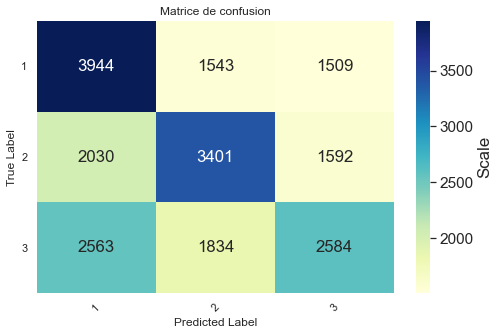

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.5422222222222223
Accuracy : 0.553
Classification Report
              precision    recall  f1-score   support

           1    0.52384   0.54017   0.53188      6996
           2    0.56443   0.56443   0.56443      7023
           3    0.57297   0.55508   0.56388      6981

    accuracy                        0.55324     21000
   macro avg    0.55375   0.55323   0.55340     21000
weighted avg    0.55375   0.55324   0.55340     21000



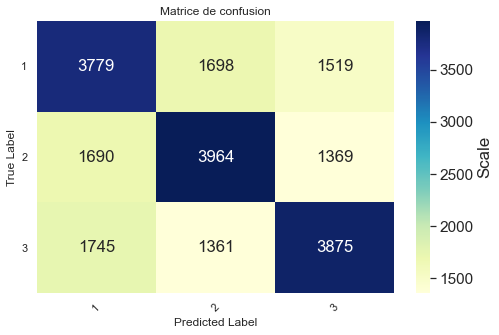

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.5823333333333334
Accuracy : 0.600
Classification Report
              precision    recall  f1-score   support

           1    0.55982   0.61735   0.58718      6996
           2    0.57306   0.67735   0.62086      7023
           3    0.70586   0.50394   0.58805      6981

    accuracy                        0.59971     21000
   macro avg    0.61291   0.59955   0.59869     21000
weighted avg    0.61280   0.59971   0.59873     21000



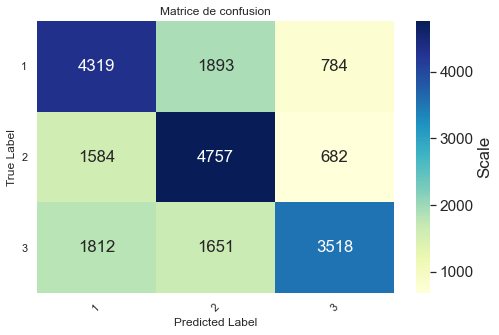

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.5687777777777778
Accuracy : 0.589
Classification Report
              precision    recall  f1-score   support

           1    0.57387   0.52301   0.54726      6996
           2    0.59372   0.56286   0.57788      7023
           3    0.59691   0.68113   0.63625      6981

    accuracy                        0.58890     21000
   macro avg    0.58817   0.58900   0.58713     21000
weighted avg    0.58817   0.58890   0.58708     21000



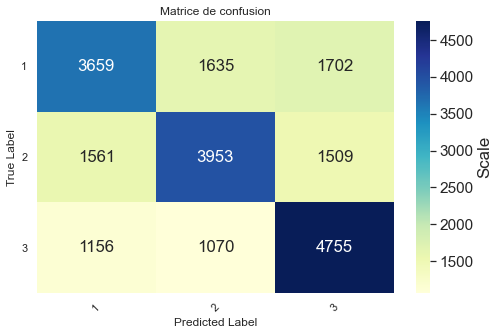

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.5752222222222222
Accuracy : 0.592
Classification Report
              precision    recall  f1-score   support

           1    0.58465   0.58691   0.58578      6996
           2    0.58819   0.59305   0.59061      7023
           3    0.60455   0.59719   0.60085      6981

    accuracy                        0.59238     21000
   macro avg    0.59247   0.59238   0.59241     21000
weighted avg    0.59245   0.59238   0.59240     21000



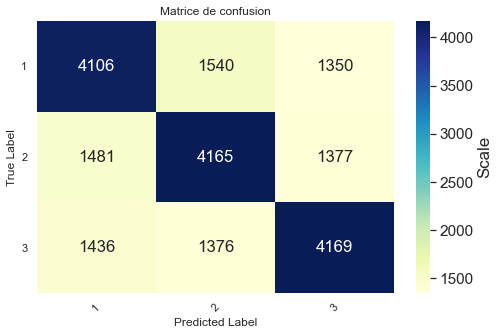

En utilisent source et text claims comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.49144444444444446
Accuracy : 0.507
Classification Report
              precision    recall  f1-score   support

           1    0.51527   0.53545   0.52516      6996
           2    0.49406   0.74612   0.59448      7023
           3    0.53265   0.23836   0.32934      6981

    accuracy                        0.50714     21000
   macro avg    0.51399   0.50664   0.48299     21000
weighted avg    0.51395   0.50714   0.48325     21000



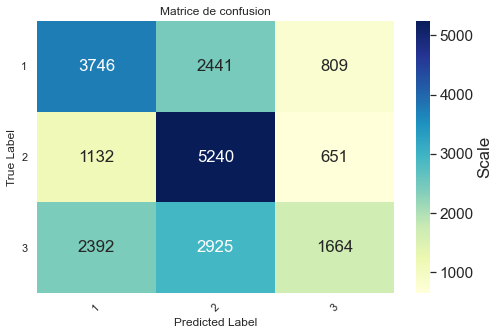

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.5617777777777778
Accuracy : 0.572
Classification Report
              precision    recall  f1-score   support

           1    0.56735   0.54188   0.55432      6996
           2    0.55124   0.67322   0.60615      7023
           3    0.60739   0.49950   0.54818      6981

    accuracy                        0.57171     21000
   macro avg    0.57532   0.57153   0.56955     21000
weighted avg    0.57527   0.57171   0.56962     21000



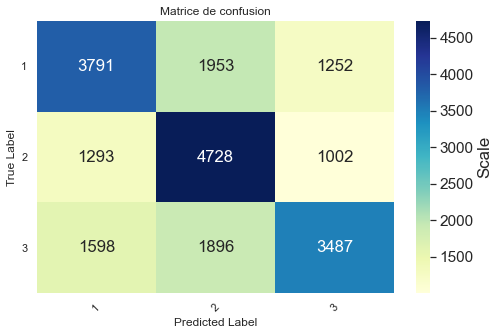

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.5923333333333333
Accuracy : 0.612
Classification Report
              precision    recall  f1-score   support

           1    0.58824   0.58362   0.58592      6996
           2    0.56041   0.77147   0.64921      7023
           3    0.76361   0.48030   0.58969      6981

    accuracy                        0.61210     21000
   macro avg    0.63742   0.61180   0.60828     21000
weighted avg    0.63723   0.61210   0.60834     21000



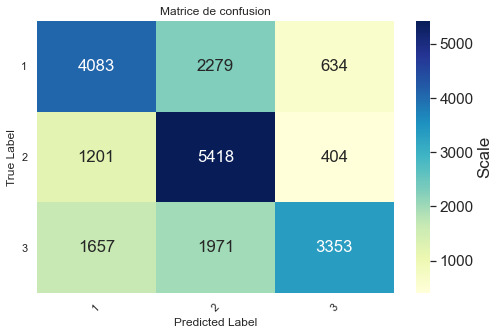

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.5767777777777777
Accuracy : 0.596
Classification Report
              precision    recall  f1-score   support

           1    0.58082   0.53774   0.55845      6996
           2    0.60429   0.56514   0.58406      7023
           3    0.60063   0.68443   0.63980      6981

    accuracy                        0.59567     21000
   macro avg    0.59525   0.59577   0.59410     21000
weighted avg    0.59526   0.59567   0.59406     21000



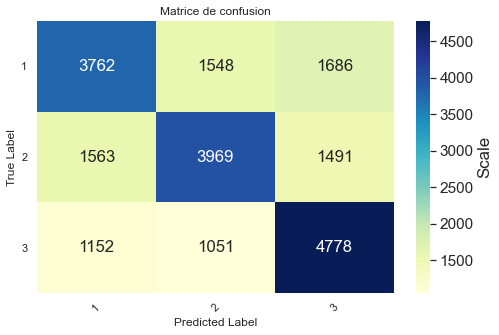

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.5814444444444444
Accuracy : 0.596
Classification Report
              precision    recall  f1-score   support

           1    0.59484   0.57061   0.58248      6996
           2    0.58492   0.62965   0.60646      7023
           3    0.60811   0.58616   0.59694      6981

    accuracy                        0.59552     21000
   macro avg    0.59596   0.59547   0.59529     21000
weighted avg    0.59594   0.59552   0.59530     21000



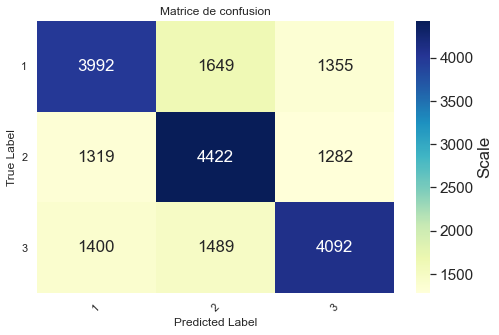

En utilisent text claims et author comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.5075555555555555
Accuracy : 0.519
Classification Report
              precision    recall  f1-score   support

           1    0.53557   0.58977   0.56136      6996
           2    0.50764   0.72889   0.59847      7023
           3    0.51370   0.23636   0.32375      6981

    accuracy                        0.51881     21000
   macro avg    0.51897   0.51834   0.49453     21000
weighted avg    0.51896   0.51881   0.49478     21000



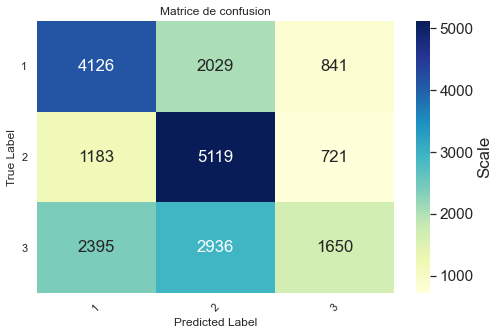

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.5812222222222221
Accuracy : 0.589
Classification Report
              precision    recall  f1-score   support

           1    0.59279   0.58262   0.58766      6996
           2    0.56819   0.68874   0.62268      7023
           3    0.61540   0.49463   0.54844      6981

    accuracy                        0.58886     21000
   macro avg    0.59212   0.58866   0.58626     21000
weighted avg    0.59208   0.58886   0.58634     21000



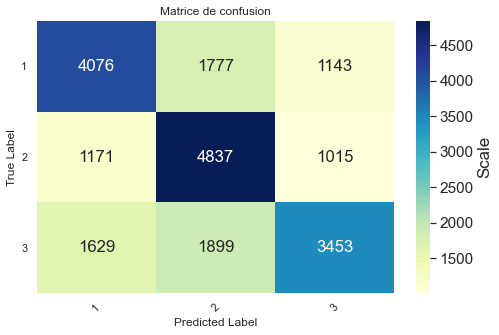

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6045555555555555
Accuracy : 0.629
Classification Report
              precision    recall  f1-score   support

           1    0.60056   0.64194   0.62056      6996
           2    0.58870   0.75224   0.66050      7023
           3    0.75308   0.49062   0.59415      6981

    accuracy                        0.62852     21000
   macro avg    0.64745   0.62827   0.62507     21000
weighted avg    0.64730   0.62852   0.62514     21000



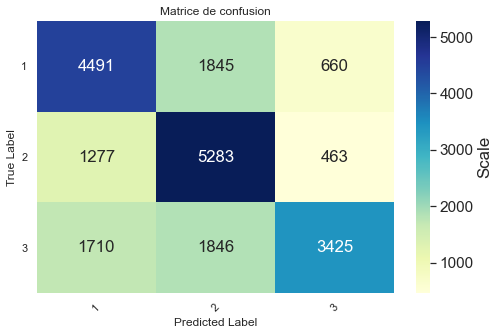

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.5977777777777777
Accuracy : 0.614
Classification Report
              precision    recall  f1-score   support

           1    0.61044   0.55503   0.58142      6996
           2    0.62319   0.59319   0.60782      7023
           3    0.61038   0.69546   0.65015      6981

    accuracy                        0.61448     21000
   macro avg    0.61467   0.61456   0.61313     21000
weighted avg    0.61468   0.61448   0.61310     21000



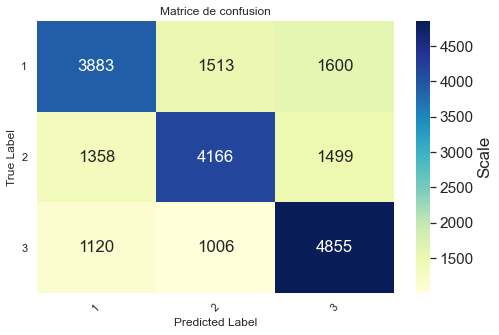

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.597
Accuracy : 0.612
Classification Report
              precision    recall  f1-score   support

           1    0.61836   0.60563   0.61193      6996
           2    0.60489   0.63349   0.61886      7023
           3    0.61269   0.59619   0.60433      6981

    accuracy                        0.61181     21000
   macro avg    0.61198   0.61177   0.61171     21000
weighted avg    0.61197   0.61181   0.61172     21000



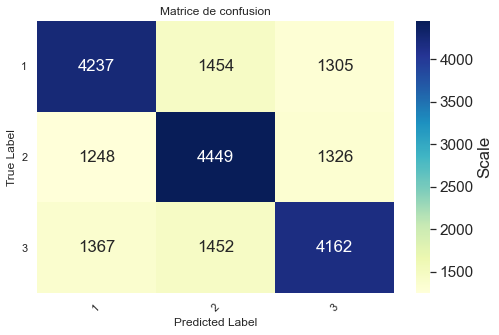

En utilisent text claims, headline et author comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.523
Accuracy : 0.545
Classification Report
              precision    recall  f1-score   support

           1    0.55914   0.60878   0.58291      6996
           2    0.52574   0.75623   0.62026      7023
           3    0.57086   0.26830   0.36504      6981

    accuracy                        0.54490     21000
   macro avg    0.55191   0.54444   0.52273     21000
weighted avg    0.55187   0.54490   0.52297     21000



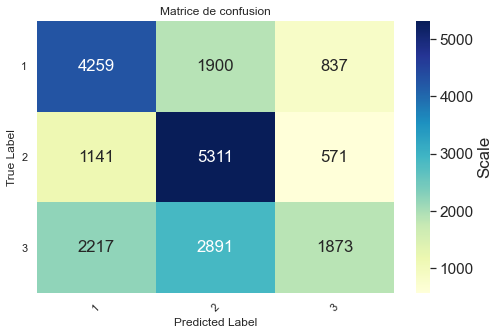

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6024444444444444
Accuracy : 0.620
Classification Report
              precision    recall  f1-score   support

           1    0.62173   0.60778   0.61467      6996
           2    0.60251   0.69714   0.64638      7023
           3    0.64126   0.55436   0.59465      6981

    accuracy                        0.61990     21000
   macro avg    0.62183   0.61976   0.61857     21000
weighted avg    0.62179   0.61990   0.61862     21000



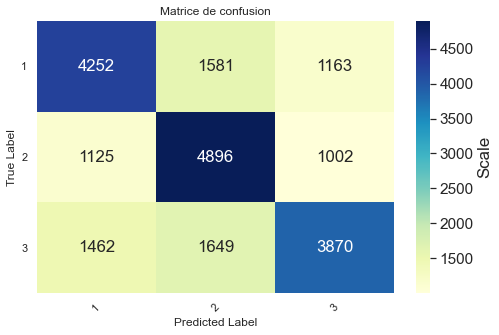

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6279999999999999
Accuracy : 0.653
Classification Report
              precision    recall  f1-score   support

           1    0.62581   0.67796   0.65084      6996
           2    0.60131   0.76064   0.67165      7023
           3    0.79899   0.51927   0.62945      6981

    accuracy                        0.65286     21000
   macro avg    0.67537   0.65262   0.65065     21000
weighted avg    0.67518   0.65286   0.65069     21000



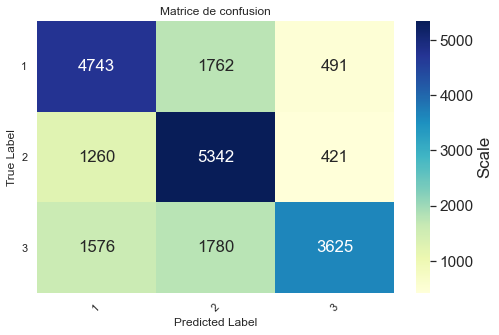

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.6204444444444445
Accuracy : 0.636
Classification Report
              precision    recall  f1-score   support

           1    0.63032   0.58905   0.60898      6996
           2    0.64497   0.60402   0.62382      7023
           3    0.63373   0.71580   0.67227      6981

    accuracy                        0.63619     21000
   macro avg    0.63634   0.63629   0.63503     21000
weighted avg    0.63635   0.63619   0.63499     21000



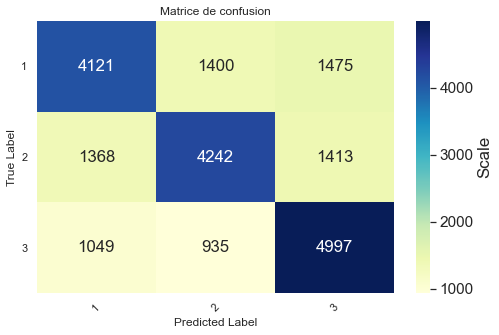

Alogrithm: SVM
best params: {'clf__C': 10, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6187777777777778
Accuracy : 0.636
Classification Report
              precision    recall  f1-score   support

           1    0.60942   0.61221   0.61081      6996
           2    0.65264   0.59391   0.62189      7023
           3    0.64556   0.70105   0.67216      6981

    accuracy                        0.63562     21000
   macro avg    0.63587   0.63572   0.63495     21000
weighted avg    0.63589   0.63562   0.63491     21000



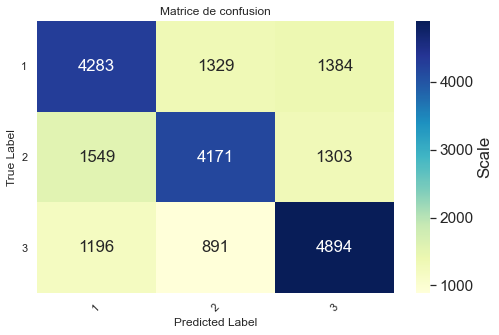

En utilisent text claims, headline, author et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.5572068039391226
Accuracy : 0.546
Classification Report
              precision    recall  f1-score   support

           1    0.55065   0.66632   0.60299      4813
           2    0.52859   0.70920   0.60572      3989
           3    0.58158   0.25526   0.35480      4231

    accuracy                        0.54600     13033
   macro avg    0.55361   0.54359   0.52117     13033
weighted avg    0.55394   0.54600   0.52325     13033



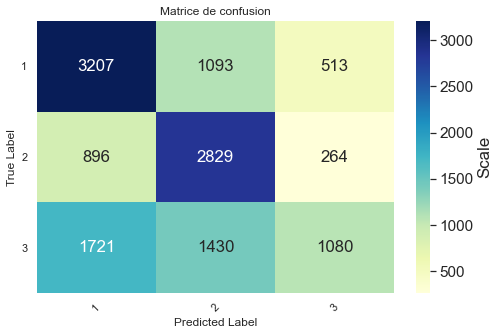

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6241718889883617
Accuracy : 0.629
Classification Report
              precision    recall  f1-score   support

           1    0.63354   0.64367   0.63857      4813
           2    0.59642   0.69391   0.64148      3989
           3    0.66533   0.55070   0.60261      4231

    accuracy                        0.62887     13033
   macro avg    0.63177   0.62943   0.62755     13033
weighted avg    0.63250   0.62887   0.62779     13033



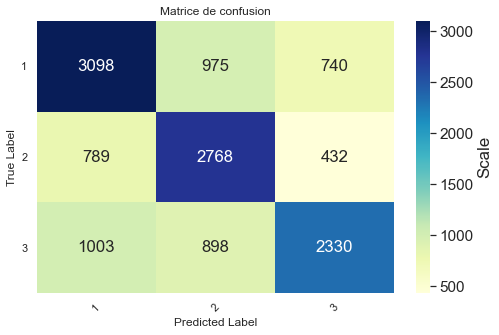

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6356311548791406
Accuracy : 0.639
Classification Report
              precision    recall  f1-score   support

           1    0.60833   0.73738   0.66667      4813
           2    0.58795   0.72900   0.65092      3989
           3    0.83222   0.44316   0.57835      4231

    accuracy                        0.63930     13033
   macro avg    0.67617   0.63651   0.63198     13033
weighted avg    0.67478   0.63930   0.63318     13033



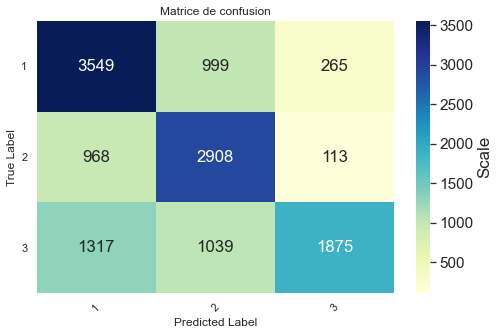

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.6205908683974932
Accuracy : 0.630
Classification Report
              precision    recall  f1-score   support

           1    0.63631   0.61978   0.62793      4813
           2    0.60798   0.60341   0.60569      3989
           3    0.64227   0.66580   0.65382      4231

    accuracy                        0.62971     13033
   macro avg    0.62885   0.62966   0.62915     13033
weighted avg    0.62957   0.62971   0.62953     13033



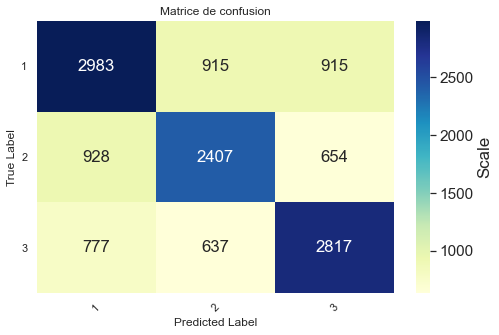

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6164726947179946
Accuracy : 0.621
Classification Report
              precision    recall  f1-score   support

           1    0.60742   0.67318   0.63861      4813
           2    0.60314   0.61569   0.60935      3989
           3    0.66033   0.56606   0.60957      4231

    accuracy                        0.62081     13033
   macro avg    0.62363   0.61831   0.61918     13033
weighted avg    0.62329   0.62081   0.62023     13033



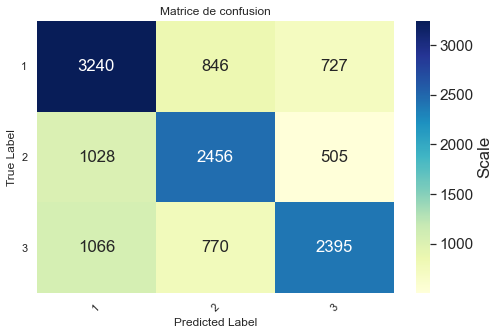

En utilisent text claims, headline, author,keywords et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.5422748097243775
Accuracy : 0.548
Classification Report
              precision    recall  f1-score   support

           1    0.57876   0.61251   0.59516      4493
           2    0.52288   0.74961   0.61605      3826
           3    0.54593   0.27182   0.36294      3826

    accuracy                        0.54837     12145
   macro avg    0.54919   0.54465   0.52471     12145
weighted avg    0.55081   0.54837   0.52858     12145



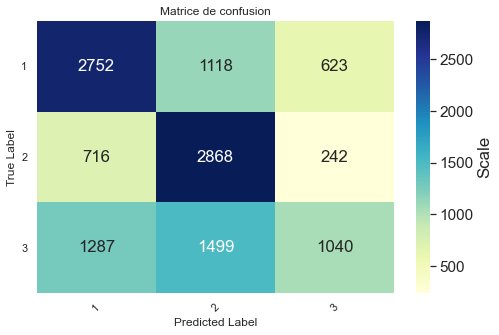

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6149104041971476
Accuracy : 0.640
Classification Report
              precision    recall  f1-score   support

           1    0.66698   0.63744   0.65187      4493
           2    0.60447   0.71458   0.65493      3826
           3    0.65505   0.56979   0.60945      3826

    accuracy                        0.64043     12145
   macro avg    0.64216   0.64060   0.63875     12145
weighted avg    0.64353   0.64043   0.63947     12145



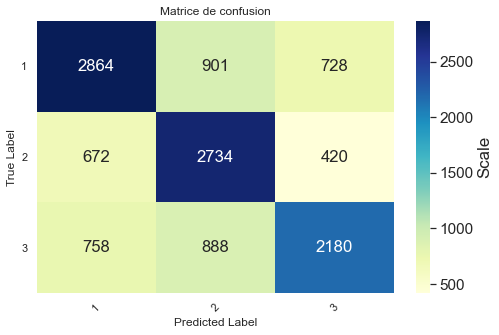

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6241332298825094
Accuracy : 0.648
Classification Report
              precision    recall  f1-score   support

           1    0.64674   0.69352   0.66932      4493
           2    0.58189   0.78280   0.66756      3826
           3    0.80505   0.45870   0.58442      3826

    accuracy                        0.64767     12145
   macro avg    0.67789   0.64501   0.64043     12145
weighted avg    0.67618   0.64767   0.64202     12145



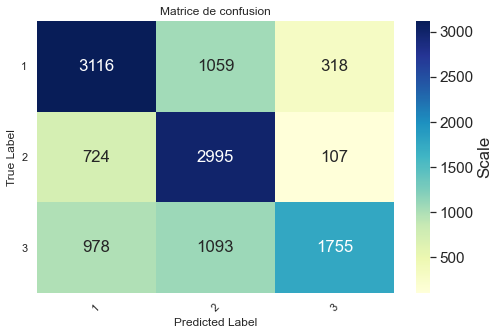

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.6101056676272815
Accuracy : 0.648
Classification Report
              precision    recall  f1-score   support

           1    0.65994   0.64055   0.65010      4493
           2    0.63200   0.63696   0.63447      3826
           3    0.65199   0.66937   0.66056      3826

    accuracy                        0.64850     12145
   macro avg    0.64798   0.64896   0.64838     12145
weighted avg    0.64863   0.64850   0.64847     12145



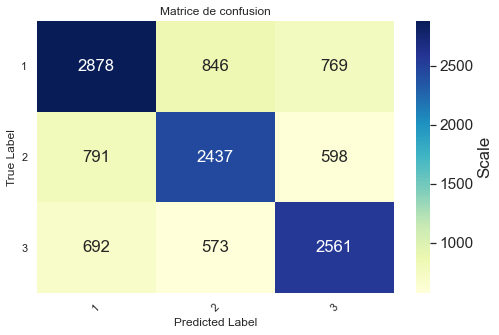

Alogrithm: SVM
best params: {'clf__C': 10, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6170272666814454
Accuracy : 0.641
Classification Report
              precision    recall  f1-score   support

           1    0.63678   0.64500   0.64087      4493
           2    0.63568   0.61657   0.62598      3826
           3    0.65027   0.65996   0.65508      3826

    accuracy                        0.64076     12145
   macro avg    0.64091   0.64051   0.64064     12145
weighted avg    0.64068   0.64076   0.64065     12145



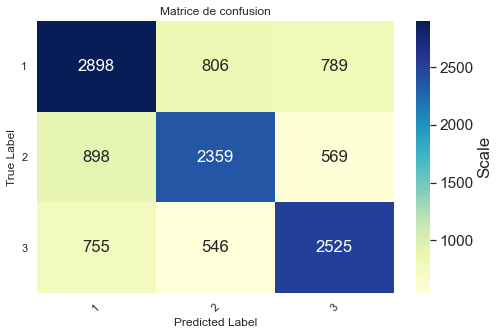

En utilisent text claims, source, headline, author, keywords et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.5413164117342791
Accuracy : 0.554
Classification Report
              precision    recall  f1-score   support

           1    0.58515   0.61028   0.59745      4493
           2    0.52581   0.75876   0.62116      3826
           3    0.55779   0.28254   0.37509      3826

    accuracy                        0.55381     12145
   macro avg    0.55625   0.55053   0.53123     12145
weighted avg    0.55784   0.55381   0.53487     12145



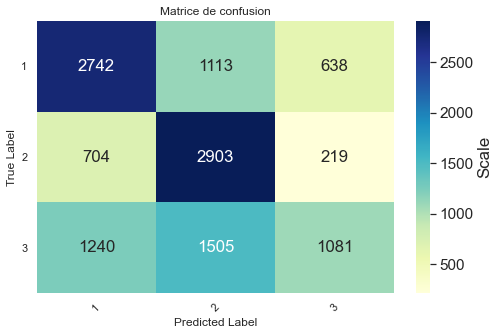

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.615488989876598
Accuracy : 0.641
Classification Report
              precision    recall  f1-score   support

           1    0.67290   0.63232   0.65198      4493
           2    0.60611   0.71589   0.65644      3826
           3    0.64630   0.57501   0.60858      3826

    accuracy                        0.64059     12145
   macro avg    0.64177   0.64107   0.63900     12145
weighted avg    0.64348   0.64059   0.63971     12145



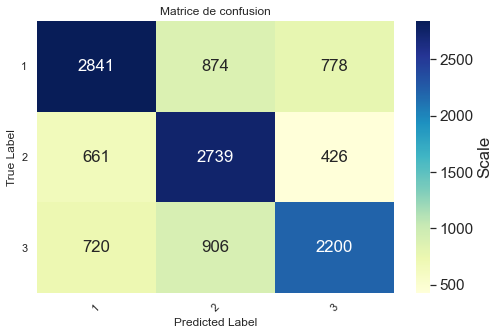

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6199063400576369
Accuracy : 0.642
Classification Report
              precision    recall  f1-score   support

           1    0.64736   0.67906   0.66283      4493
           2    0.57479   0.79247   0.66630      3826
           3    0.79277   0.44694   0.57162      3826

    accuracy                        0.64166     12145
   macro avg    0.67164   0.63949   0.63358     12145
weighted avg    0.67030   0.64166   0.63519     12145



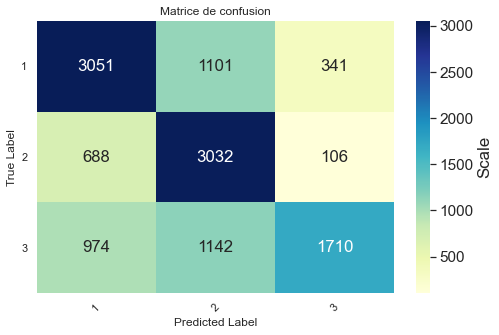

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.001}
best scores: 0.6135644350846079
Accuracy : 0.648
Classification Report
              precision    recall  f1-score   support

           1    0.65932   0.63922   0.64911      4493
           2    0.63154   0.63748   0.63450      3826
           3    0.65037   0.66754   0.65884      3826

    accuracy                        0.64759     12145
   macro avg    0.64708   0.64808   0.64748     12145
weighted avg    0.64775   0.64759   0.64757     12145



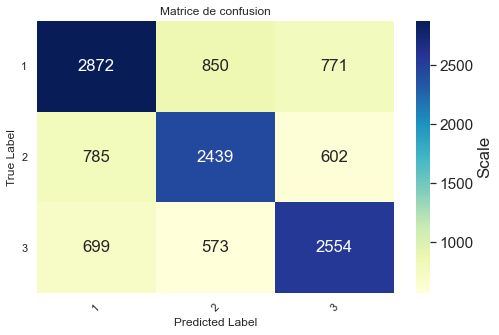

Alogrithm: SVM
best params: {'clf__C': 10, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6197169881031552
Accuracy : 0.644
Classification Report
              precision    recall  f1-score   support

           1    0.64160   0.64745   0.64451      4493
           2    0.63766   0.62049   0.62896      3826
           3    0.65149   0.66205   0.65673      3826

    accuracy                        0.64356     12145
   macro avg    0.64358   0.64333   0.64340     12145
weighted avg    0.64347   0.64356   0.64346     12145



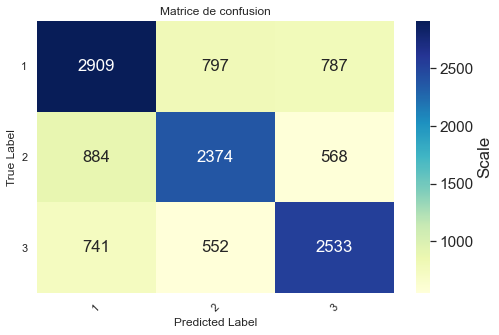

En utilisent text claims, headline, author,keywords,named_entities_claim et named_entities_article comme jeu de donnée
Alogrithm: ADB
best params: {'clf__learning_rate': 0.3, 'clf__n_estimators': 200}
best scores: 0.5528622626173058
Accuracy : 0.559
Classification Report
              precision    recall  f1-score   support

           1    0.58184   0.65063   0.61432      4491
           2    0.53179   0.73908   0.61853      3825
           3    0.57349   0.27033   0.36745      3825

    accuracy                        0.55869     12141
   macro avg    0.56237   0.55335   0.53343     12141
weighted avg    0.56344   0.55869   0.53787     12141



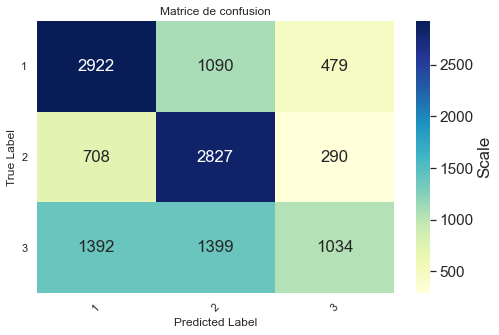

Alogrithm: GBC
best params: {'clf__learning_rate': 0.3, 'clf__max_depth': 3, 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.6403301189684475
Accuracy : 0.650
Classification Report
              precision    recall  f1-score   support

           1    0.66552   0.64418   0.65467      4491
           2    0.61783   0.71556   0.66311      3825
           3    0.67301   0.59190   0.62985      3825

    accuracy                        0.65019     12141
   macro avg    0.65212   0.65054   0.64921     12141
weighted avg    0.65285   0.65019   0.64951     12141



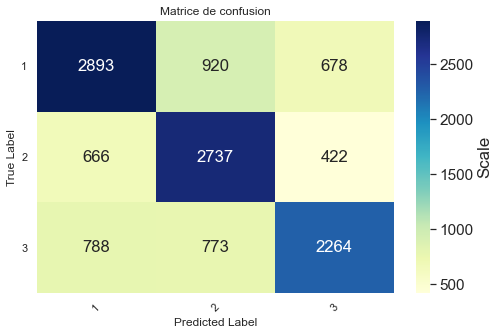

Alogrithm: RFC
best params: {'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
best scores: 0.653982856720609
Accuracy : 0.664
Classification Report
              precision    recall  f1-score   support

           1    0.64512   0.71120   0.67655      4491
           2    0.59125   0.80209   0.68072      3825
           3    0.89755   0.46954   0.61655      3825

    accuracy                        0.66370     12141
   macro avg    0.71131   0.66094   0.65794     12141
weighted avg    0.70768   0.66370   0.65896     12141



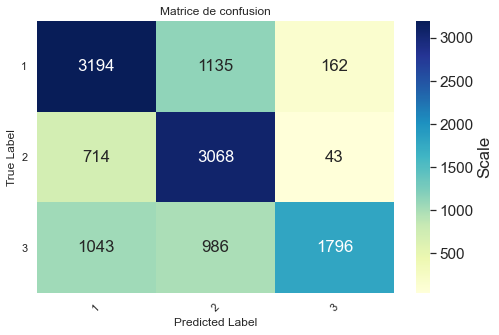

Alogrithm: logisticRegression
best params: {'clf__C': 1000, 'clf__tol': 0.0001}
best scores: 0.6407130717505357
Accuracy : 0.651
Classification Report
              precision    recall  f1-score   support

           1    0.65856   0.64551   0.65197      4491
           2    0.63034   0.65935   0.64452      3825
           3    0.66346   0.64837   0.65582      3825

    accuracy                        0.65077     12141
   macro avg    0.65079   0.65108   0.65077     12141
weighted avg    0.65121   0.65077   0.65084     12141



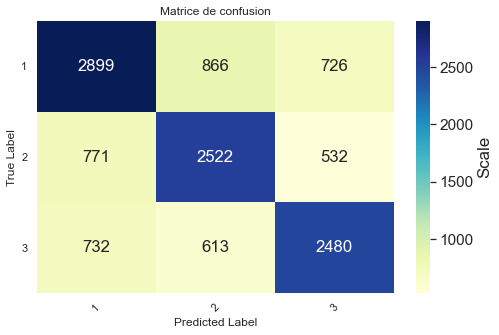

Alogrithm: SVM
best params: {'clf__C': 1, 'clf__gamma': 1, 'clf__kernel': 'linear'}
best scores: 0.6420607034656026
Accuracy : 0.650
Classification Report
              precision    recall  f1-score   support

           1    0.65591   0.67446   0.66506      4491
           2    0.61937   0.70405   0.65900      3825
           3    0.68378   0.56758   0.62029      3825

    accuracy                        0.65011     12141
   macro avg    0.65302   0.64870   0.64811     12141
weighted avg    0.65318   0.65011   0.64904     12141



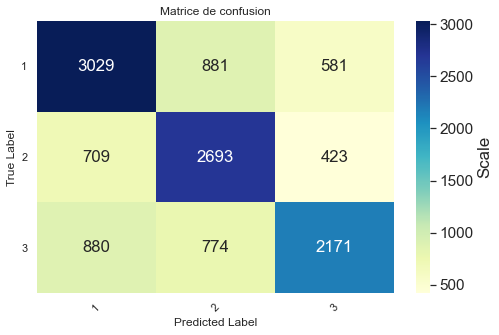

In [41]:
text_normalizer = TextNormalizer()
bestScoredAlgo = []
print("En utilisent text claims comme jeu de donnée")
features = np.array(["text"])
score = classification_avec_pretraitement(features,text_normalizer,dfVFM_over)
bestScoredAlgo.append(score)
print("En utilisent source et text claims comme jeu de donnée")
features = np.array(["source","text"])
score = classification_avec_pretraitement(features,text_normalizer,dfVFM_over)
bestScoredAlgo.append(score)
print("En utilisent text claims et author comme jeu de donnée")
features = np.array(["text","author"])
score = classification_avec_pretraitement(features,text_normalizer,dfVFM_over)
bestScoredAlgo.append(score)
print("En utilisent text claims, headline et author comme jeu de donnée")
features = np.array(["text","headline","author"])
score = classification_avec_pretraitement(features,text_normalizer,dfVFM_over)
bestScoredAlgo.append(score)
print("En utilisent text claims, headline, author et named_entities_article comme jeu de donnée")
dfn=dfVFM_over.copy()
features = np.array(["text","headline","author","named_entities_article"])
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)
score=classification_avec_pretraitement(features,text_normalizer,dfn)
bestScoredAlgo.append(score)
print("En utilisent text claims, headline, author,keywords et named_entities_article comme jeu de donnée")
features = np.array(["text","headline","author","named_entities_article","keywords"])
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
score=classification_avec_pretraitement(features,text_normalizer,dfn)
bestScoredAlgo.append(score)
print("En utilisent text claims, source, headline, author, keywords et named_entities_article comme jeu de donnée")
features = np.array(["text","source","headline","author","named_entities_article","keywords"])
dfn['keywords'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['keywords'], inplace=True)
score=classification_avec_pretraitement(features,text_normalizer,dfn)
bestScoredAlgo.append(score)
print("En utilisent text claims, headline, author,keywords,named_entities_claim et named_entities_article comme jeu de donnée")
dfn['named_entities_claim'].replace("", np.nan, inplace=True)
dfn.dropna(subset=['named_entities_claim'], inplace=True)
features = np.array(["text","headline","author","named_entities_article","keywords","named_entities_claim"])
score=classification_avec_pretraitement(features,text_normalizer,dfn)

In [42]:
bestScoredAlgo.sort(key=lambda x: x[3],reverse=True)
print("Le Meilleur score est: "+str(bestScoredAlgo[0][3]))
print("-------------------------")
print("tri du meilleur score et meilleur algorithme de chaque features")
for i in range(len(bestScoredAlgo)):
    print("Features :"+str(bestScoredAlgo[i][0]))
    print("Meilleur Score :"+str(bestScoredAlgo[i][3]))
    print("Générer par l'Algorithm :"+str(bestScoredAlgo[i][2]))
    print("En utilisent le meilleur Parametre :"+str(bestScoredAlgo[i][4]))
    print("-------------------------")

Le Meilleur score est: 0.6356311548791406
-------------------------
tri du meilleur score et meilleur algorithme de chaque features
Features :['text' 'headline' 'author' 'named_entities_article']
Meilleur Score :0.6356311548791406
Générer par l'Algorithm :RFC
En utilisent le meilleur Parametre :{'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
-------------------------
Features :['text' 'headline' 'author']
Meilleur Score :0.6279999999999999
Générer par l'Algorithm :RFC
En utilisent le meilleur Parametre :{'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
-------------------------
Features :['text' 'headline' 'author' 'named_entities_article' 'keywords']
Meilleur Score :0.6241332298825094
Générer par l'Algorithm :RFC
En utilisent le meilleur Parametre :{'clf__criterion': 'gini', 'clf__min_samples_leaf': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 200}
--------

- Nous remarquons que le comportement des algorithme avant  et aprés l'equilibrage en utilisent le Random over sampling n'a pas changer, par contre il a un changement dans les features, la features text,headline,author nous a donner des meilleur résultat alors que c'était pas le cas avant.

- Nous déduisons que le meilleur Algorihm est RFC ___RandomForestClassifier___, et les meilleurs features sont :
  - text, headline, author
  - text, headline, author, named_entities_article

Ces deux features nous donnent des résultats qui sont trés proche, c'est pour cela nous allons lancer la cross validation pour décider qui est la meilleur features

### Cross Validation

- Cross validation sur la features text, headline et author

In [44]:


# selection des données
features = np.array(['text','headline','author'])


X=dfVFM_over[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
y=dfVFM_over.truthRating
# Création d'un jeu d'apprentissage et de test
trainsize=0.7 # 70% pour le jeu d'apprentissage, il reste 30% du jeu de données pour le test
testsize= 0.3
seed=30
X_train,X_test,y_train,y_test=train_test_split(X, 
                                               y, 
                                               train_size=trainsize, 
                                               random_state=seed,
                                               test_size=testsize)

# création du pipeline en ajoutant le classifier
text_normalizer = TextNormalizer(removestopwords=True, # suppression des stopwords
                 lowercase=True,# passage en minuscule
                 removedigit=False, # supprimer les nombres 
                 transformdigit=False, # transforamation des chiffre en lettres
                 getstemmer=False,# racinisation des termes 
                 getlemmatisation=True, # lemmatisation des termes 
                 remove_non_ascii=False # supprimer les caractéres non ascii
                 )
pipe = Pipeline([("cleaner", text_normalizer),
                 ("count_vectorizer", TfidfVectorizer()),
                 ("RFC", RandomForestClassifier(
                 n_estimators=200, criterion='gini',min_samples_split=2,min_samples_leaf=2
                 ))])
pipe.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [45]:
seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)
scoring = 'accuracy'
print('Cross validation ...')
score = cross_val_score(pipe, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std()) 

Cross validation ...
Les différentes accuracy pour les 10 évaluations sont [0.772      0.76366667 0.76433333 0.75733333 0.774      0.755
 0.75233333 0.748      0.75566667 0.777     ] 

Accuracy moyenne :  0.7619333333333332  standard deviation 0.009367556304133502


- Cross validation sur la features text, headline, author et named_entities_article

In [46]:

# selection des données

dfn=dfVFM_over.copy()
features = np.array(["text","headline","author","named_entities_article"])
dfn['named_entities_article'].replace('', np.nan, inplace=True)
dfn.dropna(subset=['named_entities_article'], inplace=True)

X=dfn[features].apply(lambda x: ','.join(x.dropna().astype(str)),axis=1)
y=dfn.truthRating
# Création d'un jeu d'apprentissage et de test
trainsize=0.7 # 70% pour le jeu d'apprentissage, il reste 30% du jeu de données pour le test
testsize= 0.3
seed=30
X_train,X_test,y_train,y_test=train_test_split(X, 
                                               y, 
                                               train_size=trainsize, 
                                               random_state=seed,
                                               test_size=testsize)

# création du pipeline en ajoutant le classifier
text_normalizer = TextNormalizer(removestopwords=True, # suppression des stopwords
                 lowercase=True,# passage en minuscule
                 removedigit=False, # supprimer les nombres 
                 transformdigit=False, # transforamation des chiffre en lettres
                 getstemmer=False,# racinisation des termes 
                 getlemmatisation=True, # lemmatisation des termes 
                 remove_non_ascii=False # supprimer les caractéres non ascii
                 )
pipe = Pipeline([("cleaner", text_normalizer),
                 ("count_vectorizer", TfidfVectorizer()),
                 ("RFC", RandomForestClassifier(
                 n_estimators=200, criterion='gini',min_samples_split=2,min_samples_leaf=2
                 ))])
pipe.fit(X_train,y_train)

print("pipeline créé")

pipeline créé


In [47]:
seed=7
k_fold = KFold(n_splits=10, shuffle=True, random_state=seed)
scoring = 'accuracy'
print('Cross validation ...')
score = cross_val_score(pipe, X, y, cv=k_fold, scoring=scoring)
print('Les différentes accuracy pour les 10 évaluations sont',score,'\n')
print ('Accuracy moyenne : ',score.mean(),' standard deviation', score.std()) 

Cross validation ...
Les différentes accuracy pour les 10 évaluations sont [0.76745435 0.76315789 0.75402793 0.75349087 0.77712137 0.7755102
 0.77175081 0.75026853 0.76894143 0.75067168] 

Accuracy moyenne :  0.763239506611774  standard deviation 0.009859450235249537


- Apres avoir comparer le résultat des deux cross validation nous déduisons que la meilleurs features est :
   - "text","headline","author","named_entities_article"